<a href="https://colab.research.google.com/github/rajeshkpandey/AWESOME-FER/blob/master/Epidemics_ABM_Viral_low.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

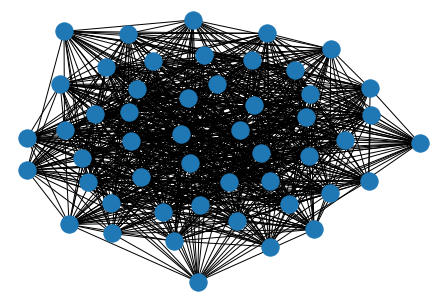

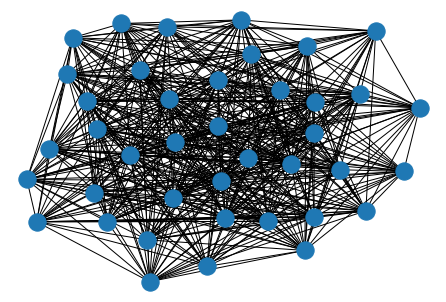

In [1]:
#Erdos-Renyi Graph in Networkx
import random
import copy
from networkx import nx
import matplotlib.pyplot as plt

N = 50  # 50 Indian Cities
K = 10000  # 10000 Agents(people under observation on SIR modeling)
#M = 30  # 30 Edges
NN = 40 # 50 nodes contact network of Cities


#Graph = nx.gnm_random_graph(N, M)

P = .7 #Probabibilty for Node Connection in random graph
PP = .7
Graph = nx.erdos_renyi_graph(N,P) # Use Networkx to generate a random graph of N nodes being connected with probability P.
GraphN = nx.erdos_renyi_graph(NN,PP)


# some network properties
#print("the adjacency list")
#for line in nx.generate_adjlist(Graph):
#    print(line)

nx.draw(Graph)
plt.show()
nx.draw(GraphN)
plt.show()

In [2]:
#!jupyter notebook --generate-config

In [3]:
#%%writefile /root/.jupyter/jupyter_notebook_config.py
#NotebookApp.iopub_data_rate_limit =
#NotebookApp.rate_limit_window =

In [4]:
#%pycat /root/.jupyter/jupyter_notebook_config.py

In [5]:
A = nx.adjacency_matrix(Graph)
Adjacency_matrix = A.todense()
AN = nx.adjacency_matrix(GraphN)
Adjacency_matrixN = AN.todense()
print(Adjacency_matrix)
print(Adjacency_matrixN)

[[0 1 1 ... 0 0 1]
 [1 0 0 ... 0 1 0]
 [1 0 0 ... 0 0 1]
 ...
 [0 0 0 ... 0 1 0]
 [0 1 0 ... 1 0 0]
 [1 0 1 ... 0 0 0]]
[[0 1 1 ... 1 1 1]
 [1 0 1 ... 1 1 1]
 [1 1 0 ... 0 1 1]
 ...
 [1 1 0 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]]


In [6]:
#Empty Node Dictionary [ A Dictionary consisting list of agent states on Graph Nodes]
Node = {}
print(Node)
for i in range(N):
  for j in range(NN):
    Node[i*NN+j] = list()
#print(Node)
print(len(Node))


{}
2000


In [7]:
#Adding Viral_Index Randomly
for i in range(N):
  for j in range(NN):
    Viral_load=0
    Node[i*NN+j].append({'Viral_load' : Viral_load})
    Node[i*NN+j].append({'S' : 0})
    Node[i*NN+j].append({'I' : 0})
    Node[i*NN+j].append({'R' : 0})
#print(Node)
print(len(Node))


2000


In [8]:
#Initailizing randomly infection state [0 shows Susceptible, 1 shows Infected, and 2 shows Recovered]
Agent = {}
for k in range(K):
  Agent[k] = list() 
for k in range(K):
  Rand_node=random.randint(0,N-1)
  Neighbors = list(Graph.neighbors(Rand_node))
  Rand_nodeN=random.randint(0,NN-1)
  First_nodeN = random.randint(0,NN-1)
  Second_nodeN = random.randint(0,NN-1)
  Rand_state=random.choices([0,1],weights=(98,2),k=1)[0]
  Rand_neighbors = list(GraphN.neighbors(Rand_nodeN))
  Rand_neighbors1 = list(GraphN.neighbors(First_nodeN))
  Rand_neighbors2 = list(GraphN.neighbors(Second_nodeN))
  if len(Rand_neighbors) > 0:
    Rand_nodeN1=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN1)
  else:
    Rand_nodeN1=Rand_nodeN
  
  if len(Rand_neighbors) > 0:
    Rand_nodeN2=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN2)
    if Rand_nodeN2 not in list(GraphN.neighbors(Rand_nodeN1)):
      Rand_nodeN2=Rand_nodeN1
  else:
    Rand_nodeN2=Rand_nodeN1
  
  if Rand_state == 0:
    Node[Rand_node*NN+Rand_nodeN][1]['S']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})
  elif Rand_state == 1:
    Node[Rand_node*NN+Rand_nodeN][2]['I']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state, 'V_l' : 1})
    Agent[k].append({'State' : Rand_state, 'V_l' : 1 })
  else:
    Node[Rand_node*NN+Rand_nodeN][3]['R']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})

  #Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
  #Agent[k].append({'State' : Rand_state})
  Agent[k].append({'Home_node' : Rand_node})
  Agent[k].append({'Home_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
  
  if len(Neighbors) > 0:
    First_node = random.choice(Neighbors)
    Neighbors.remove(First_node)
  else:
    First_node = Rand_node
  if len(Neighbors) > 0:
    Second_node = random.choice(Neighbors)
  else:
    Second_node = Rand_node

  if len(Rand_neighbors1) > 0:
    First_nodeN1=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN1)
  else:
    First_nodeN1=First_nodeN
  
  if len(Rand_neighbors1) > 0:
    First_nodeN2=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN2)
    if First_nodeN2 not in list(GraphN.neighbors(First_nodeN1)):
      First_nodeN2=First_nodeN1
  else:
    First_nodeN2=First_nodeN1

  if len(Rand_neighbors2) > 0:
    Second_nodeN1=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN1)
  else:
    Second_nodeN1=Second_nodeN
  
  if len(Rand_neighbors2) > 0:
    Second_nodeN2=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN2)
    if Second_nodeN2 not in list(GraphN.neighbors(Second_nodeN1)):
      Second_nodeN2=Second_nodeN1
  else:
    Second_nodeN2=Second_nodeN1

  Agent[k].append({'First_node' : First_node})
  Agent[k].append({'First_nodeN' : [First_nodeN, First_nodeN1, First_nodeN2]})
  Agent[k].append({'Second_node' : Second_node})
  Agent[k].append({'Second_nodeN' : [Second_nodeN, Second_nodeN1, Second_nodeN2]})
  Agent[k].append({'Current_node' : Rand_node})
  Agent[k].append({'Current_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
#print(Node)
#print(Agent)

In [9]:
print(len(Graph.nodes))
print(len(GraphN.nodes))

50
40


In [10]:
#Random Walk Implementation
def random_walk(Graph=Graph, GraphN=GraphN, Node=Node, Agent=Agent, num_walks=1, num_steps=1):
    walks = list()
    Node_next = {}
    Agent_next = {}
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j] = list() 
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j].append({'Viral_load' : copy.deepcopy(Node[i*len(GraphN.nodes)+j][0]['Viral_load'])/2})
        Node_next[i*len(GraphN.nodes)+j].append({'S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'I' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'R' : 0})
    for i in range(len(Agent)):
      Agent_next[i] = list()
    Agent_next = copy.deepcopy(Agent)
    count_nomove=0
    count_move_first=0
    count_move_second=0
    count_stay_home=0
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        for agent in list(range(4,len(Node[i*len(GraphN.nodes)+j]))):
          a_id = list(Node[i*len(GraphN.nodes)+j][agent].keys())[0]
          #print(a_id)
          #print(Agent[a_id])
          for walk in range(num_walks):
              curr_walk = [i*len(GraphN.nodes)+j]
              cur = i*len(GraphN.nodes)+j
              for step in range(num_steps):
                  neighbors = []
                  #if Agent_next[a_id][1]['Home_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']):
                  neighbors.append(Agent_next[a_id][1]['Home_node'])
                  #if Agent_next[a_id][3]['First_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']):
                  neighbors.append(Agent[a_id][3]['First_node'])
                  #if Agent_next[a_id][5]['Second_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']) :
                  neighbors.append(Agent_next[a_id][5]['Second_node'])

                  if len(neighbors) > 0:
                      if len(neighbors) == 3:
                        PN=(1/(Node[cur][2]['I'] + 1))
                        P = 100-PN 
                        #print(P)
                        #print(PN)
                        next = random.choices(neighbors,weights=(P,PN/2,PN/2), k=1)[0] 
                      elif len(neighbors) == 2:
                        next = random.choices(neighbors,weights=(P,PN), k=1)[0]
                      else:
                        next = random.choices(neighbors,weights=(100), k=1)[0]
                      #next = random.choice(neighbors)
                      if next == Agent_next[a_id][7]['Current_node']:
                        #print("no movement")
                        count_nomove+=1

                      else:
                        if next == Agent_next[a_id][3]['First_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][3]['First_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][4]['First_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][4]['First_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][4]['First_nodeN'][2]
                          count_move_first+=1
                        elif next == Agent_next[a_id][5]['Second_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][5]['Second_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][6]['Second_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][6]['Second_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][6]['Second_nodeN'][2]
                          count_move_second+=1
                        elif next == Agent_next[a_id][1]['Home_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][1]['Home_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][2]['Home_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][2]['Home_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][2]['Home_nodeN'][2]
                          count_stay_home+=1
                      PN1=(1/(Node[cur][2]['I'] + 1))
                      P1 = 100-PN1  
                      nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(P1,PN1/2,PN1/2),k=1)[0]
                      if nextn == Agent_next[a_id][8]['Current_nodeN'][1]:
                        Agent_next[a_id][8]['Current_nodeN'][1],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][1]
                      elif nextn == Agent_next[a_id][8]['Current_nodeN'][2] :
                        Agent_next[a_id][8]['Current_nodeN'][2],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][2]
                      else:
                        Agent_next[a_id][8]['Current_nodeN'][0]=Agent_next[a_id][8]['Current_nodeN'][0]                      
                  nex = next*len(GraphN.nodes)+nextn
          Node_next[nex].append(copy.deepcopy(Node[cur][agent]))
          if Node[cur][agent][a_id] == 0:
            Node_next[nex][1]['S']+=1
          elif Node[cur][agent][a_id] == 1:
            Node_next[nex][2]['I']+=1
            Node_next[nex][-1]['V_l']/=2
            Node_next[nex][0]['Viral_load']+=1
            if nex != cur:
              Node_next[cur][0]['Viral_load']+=1
          elif Node[cur][agent][a_id] == 2:
            Node_next[nex][3]['R']+=1

          curr_walk.append(nex)
          #print(Agent[a_id])
          #print(curr_walk)
          walks.append(nex)
    #print(Node_next)
    #print(Agent_next)

    #State-transition-logic
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        count_SI=0
        count_IR=0
        W1 = Node_next[i*len(GraphN.nodes)+j][2]['I'] + Node_next[i*len(GraphN.nodes)+j][0]['Viral_load']
        W2 = Node_next[i*len(GraphN.nodes)+j][1]['S'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] - 1
        for agent in list(range(4,len(Node_next[i*len(GraphN.nodes)+j]))):
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 0:
            Node_next[i*len(GraphN.nodes)+j][agent][a_id] = random.choices([1,0], weights=(W1,W2), k=1)[0] 
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
              count_SI+=1
              Node_next[i*len(GraphN.nodes)+j][agent].update({'V_l' : 1})
              Agent_next[a_id][0]['State'] = 1
          elif Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
            if Node_next[i*len(GraphN.nodes)+j][agent]['V_l'] < .01:
              Node_next[i*len(GraphN.nodes)+j][agent][a_id] = 2
              count_IR+=1
              Agent_next[a_id][0]['State'] = 2
              Node_next[i*len(GraphN.nodes)+j][agent].pop('V_l') 
        Node_next[i*len(GraphN.nodes)+j][1]['S']-=count_SI
        Node_next[i*len(GraphN.nodes)+j][2]['I']+=(count_SI - count_IR)
        Node_next[i*len(GraphN.nodes)+j][3]['R']+=count_IR 
         
    #print("count_no_movements",count_nomove)
    #print("count_movements_firstnode",count_move_first)
    #print("count_movements_secondnode",count_move_second)
    #print("count_stay_homenode",count_stay_home)  
    return Node,Node_next,Agent,Agent_next

In [11]:
def Count_SIR_Node(Node=Node):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Node)):
    count_S+=Node[i][1]['S'] 
    count_I+=Node[i][2]['I']
    count_R+=Node[i][3]['R'] 
  return count_S,count_I,count_R

In [12]:
def Count_SIR_Agent(Agent=Agent):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Agent)):
    if Agent[i][0]['State'] == 0:
      count_S+=1
    elif Agent[i][0]['State'] == 1:
      count_I+=1
    elif Agent[i][0]['State'] == 2:
      count_R+=1
  return count_S,count_I,count_R 

[9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351, 8276, 8208, 8161, 8117, 8074, 8030, 7992, 7959, 7927, 7892, 7860, 7837, 7819, 7802, 7787, 7776, 7762, 7748, 7737, 7729, 7719, 7710, 7703, 7699, 7696, 7694, 7693, 7693, 7690, 7689, 7688, 7684, 7682, 7681, 7674, 7670, 7665, 7663, 7662, 7660, 7658, 7655, 7646, 7641, 7631, 7628, 7625, 7624, 7622, 7622, 7619, 7616, 7612, 7609, 7608, 7608, 7608, 7606, 7606, 7605, 7605, 7605, 7605, 7604, 7604, 7604, 7604, 7604, 7604, 7604, 7604]
[195, 478, 875, 1139, 1276, 1341, 1403, 1278, 1082, 774, 585, 516, 498, 480, 453, 410, 359, 317, 281, 269, 257, 237, 211, 190, 172, 151, 130, 112, 100, 90, 83, 77, 73, 63, 52, 43, 36, 26, 20, 14, 11, 12, 12, 12, 19, 20, 24, 25, 22, 22, 23, 19, 24, 24, 32, 34, 35, 34, 33, 24, 22, 15, 16, 16, 16, 14, 14, 13, 10, 7, 4, 3, 3, 4, 2, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 478, 875, 1139, 1276, 1341, 1403, 1473, 1560, 1649, 1724, 1792, 1839, 1883, 1926, 1970, 2008, 2041, 2073, 2108, 2140, 2163, 2181, 2198, 22

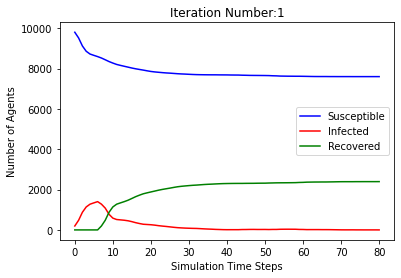

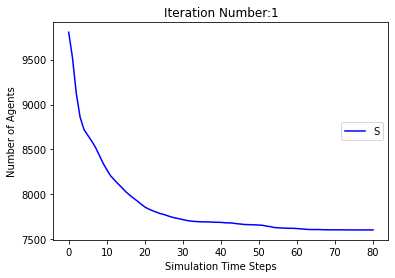

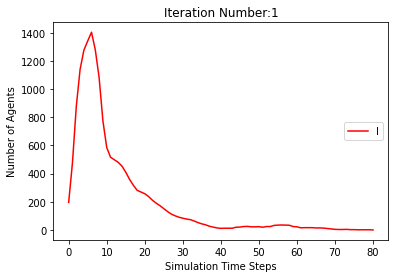

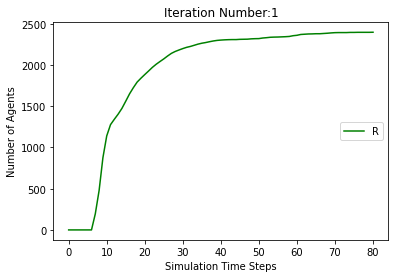

[9805, 9507, 9122, 8857, 8774, 8703, 8637, 8575, 8502, 8418, 8353, 8297, 8244, 8206, 8147, 8103, 8072, 8048, 8029, 8012, 7993, 7981, 7972, 7956, 7939, 7927, 7918, 7910, 7901, 7895, 7892, 7885, 7881, 7878, 7876, 7872, 7869, 7864, 7862, 7858, 7855, 7852, 7849, 7846, 7843, 7840, 7838, 7836, 7834, 7834, 7834, 7833, 7833, 7833, 7833, 7833, 7833, 7833, 7833]
[195, 493, 878, 1143, 1226, 1297, 1363, 1230, 1005, 704, 504, 477, 459, 431, 428, 399, 346, 305, 268, 232, 213, 166, 131, 116, 109, 102, 94, 83, 80, 77, 64, 54, 46, 40, 34, 29, 26, 28, 23, 23, 23, 24, 23, 23, 21, 22, 20, 19, 18, 15, 12, 10, 7, 5, 3, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 493, 878, 1143, 1226, 1297, 1363, 1425, 1498, 1582, 1647, 1703, 1756, 1794, 1853, 1897, 1928, 1952, 1971, 1988, 2007, 2019, 2028, 2044, 2061, 2073, 2082, 2090, 2099, 2105, 2108, 2115, 2119, 2122, 2124, 2128, 2131, 2136, 2138, 2142, 2145, 2148, 2151, 2154, 2157, 2160, 2162, 2164, 2166, 2166, 2166, 2167]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527

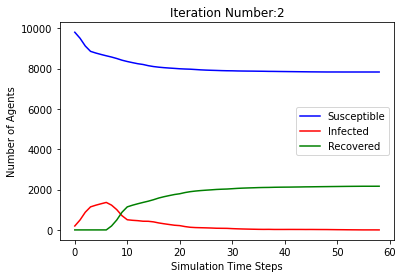

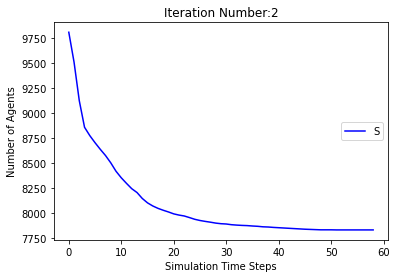

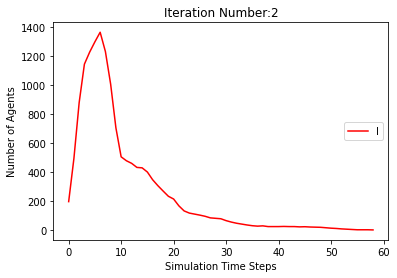

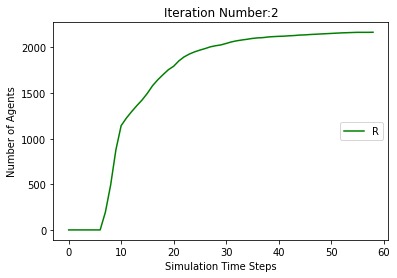

[9805, 9501, 9088, 8837, 8742, 8683, 8612, 8505, 8425, 8350, 8280, 8224, 8169, 8101, 8032, 7975, 7926, 7875, 7837, 7796, 7762, 7723, 7680, 7628, 7581, 7561, 7539, 7523, 7503, 7489, 7474, 7468, 7461, 7454, 7446, 7436, 7430, 7419, 7404, 7401, 7400, 7391, 7384, 7379, 7379, 7376, 7375, 7371, 7367, 7363, 7361, 7359, 7358, 7355, 7352, 7348, 7345, 7344, 7341, 7340, 7340, 7340, 7339, 7338, 7338, 7335, 7333, 7333, 7333, 7333, 7333, 7332, 7332, 7332, 7332, 7331, 7330, 7327, 7325, 7325, 7324, 7324, 7323, 7322, 7321, 7320, 7320, 7318, 7316, 7311, 7302, 7298, 7298, 7296, 7293, 7292, 7292, 7292, 7291, 7291, 7291, 7291, 7291, 7291, 7291, 7291]
[195, 499, 912, 1163, 1258, 1317, 1388, 1300, 1076, 738, 557, 518, 514, 511, 473, 450, 424, 405, 387, 373, 339, 309, 295, 298, 294, 276, 257, 239, 220, 191, 154, 113, 100, 85, 77, 67, 59, 55, 64, 60, 54, 55, 52, 51, 40, 28, 26, 29, 24, 21, 18, 20, 18, 20, 19, 19, 18, 17, 18, 18, 15, 12, 9, 7, 6, 6, 7, 7, 7, 6, 5, 6, 3, 1, 1, 2, 3, 6, 7, 7, 8, 8, 8, 8, 6, 5, 5, 

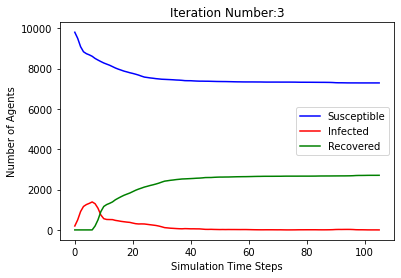

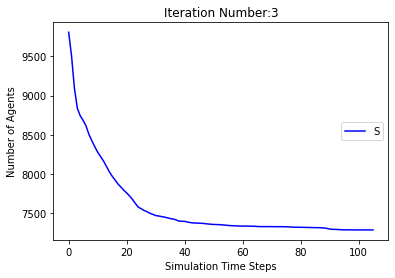

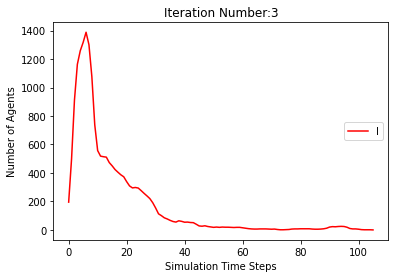

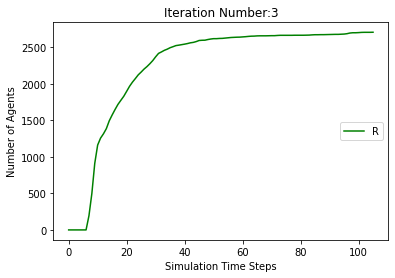

[9805, 9503, 9066, 8816, 8685, 8598, 8519, 8455, 8394, 8336, 8288, 8250, 8194, 8140, 8085, 8038, 7999, 7971, 7951, 7938, 7921, 7888, 7868, 7848, 7832, 7822, 7811, 7807, 7801, 7797, 7790, 7785, 7779, 7772, 7760, 7749, 7738, 7731, 7726, 7721, 7720, 7720, 7717, 7713, 7713, 7713, 7712, 7712, 7709, 7704, 7698, 7693, 7691, 7691, 7689, 7687, 7685, 7683, 7681, 7681, 7679, 7679, 7679, 7679, 7679, 7679, 7679, 7679]
[195, 497, 934, 1184, 1315, 1402, 1481, 1350, 1109, 730, 528, 435, 404, 379, 370, 356, 337, 317, 299, 256, 219, 197, 170, 151, 139, 129, 127, 114, 87, 71, 58, 47, 43, 39, 47, 52, 59, 59, 59, 58, 52, 40, 32, 25, 18, 13, 9, 8, 11, 13, 15, 20, 22, 21, 23, 22, 19, 15, 12, 10, 12, 10, 8, 6, 4, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 497, 934, 1184, 1315, 1402, 1481, 1545, 1606, 1664, 1712, 1750, 1806, 1860, 1915, 1962, 2001, 2029, 2049, 2062, 2079, 2112, 2132, 2152, 2168, 2178, 2189, 2193, 2199, 2203, 2210, 2215, 2221, 2228, 2240, 2251, 2262, 2269, 2274, 2279, 2280, 2280, 2283, 2287, 2287, 228

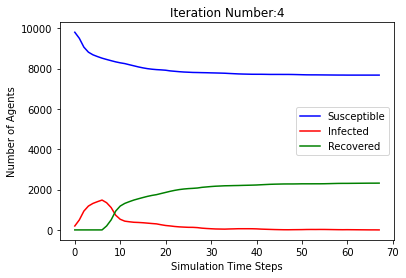

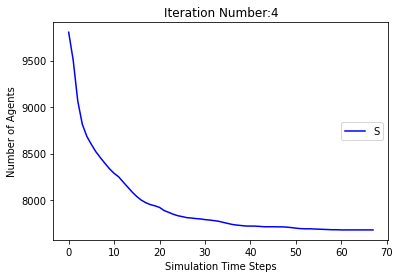

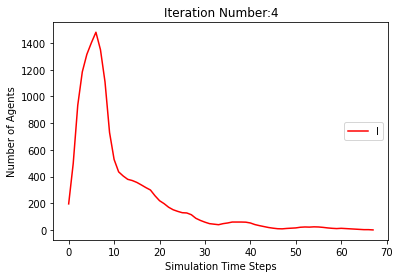

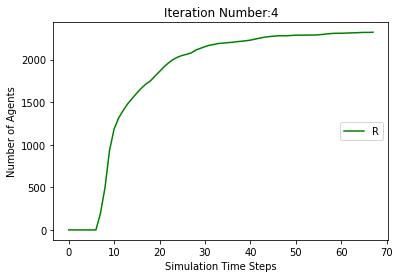

[9805, 9489, 9102, 8874, 8762, 8686, 8599, 8525, 8427, 8336, 8248, 8181, 8127, 8086, 8039, 7987, 7942, 7906, 7863, 7828, 7799, 7765, 7749, 7732, 7706, 7683, 7673, 7664, 7649, 7634, 7618, 7607, 7596, 7583, 7573, 7559, 7551, 7543, 7536, 7530, 7524, 7515, 7500, 7493, 7486, 7475, 7463, 7445, 7434, 7425, 7411, 7405, 7400, 7395, 7388, 7375, 7362, 7360, 7356, 7353, 7352, 7352, 7351, 7351, 7350, 7350, 7349, 7349, 7349, 7348, 7348, 7348, 7348, 7348, 7347, 7347, 7347, 7347, 7347, 7346, 7346, 7345, 7344, 7343, 7343, 7342, 7339, 7338, 7337, 7333, 7328, 7327, 7325, 7323, 7321, 7319, 7318, 7317, 7314, 7314, 7313, 7312, 7308, 7304, 7300, 7299, 7298, 7296, 7295, 7295, 7295, 7295, 7295, 7295, 7295, 7295]
[195, 511, 898, 1126, 1238, 1314, 1401, 1280, 1062, 766, 626, 581, 559, 513, 486, 440, 394, 342, 318, 299, 287, 274, 238, 210, 200, 180, 155, 135, 116, 115, 114, 99, 87, 90, 91, 90, 83, 75, 71, 66, 59, 58, 59, 58, 57, 61, 67, 79, 81, 75, 82, 81, 75, 68, 57, 59, 63, 51, 49, 47, 43, 36, 24, 11, 10, 6, 4,

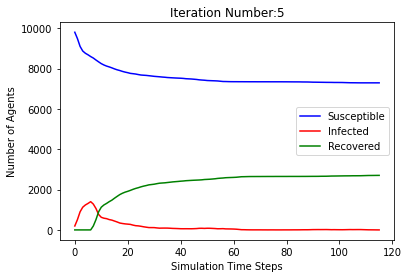

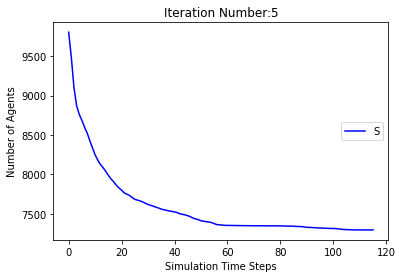

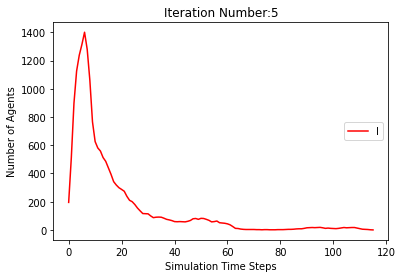

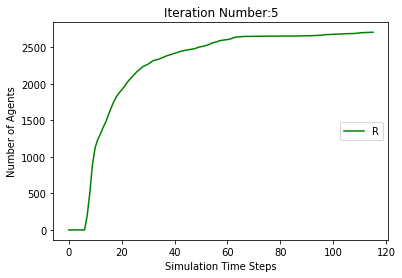

[9805, 9459, 9064, 8826, 8729, 8646, 8546, 8460, 8373, 8290, 8215, 8134, 8069, 8008, 7963, 7935, 7910, 7891, 7863, 7829, 7798, 7774, 7754, 7741, 7724, 7700, 7681, 7663, 7647, 7627, 7609, 7589, 7574, 7563, 7554, 7549, 7543, 7536, 7530, 7527, 7522, 7515, 7510, 7504, 7499, 7497, 7493, 7487, 7482, 7479, 7476, 7474, 7473, 7472, 7469, 7465, 7459, 7449, 7444, 7440, 7438, 7433, 7431, 7429, 7427, 7422, 7417, 7410, 7406, 7405, 7402, 7402, 7401, 7401, 7398, 7395, 7395, 7395, 7395, 7395, 7395, 7395, 7395]
[195, 541, 936, 1174, 1271, 1354, 1454, 1345, 1086, 774, 611, 595, 577, 538, 497, 438, 380, 324, 271, 240, 210, 189, 181, 169, 167, 163, 148, 135, 127, 127, 132, 135, 126, 118, 109, 98, 84, 73, 59, 47, 41, 39, 39, 39, 37, 33, 34, 35, 33, 31, 28, 25, 24, 21, 18, 17, 20, 27, 30, 33, 34, 36, 34, 30, 22, 22, 23, 28, 27, 26, 27, 25, 21, 16, 12, 11, 10, 7, 7, 6, 6, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 541, 936, 1174, 1271, 1354, 1454, 1540, 1627, 1710, 1785, 1866, 1931, 1992, 2037, 2065, 2090, 2109, 2137, 

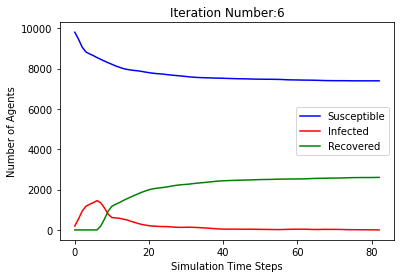

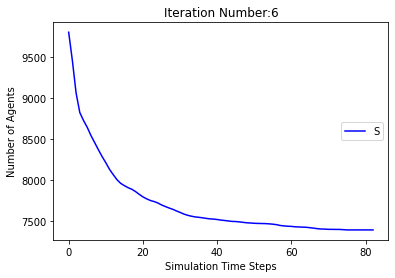

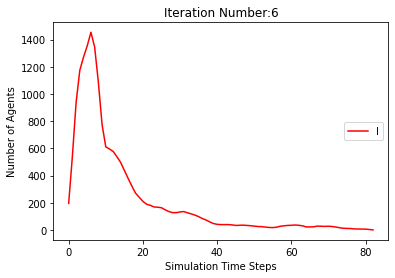

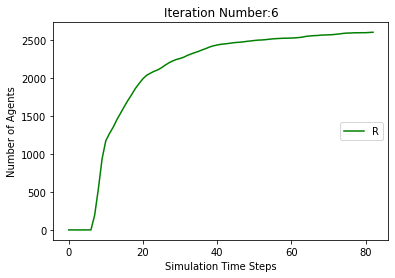

[9805, 9466, 9080, 8836, 8731, 8664, 8595, 8528, 8463, 8389, 8324, 8256, 8200, 8148, 8107, 8079, 8043, 8003, 7973, 7947, 7930, 7909, 7886, 7875, 7866, 7850, 7834, 7819, 7803, 7787, 7777, 7765, 7755, 7751, 7749, 7743, 7735, 7723, 7713, 7707, 7707, 7705, 7703, 7702, 7698, 7693, 7688, 7685, 7682, 7682, 7681, 7676, 7674, 7673, 7669, 7663, 7661, 7660, 7660, 7658, 7658, 7658, 7657, 7657, 7655, 7654, 7653, 7650, 7648, 7648, 7648, 7647, 7645, 7640, 7638, 7638, 7637, 7636, 7636, 7636, 7635, 7632, 7628, 7628, 7626, 7623, 7622, 7621, 7621, 7620, 7619, 7619, 7619, 7619, 7619, 7619, 7618, 7618, 7617, 7617, 7617, 7614, 7610, 7610, 7610, 7610, 7609, 7605, 7599, 7596, 7596, 7596, 7595, 7594, 7594, 7593, 7592, 7592, 7592, 7591, 7589, 7587, 7586, 7585, 7583, 7583, 7583, 7583, 7583, 7583, 7583, 7583]
[195, 534, 920, 1164, 1269, 1336, 1405, 1277, 1003, 691, 512, 475, 464, 447, 421, 384, 346, 321, 283, 253, 218, 198, 193, 168, 137, 123, 113, 111, 106, 99, 98, 101, 95, 83, 70, 60, 52, 54, 52, 48, 44, 44, 40

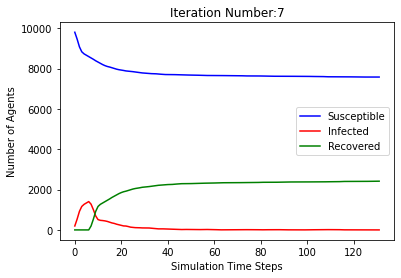

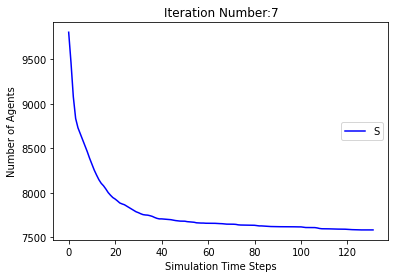

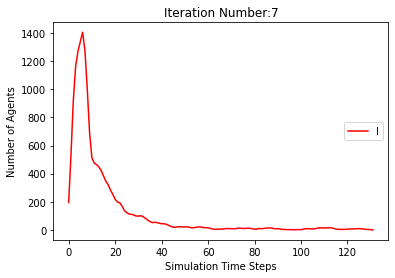

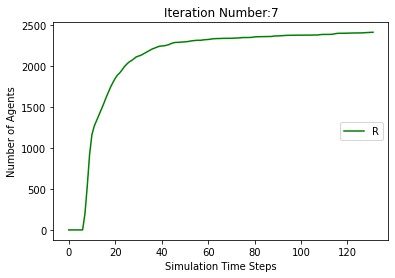

[9805, 9526, 9133, 8883, 8775, 8712, 8641, 8554, 8455, 8368, 8299, 8240, 8192, 8149, 8112, 8080, 8050, 8022, 7986, 7953, 7923, 7895, 7879, 7857, 7837, 7812, 7797, 7787, 7777, 7766, 7759, 7755, 7749, 7743, 7736, 7725, 7713, 7705, 7696, 7694, 7694, 7691, 7691, 7691, 7691, 7691, 7691, 7691, 7691]
[195, 474, 867, 1117, 1225, 1288, 1359, 1251, 1071, 765, 584, 535, 520, 492, 442, 375, 318, 277, 254, 239, 226, 217, 201, 193, 185, 174, 156, 136, 118, 113, 98, 82, 63, 54, 51, 52, 53, 54, 59, 55, 49, 45, 34, 22, 14, 5, 3, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 474, 867, 1117, 1225, 1288, 1359, 1446, 1545, 1632, 1701, 1760, 1808, 1851, 1888, 1920, 1950, 1978, 2014, 2047, 2077, 2105, 2121, 2143, 2163, 2188, 2203, 2213, 2223, 2234, 2241, 2245, 2251, 2257, 2264, 2275, 2287, 2295, 2304, 2306, 2306, 2309]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351, 8276, 8208, 8161, 8117, 8074, 8030, 7992, 7959, 7927, 7892, 7860, 7837, 7819, 7802, 7787, 7776, 7762, 7748, 7737, 7729, 7719, 7710, 7703, 7

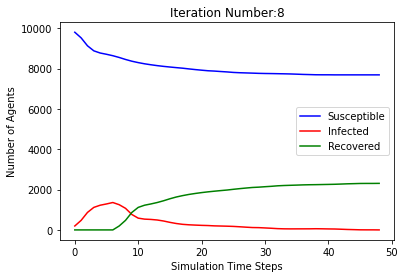

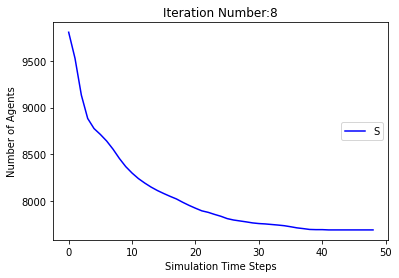

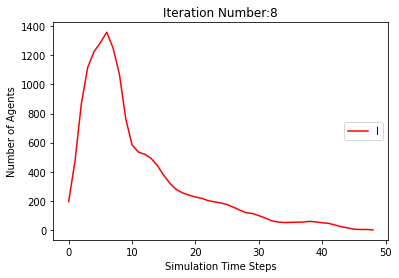

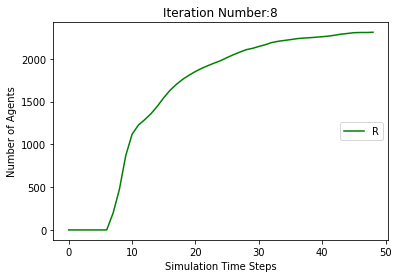

[9805, 9499, 9103, 8863, 8749, 8666, 8591, 8505, 8406, 8294, 8191, 8124, 8063, 7981, 7909, 7851, 7808, 7770, 7731, 7688, 7660, 7637, 7607, 7582, 7555, 7537, 7521, 7510, 7504, 7497, 7491, 7488, 7483, 7478, 7469, 7458, 7448, 7441, 7437, 7430, 7423, 7418, 7416, 7416, 7414, 7411, 7404, 7398, 7394, 7392, 7387, 7382, 7376, 7374, 7373, 7372, 7366, 7358, 7349, 7340, 7330, 7327, 7325, 7325, 7325, 7323, 7321, 7321, 7319, 7317, 7313, 7310, 7309, 7308, 7306, 7304, 7302, 7300, 7300, 7299, 7297, 7292, 7290, 7289, 7287, 7287, 7286, 7285, 7285, 7285, 7283, 7283, 7283, 7283, 7282, 7279, 7276, 7272, 7271, 7268, 7265, 7262, 7261, 7259, 7257, 7255, 7252, 7248, 7245, 7243, 7242, 7242, 7242, 7240, 7240, 7240, 7240, 7240, 7239, 7239, 7239, 7239, 7239, 7239, 7239, 7238, 7235, 7233, 7229, 7226, 7224, 7222, 7221, 7216, 7213, 7211, 7211, 7211, 7210, 7209, 7208, 7208, 7208, 7206, 7205, 7205, 7204, 7201, 7201, 7200, 7198, 7198, 7196, 7192, 7185, 7178, 7173, 7169, 7168, 7167, 7163, 7156, 7148, 7143, 7142, 7141, 713

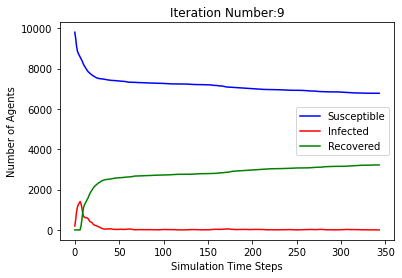

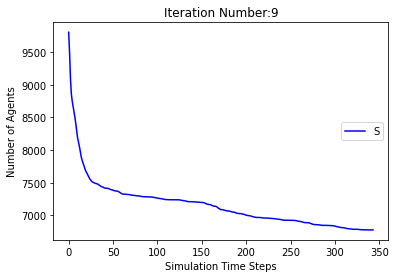

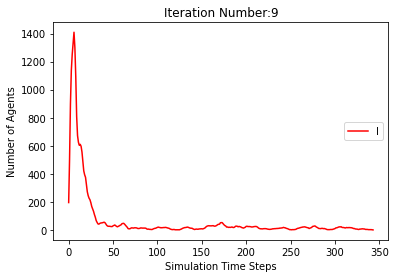

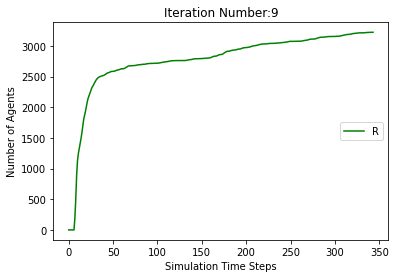

[9805, 9498, 9093, 8835, 8727, 8644, 8547, 8446, 8337, 8239, 8165, 8088, 8037, 7988, 7934, 7885, 7843, 7807, 7762, 7722, 7691, 7663, 7638, 7615, 7583, 7561, 7545, 7529, 7519, 7508, 7498, 7487, 7477, 7468, 7461, 7454, 7446, 7435, 7427, 7417, 7405, 7400, 7397, 7393, 7393, 7390, 7388, 7382, 7380, 7379, 7374, 7366, 7364, 7362, 7361, 7358, 7356, 7352, 7352, 7351, 7351, 7347, 7343, 7342, 7341, 7339, 7339, 7338, 7338, 7338, 7336, 7334, 7330, 7327, 7325, 7323, 7321, 7319, 7318, 7318, 7316, 7316, 7315, 7314, 7314, 7314, 7314, 7314, 7312, 7307, 7306, 7302, 7298, 7297, 7297, 7297, 7295, 7290, 7286, 7284, 7281, 7278, 7274, 7270, 7267, 7263, 7260, 7256, 7249, 7245, 7240, 7236, 7233, 7232, 7232, 7232, 7232, 7231, 7231, 7230, 7229, 7229, 7229, 7229, 7229, 7228, 7228, 7228, 7227, 7225, 7222, 7218, 7215, 7213, 7211, 7211, 7209, 7206, 7205, 7204, 7203, 7200, 7197, 7196, 7195, 7193, 7192, 7188, 7187, 7186, 7185, 7183, 7179, 7175, 7173, 7172, 7170, 7165, 7164, 7163, 7163, 7163, 7162, 7162, 7162, 7162, 716

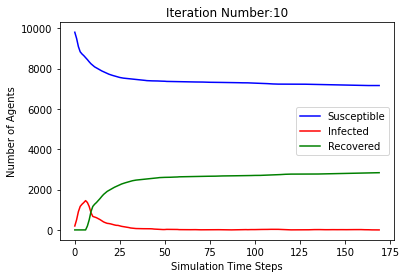

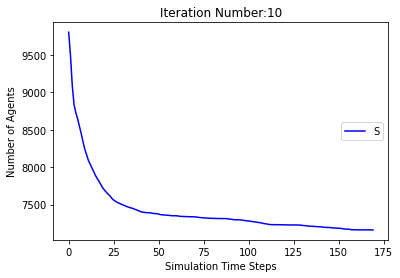

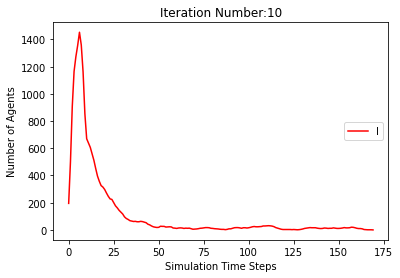

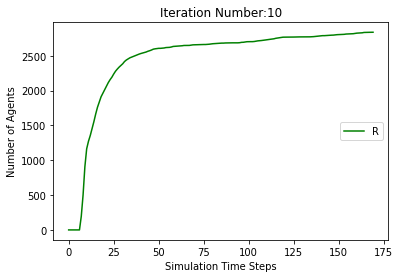

[9805, 9503, 9103, 8839, 8734, 8652, 8566, 8481, 8394, 8321, 8251, 8198, 8141, 8080, 8030, 7985, 7953, 7925, 7903, 7859, 7834, 7804, 7779, 7762, 7739, 7723, 7699, 7673, 7658, 7646, 7636, 7624, 7609, 7598, 7589, 7574, 7565, 7551, 7542, 7531, 7528, 7521, 7512, 7507, 7496, 7488, 7484, 7476, 7471, 7468, 7466, 7461, 7457, 7455, 7455, 7453, 7451, 7449, 7443, 7442, 7439, 7436, 7434, 7433, 7430, 7429, 7427, 7423, 7420, 7417, 7415, 7411, 7408, 7407, 7402, 7399, 7399, 7399, 7397, 7397, 7396, 7394, 7393, 7393, 7393, 7392, 7390, 7384, 7382, 7382, 7381, 7378, 7378, 7377, 7376, 7375, 7373, 7371, 7368, 7367, 7367, 7367, 7367, 7367, 7367, 7367, 7367]
[195, 497, 897, 1161, 1266, 1348, 1434, 1324, 1109, 782, 588, 536, 511, 486, 451, 409, 368, 326, 295, 282, 246, 226, 206, 191, 186, 180, 160, 161, 146, 133, 126, 115, 114, 101, 84, 84, 81, 85, 82, 78, 70, 68, 62, 58, 55, 54, 47, 52, 50, 44, 41, 35, 31, 29, 21, 18, 17, 17, 18, 15, 16, 19, 19, 18, 19, 14, 15, 16, 16, 17, 18, 19, 21, 20, 21, 21, 18, 16, 14, 

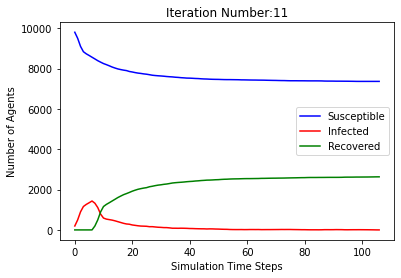

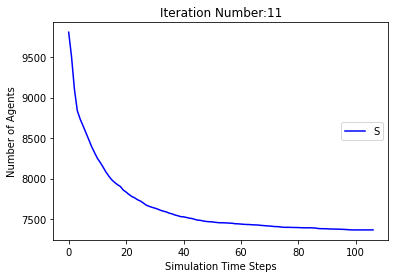

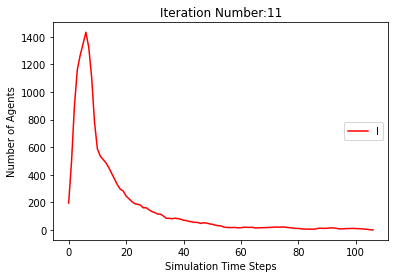

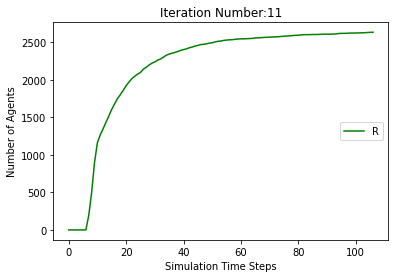

[9805, 9497, 9108, 8835, 8729, 8655, 8574, 8483, 8385, 8299, 8228, 8166, 8106, 8044, 7980, 7926, 7874, 7827, 7781, 7734, 7692, 7660, 7629, 7611, 7600, 7586, 7571, 7559, 7550, 7536, 7525, 7515, 7511, 7506, 7501, 7496, 7495, 7494, 7491, 7491, 7490, 7488, 7487, 7486, 7486, 7484, 7484, 7484, 7484, 7482, 7482, 7482, 7481, 7481, 7479, 7475, 7469, 7467, 7465, 7462, 7461, 7460, 7460, 7460, 7460, 7460, 7460, 7457, 7453, 7448, 7446, 7445, 7445, 7444, 7441, 7441, 7439, 7436, 7435, 7435, 7435, 7435, 7435, 7435, 7435, 7434, 7434, 7433, 7433, 7433, 7433, 7433, 7432, 7429, 7426, 7425, 7424, 7422, 7422, 7422, 7422, 7421, 7420, 7420, 7419, 7416, 7415, 7414, 7409, 7408, 7406, 7403, 7403, 7402, 7402, 7402, 7402, 7399, 7397, 7396, 7395, 7394, 7393, 7393, 7390, 7388, 7386, 7382, 7377, 7374, 7374, 7373, 7373, 7373, 7373, 7372, 7371, 7371, 7371, 7371, 7370, 7370, 7368, 7367, 7367, 7367, 7366, 7364, 7362, 7362, 7362, 7362, 7362, 7362, 7361, 7361, 7360, 7359, 7359, 7359, 7357, 7357, 7351, 7349, 7347, 7345, 734

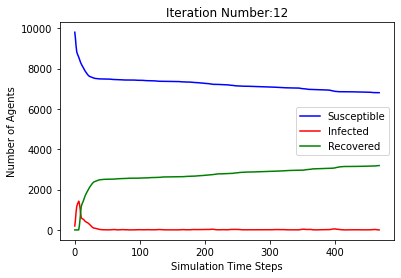

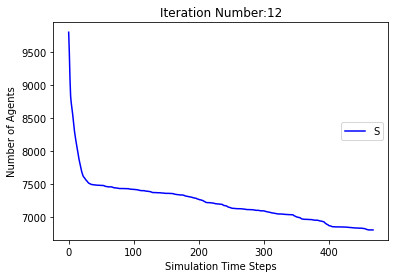

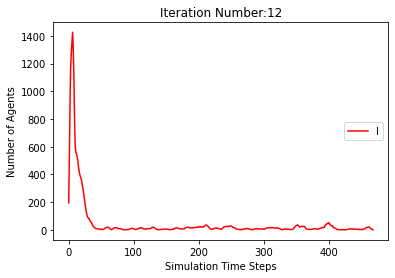

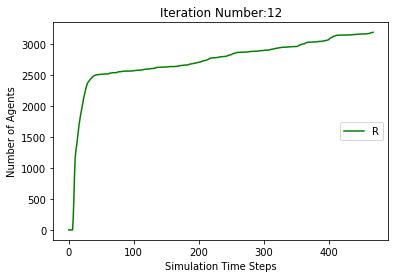

[9805, 9503, 9106, 8839, 8720, 8640, 8569, 8484, 8391, 8306, 8234, 8176, 8132, 8085, 8039, 7996, 7944, 7904, 7866, 7828, 7795, 7771, 7740, 7712, 7685, 7666, 7642, 7630, 7614, 7603, 7592, 7580, 7573, 7568, 7564, 7559, 7553, 7546, 7541, 7537, 7533, 7526, 7524, 7524, 7523, 7523, 7522, 7520, 7517, 7514, 7510, 7509, 7508, 7508, 7508, 7507, 7507, 7507, 7507, 7507, 7507, 7507, 7507]
[195, 497, 894, 1161, 1280, 1360, 1431, 1321, 1112, 800, 605, 544, 508, 484, 445, 395, 362, 330, 310, 304, 290, 268, 256, 232, 219, 200, 186, 165, 157, 137, 120, 105, 93, 74, 66, 55, 50, 46, 39, 36, 35, 38, 35, 29, 23, 18, 15, 13, 9, 10, 14, 14, 15, 14, 12, 10, 7, 3, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 497, 894, 1161, 1280, 1360, 1431, 1516, 1609, 1694, 1766, 1824, 1868, 1915, 1961, 2004, 2056, 2096, 2134, 2172, 2205, 2229, 2260, 2288, 2315, 2334, 2358, 2370, 2386, 2397, 2408, 2420, 2427, 2432, 2436, 2441, 2447, 2454, 2459, 2463, 2467, 2474, 2476, 2476, 2477, 2477, 2478, 2480, 2483, 2486, 2490, 2491, 2492, 2

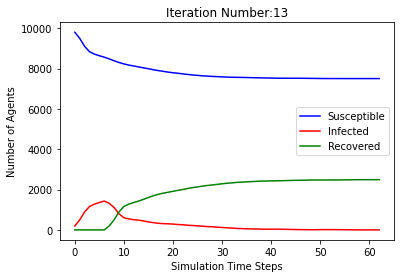

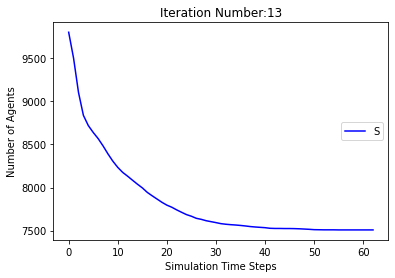

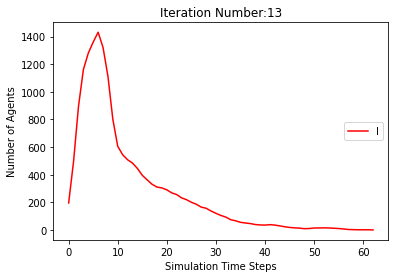

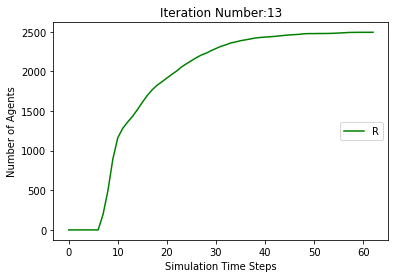

[9805, 9512, 9096, 8841, 8720, 8650, 8586, 8519, 8450, 8371, 8287, 8221, 8161, 8109, 8072, 8034, 7995, 7967, 7931, 7902, 7867, 7841, 7812, 7783, 7769, 7760, 7746, 7732, 7719, 7707, 7704, 7702, 7698, 7692, 7684, 7670, 7666, 7666, 7664, 7657, 7654, 7651, 7645, 7641, 7640, 7639, 7637, 7634, 7632, 7631, 7631, 7630, 7629, 7628, 7628, 7627, 7627, 7627, 7627, 7627, 7627, 7627, 7627]
[195, 488, 904, 1159, 1280, 1350, 1414, 1286, 1062, 725, 554, 499, 489, 477, 447, 416, 376, 320, 290, 259, 242, 231, 222, 212, 198, 171, 156, 135, 122, 105, 79, 67, 62, 54, 48, 49, 41, 38, 38, 41, 38, 33, 25, 25, 26, 25, 20, 20, 19, 14, 10, 10, 10, 9, 6, 5, 4, 4, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 488, 904, 1159, 1280, 1350, 1414, 1481, 1550, 1629, 1713, 1779, 1839, 1891, 1928, 1966, 2005, 2033, 2069, 2098, 2133, 2159, 2188, 2217, 2231, 2240, 2254, 2268, 2281, 2293, 2296, 2298, 2302, 2308, 2316, 2330, 2334, 2334, 2336, 2343, 2346, 2349, 2355, 2359, 2360, 2361, 2363, 2366, 2368, 2369, 2369, 2370, 2371, 2372,

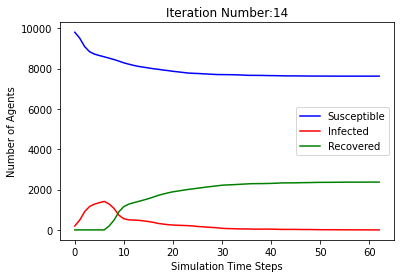

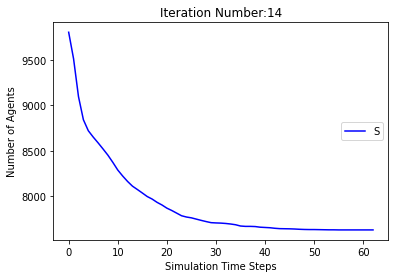

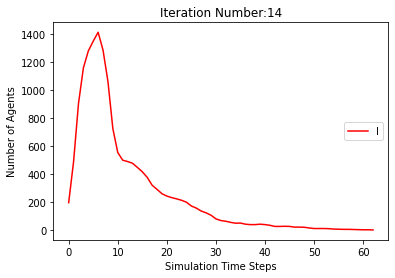

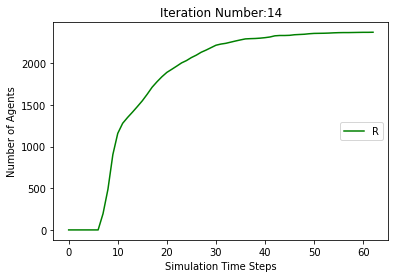

[9805, 9480, 9086, 8844, 8737, 8643, 8561, 8483, 8417, 8340, 8256, 8174, 8107, 8048, 7999, 7951, 7917, 7890, 7871, 7845, 7824, 7803, 7770, 7740, 7709, 7686, 7677, 7664, 7652, 7644, 7636, 7630, 7619, 7606, 7597, 7589, 7587, 7577, 7575, 7569, 7567, 7562, 7557, 7555, 7552, 7549, 7548, 7547, 7545, 7544, 7542, 7541, 7541, 7541, 7541, 7541, 7541, 7538, 7535, 7534, 7533, 7533, 7533, 7533, 7533, 7533, 7533, 7533]
[195, 520, 914, 1156, 1263, 1357, 1439, 1322, 1063, 746, 588, 563, 536, 513, 484, 466, 423, 366, 303, 262, 224, 196, 181, 177, 181, 185, 168, 160, 151, 126, 104, 79, 67, 71, 67, 63, 57, 59, 55, 50, 39, 35, 32, 32, 25, 26, 21, 20, 17, 13, 13, 11, 8, 7, 6, 4, 3, 4, 6, 7, 8, 8, 8, 8, 5, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 520, 914, 1156, 1263, 1357, 1439, 1517, 1583, 1660, 1744, 1826, 1893, 1952, 2001, 2049, 2083, 2110, 2129, 2155, 2176, 2197, 2230, 2260, 2291, 2314, 2323, 2336, 2348, 2356, 2364, 2370, 2381, 2394, 2403, 2411, 2413, 2423, 2425, 2431, 2433, 2438, 2443, 2445, 2448, 2451, 24

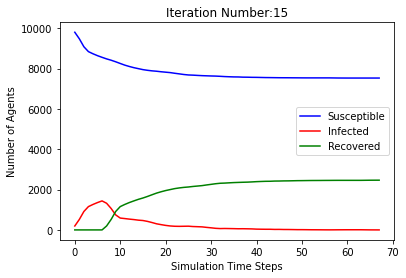

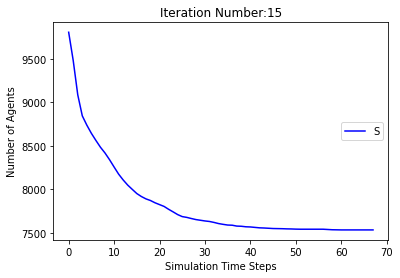

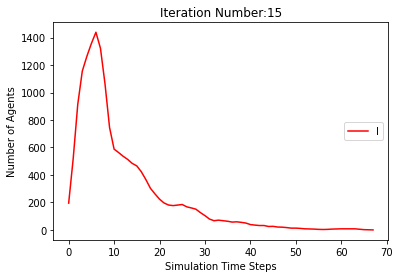

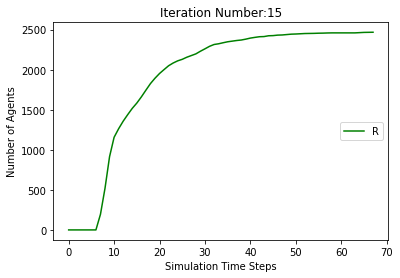

[9805, 9486, 9069, 8833, 8736, 8643, 8542, 8451, 8356, 8266, 8180, 8092, 8012, 7953, 7902, 7857, 7816, 7780, 7743, 7709, 7676, 7645, 7623, 7606, 7592, 7580, 7565, 7549, 7536, 7522, 7509, 7498, 7484, 7477, 7469, 7453, 7435, 7427, 7418, 7412, 7409, 7408, 7408, 7408, 7406, 7401, 7400, 7399, 7396, 7395, 7392, 7391, 7389, 7389, 7387, 7387, 7386, 7379, 7373, 7368, 7359, 7354, 7352, 7351, 7347, 7342, 7340, 7339, 7337, 7337, 7336, 7336, 7336, 7336, 7335, 7335, 7335, 7335, 7335, 7335, 7334, 7333, 7333, 7333, 7332, 7331, 7328, 7327, 7325, 7320, 7312, 7311, 7311, 7310, 7310, 7310, 7309, 7309, 7309, 7309, 7309, 7308, 7308, 7308, 7308, 7308, 7308, 7308, 7308]
[195, 514, 931, 1167, 1264, 1357, 1458, 1354, 1130, 803, 653, 644, 631, 589, 549, 499, 450, 400, 349, 303, 277, 257, 234, 210, 188, 163, 144, 127, 109, 101, 97, 94, 96, 88, 80, 83, 87, 82, 80, 72, 68, 61, 45, 27, 21, 17, 12, 10, 12, 13, 16, 15, 12, 11, 12, 9, 9, 13, 18, 21, 30, 33, 35, 35, 32, 31, 28, 20, 17, 15, 15, 11, 6, 4, 4, 2, 2, 1, 1, 1

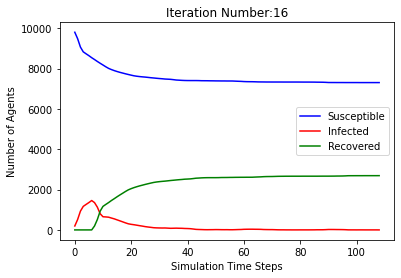

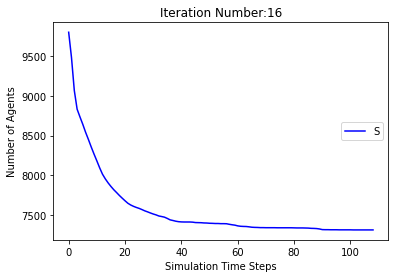

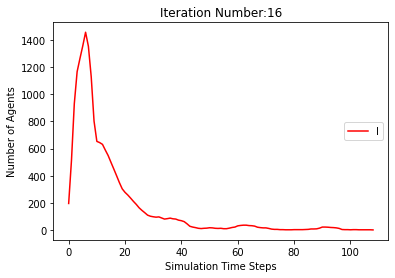

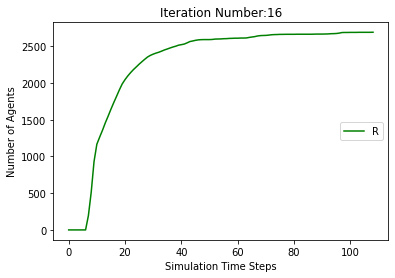

[9805, 9515, 9121, 8831, 8712, 8642, 8569, 8498, 8419, 8345, 8271, 8191, 8134, 8094, 8059, 8023, 7994, 7958, 7913, 7874, 7841, 7813, 7784, 7757, 7732, 7704, 7680, 7669, 7645, 7624, 7610, 7589, 7572, 7565, 7559, 7553, 7547, 7541, 7537, 7531, 7522, 7514, 7507, 7505, 7505, 7504, 7504, 7503, 7502, 7502, 7500, 7499, 7499, 7499, 7499, 7499, 7499, 7499, 7499]
[195, 485, 879, 1169, 1288, 1358, 1431, 1307, 1096, 776, 560, 521, 508, 475, 439, 396, 351, 313, 278, 260, 253, 246, 239, 237, 226, 209, 194, 172, 168, 160, 147, 143, 132, 115, 110, 92, 77, 69, 52, 41, 43, 45, 46, 42, 36, 33, 27, 19, 12, 5, 5, 6, 5, 5, 4, 3, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 485, 879, 1169, 1288, 1358, 1431, 1502, 1581, 1655, 1729, 1809, 1866, 1906, 1941, 1977, 2006, 2042, 2087, 2126, 2159, 2187, 2216, 2243, 2268, 2296, 2320, 2331, 2355, 2376, 2390, 2411, 2428, 2435, 2441, 2447, 2453, 2459, 2463, 2469, 2478, 2486, 2493, 2495, 2495, 2496, 2496, 2497, 2498, 2498, 2500, 2501]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597

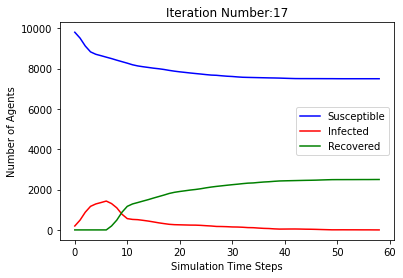

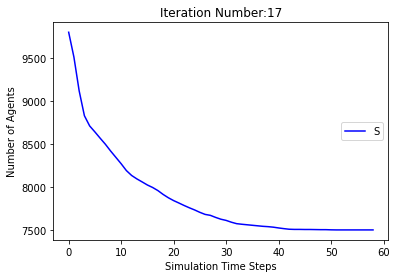

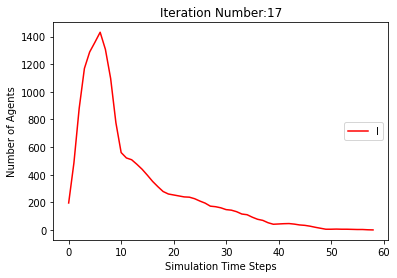

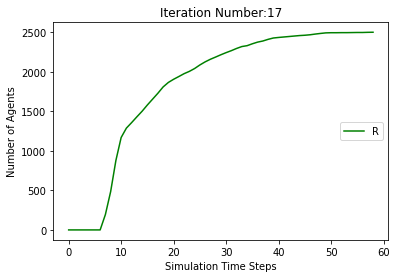

[9805, 9508, 9125, 8871, 8773, 8677, 8596, 8517, 8436, 8367, 8285, 8220, 8166, 8114, 8063, 8018, 7975, 7936, 7914, 7889, 7866, 7851, 7832, 7817, 7797, 7780, 7760, 7745, 7731, 7716, 7698, 7685, 7670, 7658, 7649, 7643, 7637, 7631, 7616, 7601, 7590, 7585, 7581, 7579, 7579, 7574, 7566, 7555, 7544, 7535, 7528, 7521, 7511, 7502, 7497, 7493, 7492, 7492, 7488, 7487, 7484, 7484, 7483, 7483, 7482, 7473, 7466, 7463, 7463, 7460, 7455, 7450, 7445, 7441, 7438, 7437, 7433, 7428, 7427, 7424, 7421, 7418, 7416, 7416, 7416, 7416, 7416, 7416, 7416, 7416]
[195, 492, 875, 1129, 1227, 1323, 1404, 1288, 1072, 758, 586, 553, 511, 482, 454, 418, 392, 349, 306, 277, 248, 212, 186, 158, 139, 134, 129, 121, 120, 116, 119, 112, 110, 102, 96, 88, 79, 67, 69, 69, 68, 64, 62, 58, 52, 42, 35, 35, 41, 46, 51, 58, 63, 64, 58, 51, 43, 36, 33, 24, 18, 13, 10, 9, 10, 15, 21, 21, 21, 23, 28, 32, 28, 25, 25, 26, 27, 27, 23, 21, 20, 20, 21, 17, 12, 11, 8, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 492, 875, 1129, 1227, 1323, 1404, 14

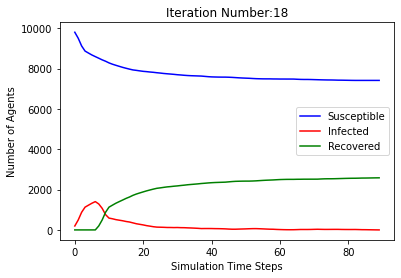

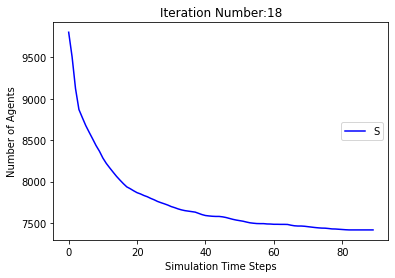

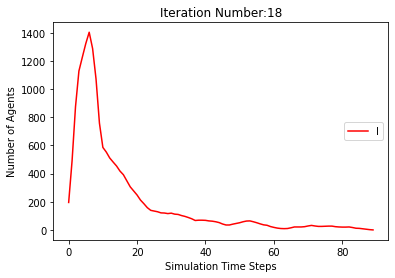

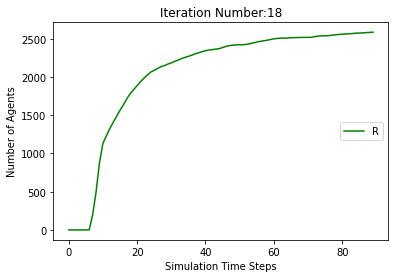

[9805, 9513, 9125, 8888, 8767, 8679, 8591, 8512, 8430, 8350, 8268, 8201, 8154, 8107, 8076, 8046, 8021, 8001, 7984, 7960, 7945, 7936, 7929, 7918, 7911, 7903, 7899, 7895, 7885, 7876, 7871, 7867, 7862, 7854, 7848, 7844, 7839, 7833, 7831, 7825, 7819, 7815, 7815, 7813, 7812, 7808, 7804, 7802, 7802, 7802, 7802, 7802, 7802, 7802, 7802]
[195, 487, 875, 1112, 1233, 1321, 1409, 1293, 1083, 775, 620, 566, 525, 484, 436, 384, 329, 267, 217, 194, 162, 140, 117, 103, 90, 81, 61, 50, 51, 53, 47, 44, 41, 45, 47, 41, 37, 38, 36, 37, 35, 33, 29, 26, 21, 23, 21, 17, 13, 13, 11, 10, 6, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 487, 875, 1112, 1233, 1321, 1409, 1488, 1570, 1650, 1732, 1799, 1846, 1893, 1924, 1954, 1979, 1999, 2016, 2040, 2055, 2064, 2071, 2082, 2089, 2097, 2101, 2105, 2115, 2124, 2129, 2133, 2138, 2146, 2152, 2156, 2161, 2167, 2169, 2175, 2181, 2185, 2185, 2187, 2188, 2192, 2196, 2198]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351, 8276, 8208, 8161, 8117, 8074, 8030, 7992, 7959, 

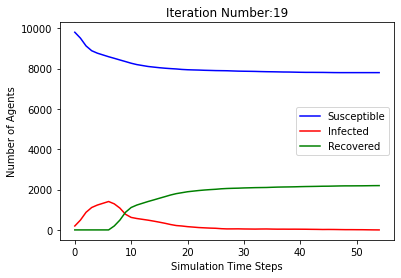

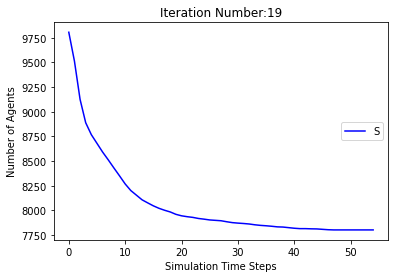

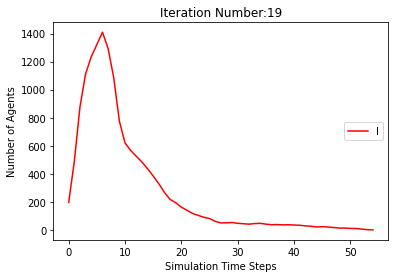

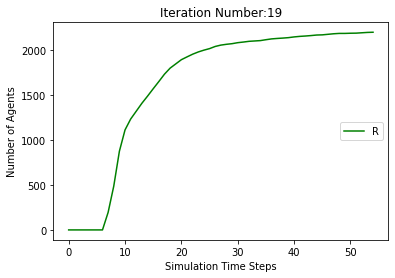

[9805, 9509, 9081, 8835, 8739, 8663, 8605, 8549, 8483, 8414, 8351, 8292, 8251, 8221, 8184, 8148, 8115, 8088, 8059, 8029, 8004, 7987, 7971, 7955, 7934, 7915, 7895, 7873, 7846, 7836, 7816, 7797, 7790, 7781, 7776, 7773, 7769, 7766, 7759, 7749, 7742, 7737, 7733, 7729, 7725, 7719, 7710, 7701, 7695, 7691, 7689, 7683, 7681, 7673, 7663, 7654, 7651, 7646, 7640, 7633, 7622, 7606, 7598, 7597, 7595, 7594, 7594, 7589, 7585, 7584, 7584, 7584, 7583, 7581, 7580, 7580, 7579, 7579, 7579, 7579, 7579, 7579, 7579, 7579]
[195, 491, 919, 1165, 1261, 1337, 1395, 1256, 1026, 667, 484, 447, 412, 384, 365, 335, 299, 263, 233, 222, 217, 197, 177, 160, 154, 144, 134, 131, 141, 135, 139, 137, 125, 114, 97, 73, 67, 50, 38, 41, 39, 39, 40, 40, 41, 40, 39, 41, 42, 42, 40, 42, 38, 37, 38, 41, 40, 43, 43, 48, 51, 57, 56, 54, 51, 46, 39, 33, 21, 14, 13, 11, 11, 13, 9, 5, 5, 5, 5, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 491, 919, 1165, 1261, 1337, 1395, 1451, 1517, 1586, 1649, 1708, 1749, 1779, 1816, 1852, 1885, 1912, 1

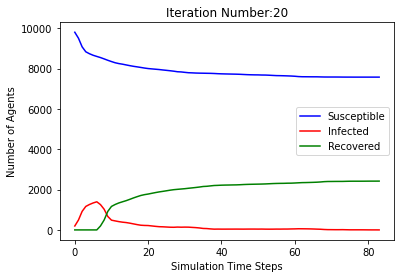

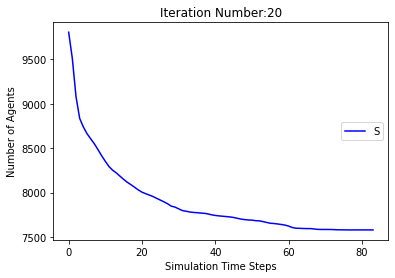

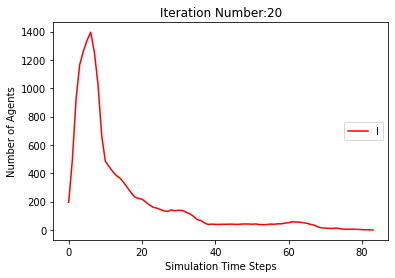

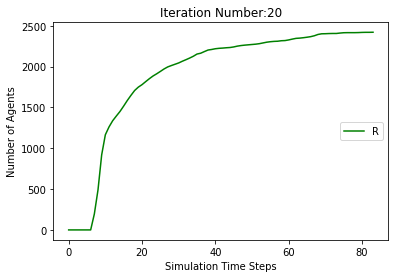

[9805, 9503, 9113, 8852, 8749, 8696, 8648, 8583, 8507, 8432, 8371, 8309, 8254, 8210, 8176, 8138, 8104, 8083, 8062, 8039, 8018, 8007, 7993, 7983, 7969, 7960, 7946, 7932, 7917, 7901, 7892, 7882, 7874, 7865, 7859, 7857, 7853, 7852, 7852, 7850, 7848, 7847, 7846, 7846, 7846, 7844, 7843, 7843, 7843, 7843, 7843, 7843, 7842, 7842, 7839, 7839, 7839, 7839, 7839, 7839, 7839, 7839]
[195, 497, 887, 1148, 1251, 1304, 1352, 1222, 996, 681, 481, 440, 442, 438, 407, 369, 328, 288, 247, 215, 192, 169, 145, 121, 114, 102, 93, 86, 90, 92, 91, 87, 86, 81, 73, 60, 48, 40, 30, 24, 17, 12, 11, 7, 6, 8, 7, 5, 4, 3, 3, 3, 2, 1, 4, 4, 4, 4, 4, 3, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 497, 887, 1148, 1251, 1304, 1352, 1417, 1493, 1568, 1629, 1691, 1746, 1790, 1824, 1862, 1896, 1917, 1938, 1961, 1982, 1993, 2007, 2017, 2031, 2040, 2054, 2068, 2083, 2099, 2108, 2118, 2126, 2135, 2141, 2143, 2147, 2148, 2148, 2150, 2152, 2153, 2154, 2154, 2154, 2156, 2157, 2157, 2157, 2157, 2157, 2157, 2158, 2158, 2161]
[[], [9805, 9522,

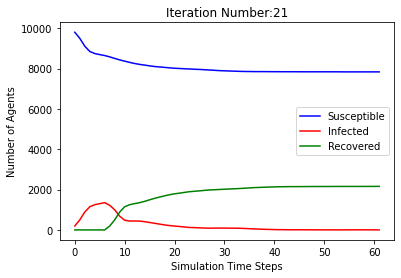

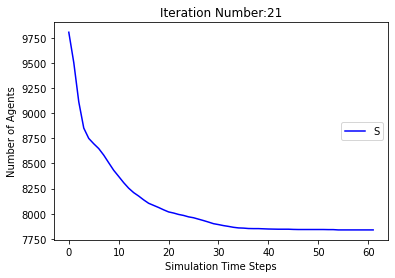

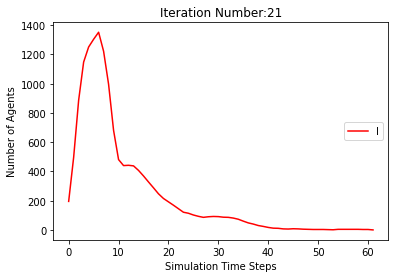

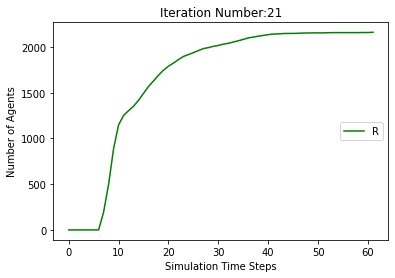

[9805, 9485, 9123, 8878, 8775, 8710, 8643, 8555, 8453, 8360, 8279, 8231, 8177, 8125, 8079, 8042, 8008, 7976, 7943, 7915, 7886, 7849, 7813, 7767, 7724, 7688, 7664, 7645, 7622, 7597, 7582, 7568, 7554, 7544, 7523, 7509, 7495, 7489, 7480, 7472, 7465, 7461, 7456, 7450, 7443, 7439, 7437, 7436, 7432, 7428, 7422, 7418, 7418, 7418, 7418, 7418, 7418, 7418, 7418]
[195, 515, 877, 1122, 1225, 1290, 1357, 1250, 1032, 763, 599, 544, 533, 518, 476, 411, 352, 303, 288, 262, 239, 230, 229, 241, 252, 255, 251, 241, 227, 216, 185, 156, 134, 120, 122, 113, 102, 93, 88, 82, 79, 62, 53, 45, 46, 41, 35, 29, 29, 28, 28, 25, 21, 19, 18, 14, 10, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 515, 877, 1122, 1225, 1290, 1357, 1445, 1547, 1640, 1721, 1769, 1823, 1875, 1921, 1958, 1992, 2024, 2057, 2085, 2114, 2151, 2187, 2233, 2276, 2312, 2336, 2355, 2378, 2403, 2418, 2432, 2446, 2456, 2477, 2491, 2505, 2511, 2520, 2528, 2535, 2539, 2544, 2550, 2557, 2561, 2563, 2564, 2568, 2572, 2578, 2582]
[[], [9805, 9522, 9125, 8861, 8724, 

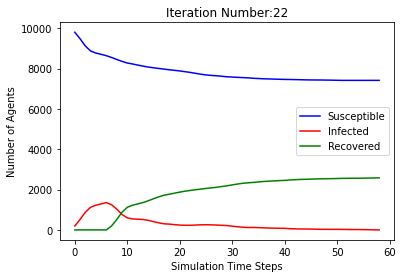

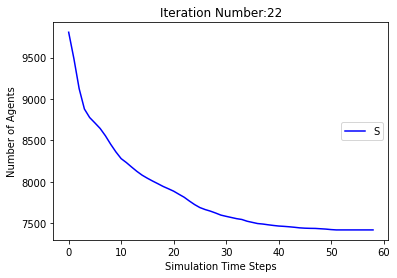

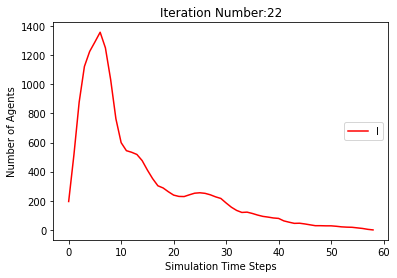

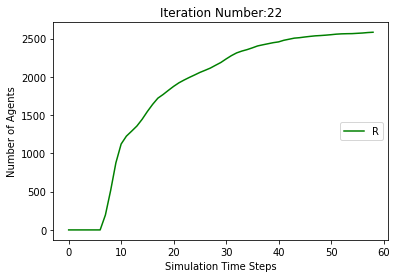

[9805, 9469, 9085, 8851, 8749, 8683, 8626, 8558, 8483, 8400, 8322, 8256, 8199, 8156, 8111, 8071, 8036, 8014, 7988, 7956, 7921, 7894, 7871, 7845, 7825, 7813, 7802, 7789, 7779, 7773, 7765, 7755, 7749, 7741, 7734, 7728, 7721, 7713, 7706, 7705, 7697, 7688, 7682, 7680, 7678, 7677, 7674, 7669, 7667, 7661, 7656, 7651, 7643, 7634, 7625, 7615, 7611, 7608, 7601, 7594, 7590, 7587, 7583, 7583, 7583, 7582, 7581, 7578, 7576, 7573, 7572, 7568, 7565, 7561, 7557, 7554, 7549, 7549, 7549, 7548, 7548, 7548, 7546, 7544, 7544, 7544, 7543, 7542, 7540, 7539, 7537, 7534, 7532, 7531, 7528, 7526, 7525, 7523, 7522, 7519, 7512, 7511, 7511, 7510, 7508, 7506, 7504, 7503, 7503, 7502, 7501, 7499, 7499, 7499, 7499, 7498, 7497, 7497, 7497, 7496, 7496, 7496, 7496, 7496, 7496, 7496, 7496]
[195, 531, 915, 1149, 1251, 1317, 1374, 1247, 986, 685, 529, 493, 484, 470, 447, 412, 364, 308, 268, 243, 235, 217, 200, 191, 189, 175, 154, 132, 115, 98, 80, 70, 64, 61, 55, 51, 52, 52, 49, 44, 44, 46, 46, 41, 35, 29, 31, 28, 21, 21, 24

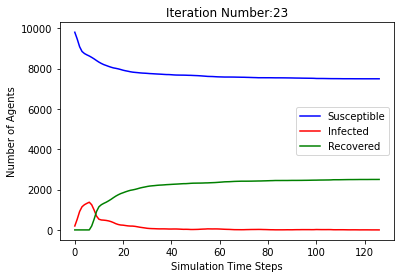

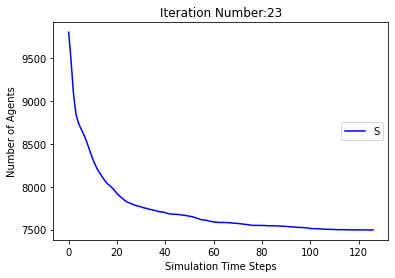

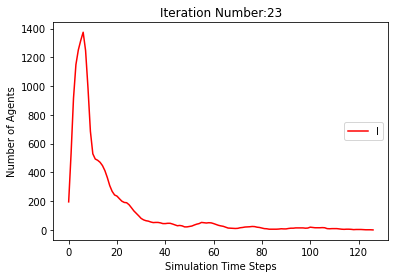

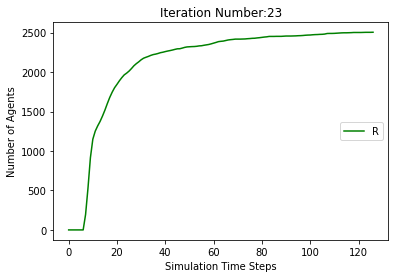

[9805, 9486, 9079, 8823, 8737, 8657, 8572, 8499, 8419, 8345, 8286, 8229, 8170, 8132, 8102, 8075, 8051, 8026, 7994, 7964, 7947, 7930, 7907, 7888, 7872, 7859, 7850, 7843, 7835, 7825, 7818, 7803, 7786, 7774, 7766, 7758, 7751, 7748, 7747, 7744, 7744, 7742, 7738, 7733, 7730, 7728, 7723, 7723, 7722, 7722, 7722, 7722, 7722, 7720, 7720, 7718, 7717, 7715, 7713, 7713, 7712, 7709, 7704, 7702, 7700, 7699, 7699, 7698, 7696, 7694, 7694, 7691, 7686, 7681, 7680, 7680, 7677, 7674, 7672, 7671, 7671, 7671, 7671, 7668, 7667, 7662, 7659, 7657, 7652, 7650, 7646, 7644, 7643, 7642, 7636, 7628, 7622, 7615, 7613, 7610, 7607, 7604, 7603, 7601, 7597, 7591, 7589, 7588, 7586, 7586, 7586, 7586, 7586, 7586, 7585, 7585, 7585, 7585, 7585, 7585, 7585, 7585]
[195, 514, 921, 1177, 1263, 1343, 1428, 1306, 1067, 734, 537, 508, 487, 440, 397, 344, 294, 260, 235, 206, 185, 172, 168, 163, 154, 135, 114, 104, 95, 82, 70, 69, 73, 76, 77, 77, 74, 70, 56, 42, 30, 24, 20, 18, 18, 19, 21, 21, 20, 16, 11, 8, 6, 3, 3, 4, 5, 7, 9, 9, 8

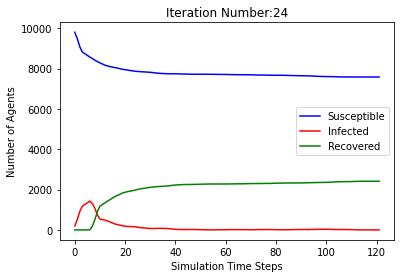

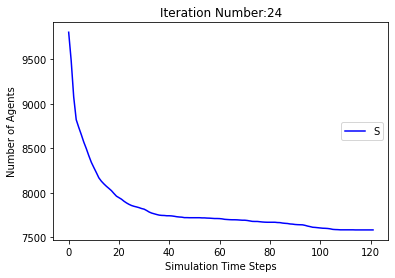

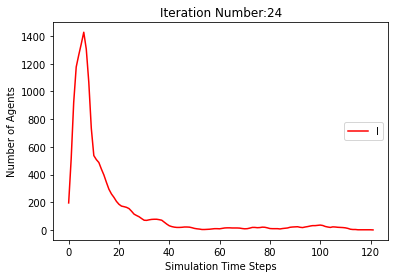

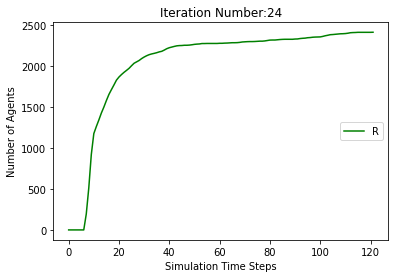

[9805, 9489, 9083, 8844, 8737, 8661, 8595, 8507, 8427, 8343, 8268, 8203, 8143, 8094, 8055, 8025, 8008, 7980, 7944, 7918, 7900, 7884, 7868, 7856, 7839, 7820, 7802, 7788, 7778, 7766, 7750, 7739, 7730, 7719, 7709, 7703, 7701, 7697, 7696, 7693, 7690, 7688, 7686, 7681, 7674, 7672, 7666, 7662, 7660, 7659, 7657, 7656, 7654, 7650, 7648, 7648, 7647, 7646, 7645, 7645, 7644, 7643, 7642, 7642, 7642, 7642, 7642, 7642, 7642, 7641, 7641, 7641, 7641, 7640, 7638, 7637, 7633, 7630, 7630, 7629, 7629, 7628, 7628, 7627, 7626, 7625, 7625, 7625, 7625, 7625, 7625, 7625, 7625]
[195, 511, 917, 1156, 1263, 1339, 1405, 1298, 1062, 740, 576, 534, 518, 501, 452, 402, 335, 288, 259, 225, 194, 171, 157, 152, 141, 124, 116, 112, 106, 102, 106, 100, 90, 83, 79, 75, 65, 53, 43, 37, 29, 21, 17, 20, 23, 24, 27, 28, 28, 27, 24, 18, 18, 16, 14, 12, 12, 11, 11, 9, 6, 5, 6, 5, 4, 3, 3, 2, 1, 1, 1, 1, 1, 2, 4, 5, 8, 11, 11, 12, 11, 10, 9, 6, 4, 5, 4, 4, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 511, 917, 1156, 1263, 1339, 1405

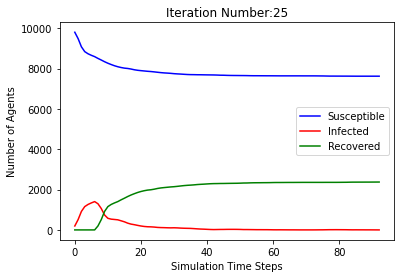

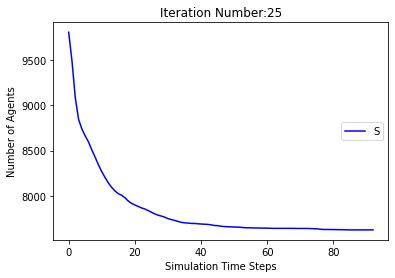

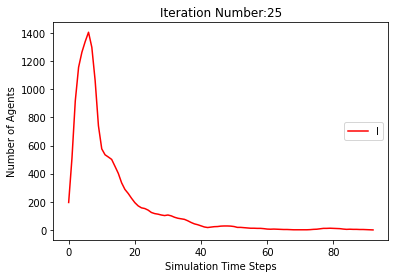

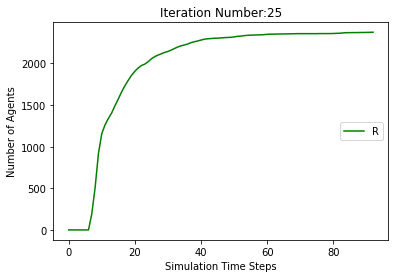

[9805, 9501, 9088, 8847, 8740, 8684, 8620, 8557, 8474, 8385, 8312, 8253, 8181, 8127, 8084, 8035, 7981, 7945, 7918, 7891, 7867, 7839, 7817, 7789, 7758, 7741, 7723, 7705, 7689, 7676, 7667, 7662, 7655, 7652, 7649, 7644, 7636, 7628, 7625, 7625, 7625, 7624, 7624, 7624, 7624, 7623, 7623, 7623, 7622, 7622, 7622, 7622, 7622, 7622, 7622, 7622]
[195, 499, 912, 1153, 1260, 1316, 1380, 1248, 1027, 703, 535, 487, 503, 493, 473, 439, 404, 367, 335, 290, 260, 245, 218, 192, 187, 177, 168, 162, 150, 141, 122, 96, 86, 71, 56, 45, 40, 39, 37, 30, 27, 25, 20, 12, 4, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 499, 912, 1153, 1260, 1316, 1380, 1443, 1526, 1615, 1688, 1747, 1819, 1873, 1916, 1965, 2019, 2055, 2082, 2109, 2133, 2161, 2183, 2211, 2242, 2259, 2277, 2295, 2311, 2324, 2333, 2338, 2345, 2348, 2351, 2356, 2364, 2372, 2375, 2375, 2375, 2376, 2376, 2376, 2376, 2377, 2377, 2377, 2378]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351, 8276, 8208, 8161, 8117, 8074, 8030

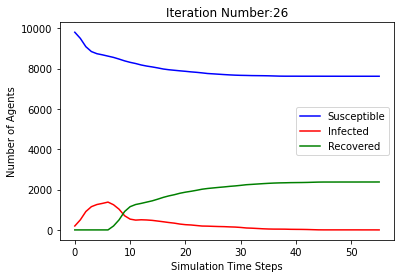

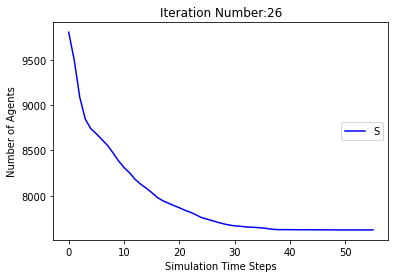

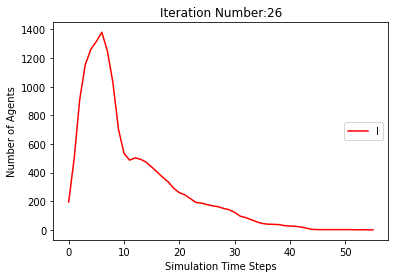

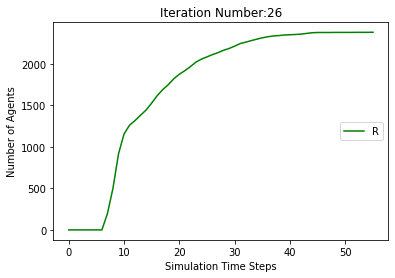

[9805, 9494, 9080, 8851, 8738, 8660, 8579, 8478, 8387, 8303, 8201, 8129, 8071, 8014, 7976, 7936, 7887, 7856, 7824, 7808, 7791, 7776, 7760, 7749, 7739, 7732, 7725, 7708, 7698, 7694, 7694, 7694, 7689, 7682, 7678, 7673, 7668, 7667, 7666, 7663, 7659, 7655, 7653, 7653, 7651, 7651, 7648, 7647, 7646, 7644, 7644, 7644, 7644, 7644, 7644, 7644, 7644]
[195, 506, 920, 1149, 1262, 1340, 1421, 1327, 1107, 777, 650, 609, 589, 565, 502, 451, 416, 345, 305, 263, 223, 200, 176, 138, 117, 92, 83, 83, 78, 66, 55, 45, 43, 43, 30, 25, 26, 27, 28, 26, 23, 23, 20, 15, 16, 15, 15, 12, 9, 9, 9, 7, 7, 4, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 506, 920, 1149, 1262, 1340, 1421, 1522, 1613, 1697, 1799, 1871, 1929, 1986, 2024, 2064, 2113, 2144, 2176, 2192, 2209, 2224, 2240, 2251, 2261, 2268, 2275, 2292, 2302, 2306, 2306, 2306, 2311, 2318, 2322, 2327, 2332, 2333, 2334, 2337, 2341, 2345, 2347, 2347, 2349, 2349, 2352, 2353, 2354, 2356]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351, 8276, 8208, 8161, 811

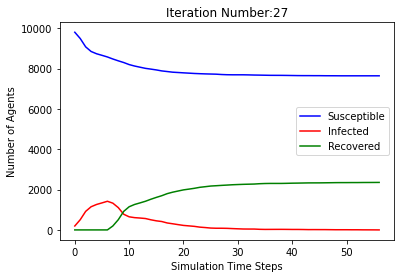

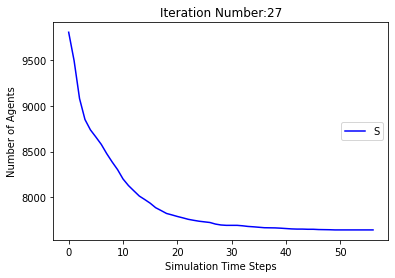

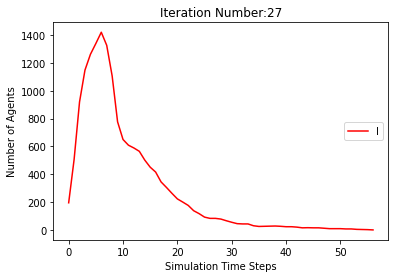

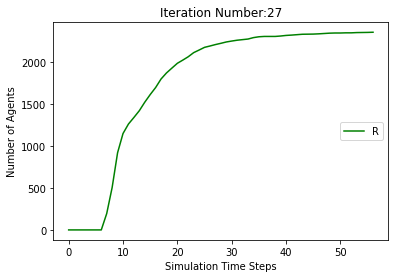

[9805, 9484, 9072, 8831, 8712, 8639, 8578, 8514, 8445, 8355, 8265, 8186, 8123, 8064, 8010, 7969, 7940, 7905, 7864, 7840, 7813, 7791, 7770, 7758, 7739, 7724, 7711, 7696, 7678, 7666, 7656, 7644, 7636, 7626, 7617, 7614, 7613, 7613, 7608, 7598, 7593, 7592, 7591, 7589, 7589, 7588, 7585, 7582, 7580, 7580, 7579, 7578, 7577, 7576, 7573, 7573, 7572, 7570, 7567, 7567, 7567, 7567, 7566, 7566, 7566, 7566, 7566, 7565, 7565, 7565, 7565, 7565, 7565, 7564, 7563, 7563, 7562, 7562, 7561, 7560, 7559, 7558, 7555, 7555, 7555, 7554, 7554, 7554, 7554, 7554, 7554, 7553, 7552, 7552, 7551, 7551, 7551, 7551, 7551, 7551, 7551, 7550, 7548, 7545, 7541, 7538, 7537, 7536, 7536, 7536, 7535, 7534, 7533, 7531, 7530, 7529, 7529, 7528, 7526, 7522, 7515, 7512, 7509, 7503, 7502, 7502, 7501, 7501, 7500, 7500, 7498, 7496, 7494, 7494, 7494, 7493, 7492, 7491, 7488, 7485, 7485, 7484, 7484, 7482, 7480, 7476, 7471, 7468, 7464, 7462, 7458, 7458, 7458, 7458, 7458, 7458, 7458, 7458]
[195, 516, 928, 1169, 1288, 1361, 1422, 1291, 1039,

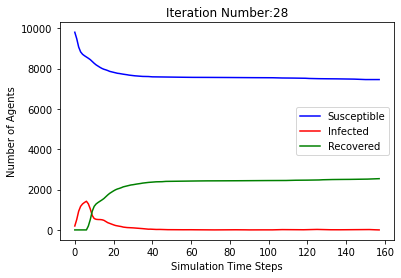

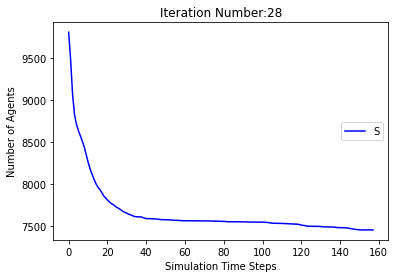

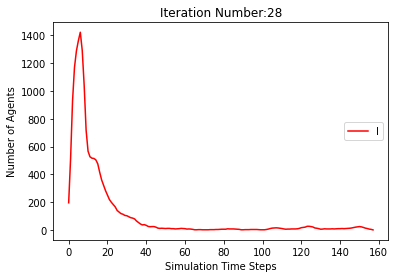

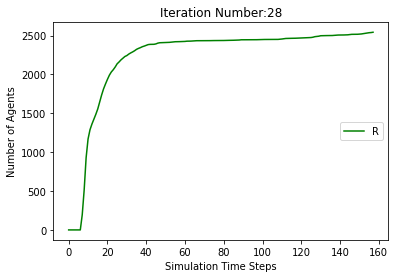

[9805, 9488, 9121, 8886, 8757, 8694, 8624, 8560, 8512, 8462, 8408, 8358, 8311, 8266, 8236, 8199, 8170, 8145, 8126, 8113, 8100, 8083, 8064, 8049, 8029, 8010, 8000, 7989, 7978, 7971, 7969, 7965, 7962, 7954, 7943, 7941, 7937, 7933, 7928, 7923, 7922, 7920, 7920, 7919, 7919, 7918, 7917, 7912, 7908, 7903, 7899, 7899, 7896, 7896, 7895, 7893, 7890, 7887, 7884, 7883, 7883, 7883, 7882, 7882, 7881, 7880, 7876, 7873, 7871, 7868, 7865, 7864, 7862, 7856, 7852, 7849, 7842, 7834, 7828, 7826, 7823, 7817, 7814, 7813, 7809, 7809, 7808, 7806, 7804, 7800, 7799, 7795, 7795, 7795, 7794, 7794, 7794, 7793, 7792, 7792, 7792, 7792, 7792, 7792, 7792, 7792]
[195, 512, 879, 1114, 1243, 1306, 1376, 1245, 976, 659, 478, 399, 383, 358, 324, 313, 292, 263, 232, 198, 166, 153, 135, 121, 116, 116, 113, 111, 105, 93, 80, 64, 48, 46, 46, 37, 34, 36, 37, 39, 32, 23, 21, 18, 14, 10, 6, 10, 12, 17, 20, 20, 22, 21, 17, 15, 13, 12, 15, 13, 13, 12, 11, 8, 6, 4, 7, 10, 12, 14, 17, 17, 18, 20, 21, 22, 26, 31, 36, 36, 33, 35, 35, 2

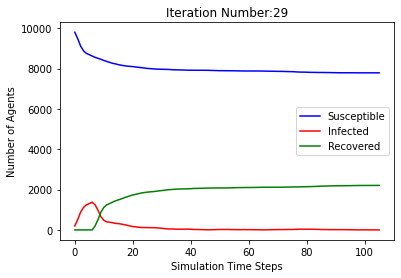

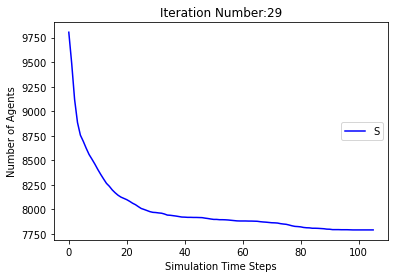

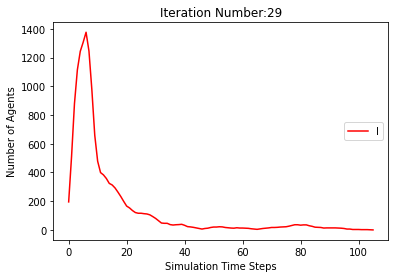

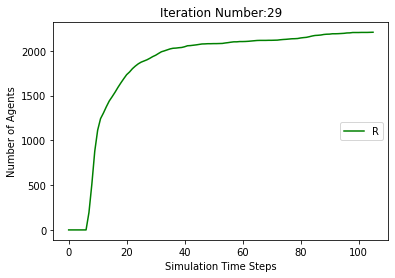

[9805, 9485, 9079, 8841, 8699, 8598, 8486, 8400, 8338, 8269, 8196, 8109, 8054, 8003, 7959, 7932, 7908, 7887, 7864, 7843, 7809, 7786, 7774, 7761, 7752, 7748, 7734, 7725, 7714, 7708, 7698, 7691, 7689, 7687, 7681, 7680, 7674, 7667, 7660, 7659, 7658, 7654, 7652, 7650, 7649, 7649, 7648, 7648, 7648, 7647, 7647, 7647, 7647, 7647, 7646, 7646, 7646, 7646, 7646, 7645, 7644, 7641, 7641, 7639, 7636, 7636, 7634, 7631, 7630, 7630, 7629, 7628, 7625, 7621, 7619, 7618, 7617, 7616, 7614, 7614, 7614, 7614, 7614, 7614, 7613, 7612, 7612, 7612, 7612, 7612, 7612, 7612, 7612]
[195, 515, 921, 1159, 1301, 1402, 1514, 1405, 1147, 810, 645, 590, 544, 483, 441, 406, 361, 309, 245, 211, 194, 173, 158, 147, 135, 116, 109, 84, 72, 66, 63, 61, 59, 47, 44, 34, 34, 31, 31, 30, 29, 27, 28, 24, 18, 11, 11, 10, 6, 5, 3, 2, 2, 1, 2, 2, 1, 1, 1, 2, 3, 5, 5, 7, 10, 10, 11, 13, 11, 11, 10, 8, 11, 13, 12, 12, 13, 13, 14, 11, 7, 5, 4, 3, 3, 2, 2, 2, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 515, 921, 1159, 1301, 1402, 1514, 1600

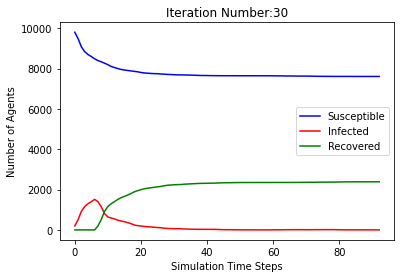

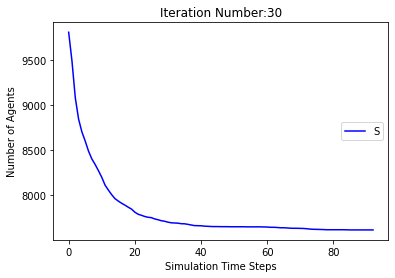

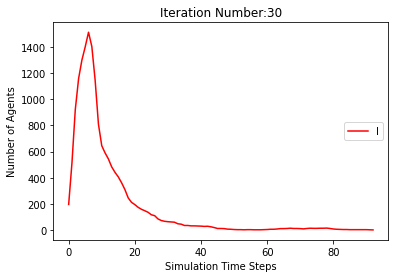

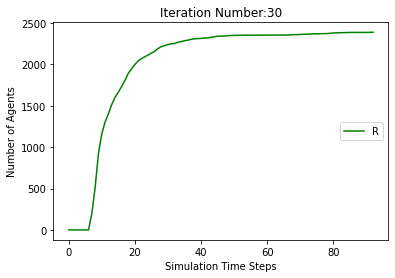

[9805, 9480, 9089, 8840, 8740, 8661, 8612, 8541, 8458, 8371, 8280, 8212, 8156, 8102, 8039, 7977, 7937, 7908, 7881, 7844, 7805, 7782, 7768, 7756, 7736, 7712, 7700, 7685, 7677, 7668, 7654, 7644, 7636, 7627, 7623, 7618, 7605, 7602, 7602, 7600, 7598, 7595, 7591, 7591, 7591, 7591, 7591, 7591, 7590, 7588, 7586, 7586, 7585, 7585, 7584, 7584, 7583, 7581, 7580, 7580, 7580, 7580, 7580, 7580, 7580, 7580]
[195, 520, 911, 1160, 1260, 1339, 1388, 1264, 1022, 718, 560, 528, 505, 510, 502, 481, 434, 372, 331, 312, 297, 257, 209, 181, 172, 169, 144, 120, 105, 100, 102, 92, 76, 73, 62, 59, 63, 52, 42, 36, 29, 28, 27, 14, 11, 11, 9, 7, 5, 3, 5, 5, 6, 6, 7, 6, 5, 5, 6, 5, 5, 4, 4, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 520, 911, 1160, 1260, 1339, 1388, 1459, 1542, 1629, 1720, 1788, 1844, 1898, 1961, 2023, 2063, 2092, 2119, 2156, 2195, 2218, 2232, 2244, 2264, 2288, 2300, 2315, 2323, 2332, 2346, 2356, 2364, 2373, 2377, 2382, 2395, 2398, 2398, 2400, 2402, 2405, 2409, 2409, 2409, 2409, 2409, 2409, 2410, 2412, 24

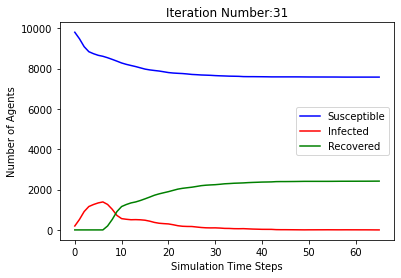

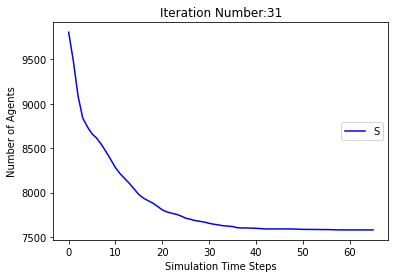

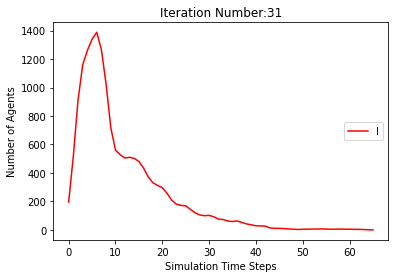

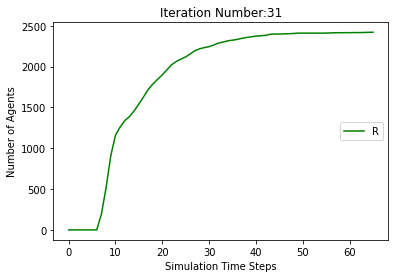

[9805, 9514, 9099, 8865, 8757, 8684, 8619, 8532, 8453, 8386, 8311, 8242, 8177, 8141, 8092, 8054, 8022, 7999, 7974, 7948, 7923, 7887, 7850, 7828, 7807, 7796, 7789, 7780, 7771, 7766, 7763, 7758, 7751, 7747, 7742, 7735, 7732, 7731, 7731, 7729, 7729, 7725, 7721, 7721, 7720, 7719, 7718, 7717, 7715, 7713, 7712, 7708, 7707, 7707, 7706, 7706, 7706, 7706, 7706, 7706, 7706, 7706]
[195, 486, 901, 1135, 1243, 1316, 1381, 1273, 1061, 713, 554, 515, 507, 478, 440, 399, 364, 312, 268, 229, 218, 205, 204, 194, 192, 178, 159, 143, 116, 84, 65, 49, 45, 42, 38, 36, 34, 32, 27, 22, 18, 17, 14, 11, 11, 12, 11, 12, 10, 8, 9, 12, 12, 11, 11, 9, 7, 6, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 486, 901, 1135, 1243, 1316, 1381, 1468, 1547, 1614, 1689, 1758, 1823, 1859, 1908, 1946, 1978, 2001, 2026, 2052, 2077, 2113, 2150, 2172, 2193, 2204, 2211, 2220, 2229, 2234, 2237, 2242, 2249, 2253, 2258, 2265, 2268, 2269, 2269, 2271, 2271, 2275, 2279, 2279, 2280, 2281, 2282, 2283, 2285, 2287, 2288, 2292, 2293, 2293, 2294]
[[]

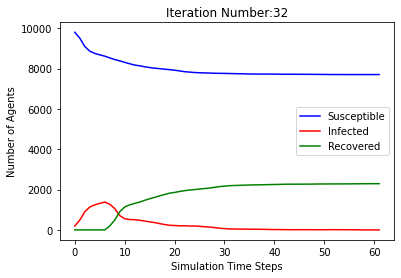

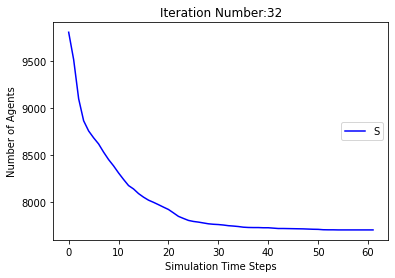

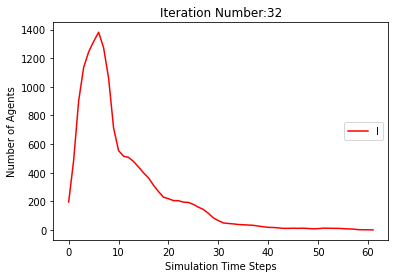

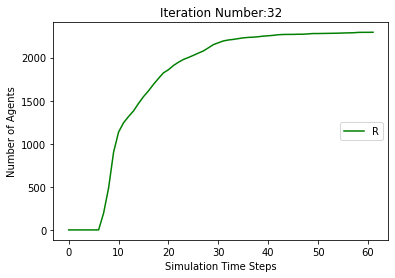

[9805, 9501, 9120, 8844, 8732, 8650, 8566, 8481, 8393, 8313, 8224, 8139, 8063, 7998, 7950, 7900, 7854, 7817, 7795, 7763, 7732, 7699, 7665, 7636, 7610, 7587, 7565, 7545, 7530, 7512, 7496, 7489, 7481, 7474, 7468, 7456, 7442, 7434, 7425, 7416, 7410, 7400, 7393, 7386, 7380, 7368, 7358, 7354, 7348, 7346, 7343, 7336, 7325, 7321, 7320, 7320, 7320, 7320, 7320, 7316, 7313, 7311, 7308, 7307, 7306, 7306, 7306, 7306, 7306, 7306, 7305, 7302, 7299, 7299, 7298, 7298, 7297, 7297, 7296, 7296, 7295, 7295, 7294, 7294, 7294, 7293, 7293, 7293, 7293, 7291, 7288, 7286, 7285, 7285, 7285, 7284, 7284, 7283, 7283, 7283, 7283, 7283, 7283, 7283, 7283]
[195, 499, 880, 1156, 1268, 1350, 1434, 1324, 1108, 807, 620, 593, 587, 568, 531, 493, 459, 407, 344, 300, 266, 251, 235, 218, 207, 208, 198, 187, 169, 153, 140, 121, 106, 91, 77, 74, 70, 62, 64, 65, 64, 68, 63, 56, 54, 57, 58, 56, 52, 47, 43, 44, 43, 37, 34, 28, 26, 23, 16, 9, 8, 9, 12, 13, 14, 14, 10, 7, 5, 2, 2, 4, 7, 7, 8, 8, 9, 8, 6, 3, 4, 3, 4, 3, 3, 3, 3, 2, 2

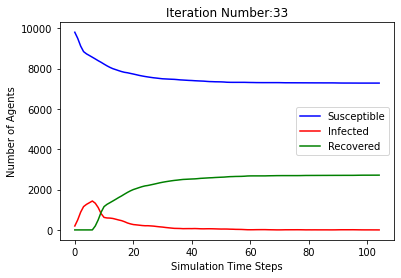

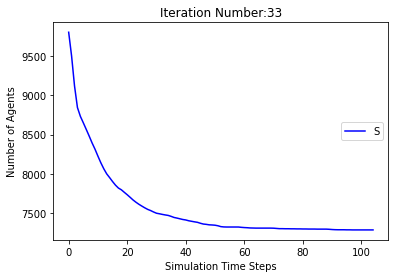

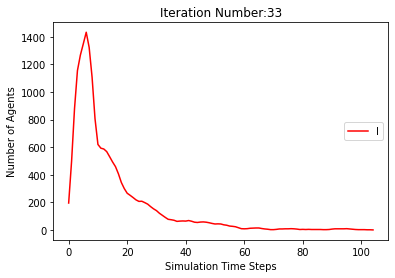

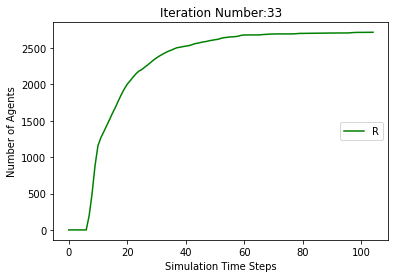

[9805, 9499, 9091, 8845, 8754, 8696, 8632, 8550, 8469, 8377, 8312, 8243, 8192, 8141, 8095, 8060, 8028, 7997, 7969, 7938, 7919, 7897, 7875, 7854, 7837, 7818, 7804, 7797, 7789, 7778, 7764, 7753, 7745, 7734, 7725, 7723, 7720, 7717, 7710, 7704, 7698, 7692, 7682, 7679, 7677, 7673, 7668, 7662, 7658, 7653, 7651, 7649, 7645, 7639, 7635, 7631, 7623, 7618, 7615, 7609, 7603, 7599, 7594, 7587, 7580, 7576, 7571, 7566, 7559, 7554, 7547, 7543, 7540, 7532, 7527, 7524, 7517, 7513, 7510, 7508, 7503, 7494, 7487, 7478, 7473, 7464, 7454, 7446, 7440, 7438, 7438, 7437, 7433, 7426, 7422, 7420, 7417, 7412, 7408, 7407, 7404, 7400, 7393, 7386, 7380, 7377, 7376, 7372, 7372, 7372, 7372, 7372, 7370, 7368, 7367, 7365, 7365, 7365, 7364, 7361, 7360, 7360, 7359, 7359, 7359, 7359, 7359, 7357, 7355, 7354, 7354, 7352, 7349, 7348, 7347, 7347, 7346, 7345, 7342, 7342, 7339, 7338, 7337, 7337, 7337, 7337, 7336, 7336, 7336, 7336, 7336, 7336, 7336, 7336]
[195, 501, 909, 1155, 1246, 1304, 1368, 1255, 1030, 714, 533, 511, 504, 491

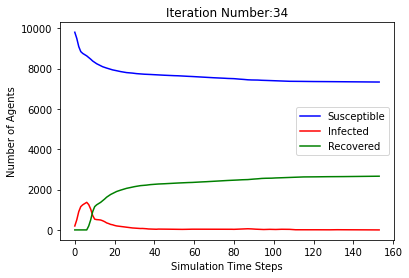

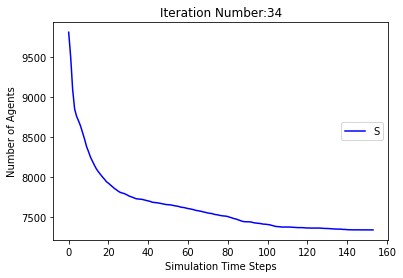

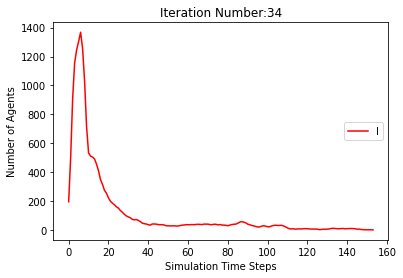

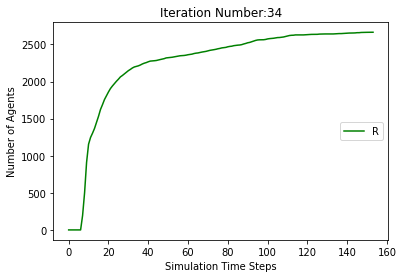

[9805, 9475, 9080, 8849, 8750, 8679, 8609, 8527, 8442, 8371, 8308, 8239, 8185, 8156, 8120, 8084, 8050, 8025, 8003, 7979, 7961, 7936, 7920, 7906, 7888, 7874, 7862, 7855, 7849, 7843, 7835, 7820, 7812, 7804, 7796, 7788, 7778, 7773, 7769, 7767, 7764, 7760, 7752, 7750, 7745, 7739, 7732, 7730, 7728, 7725, 7723, 7722, 7722, 7722, 7722, 7722, 7720, 7717, 7714, 7711, 7710, 7709, 7705, 7704, 7702, 7701, 7701, 7700, 7700, 7700, 7700, 7700, 7699, 7698, 7698, 7696, 7696, 7695, 7695, 7695, 7695, 7695, 7694, 7694, 7694, 7694, 7694, 7694, 7694, 7694]
[195, 525, 920, 1151, 1250, 1321, 1391, 1278, 1033, 709, 541, 511, 494, 453, 407, 358, 321, 283, 236, 206, 195, 184, 164, 144, 137, 129, 117, 106, 87, 77, 71, 68, 62, 58, 59, 61, 65, 62, 51, 45, 40, 36, 36, 28, 28, 30, 35, 34, 32, 27, 27, 23, 17, 10, 8, 6, 5, 6, 8, 11, 12, 13, 17, 16, 15, 13, 10, 10, 9, 5, 4, 2, 2, 3, 2, 4, 4, 5, 5, 4, 3, 3, 2, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 525, 920, 1151, 1250, 1321, 1391, 1473, 1558, 1629, 1692, 1761, 

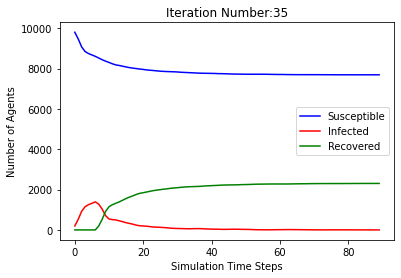

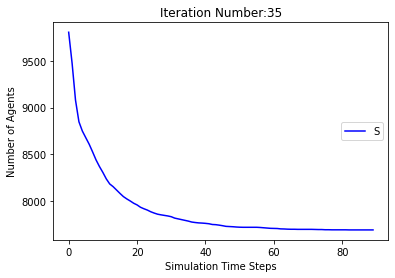

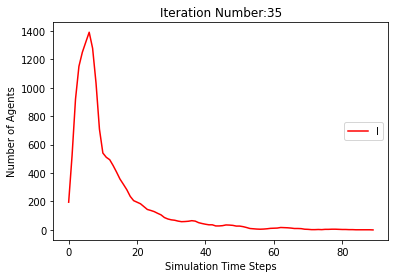

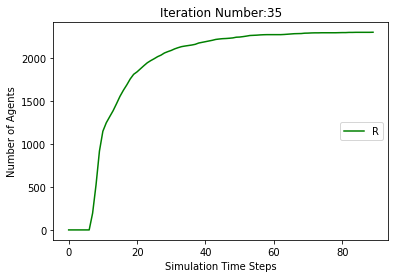

[9805, 9510, 9103, 8849, 8724, 8648, 8577, 8517, 8445, 8356, 8280, 8210, 8152, 8089, 8043, 8000, 7964, 7938, 7914, 7890, 7859, 7833, 7815, 7793, 7777, 7767, 7750, 7735, 7726, 7711, 7699, 7693, 7688, 7677, 7669, 7664, 7660, 7656, 7650, 7649, 7646, 7643, 7637, 7635, 7635, 7635, 7632, 7630, 7629, 7625, 7621, 7616, 7613, 7613, 7611, 7610, 7610, 7608, 7605, 7598, 7594, 7590, 7590, 7590, 7589, 7588, 7588, 7587, 7586, 7586, 7585, 7585, 7585, 7585, 7585, 7585, 7585, 7585]
[195, 490, 897, 1151, 1276, 1352, 1423, 1288, 1065, 747, 569, 514, 496, 488, 474, 445, 392, 342, 296, 262, 230, 210, 185, 171, 161, 147, 140, 124, 107, 104, 94, 84, 79, 73, 66, 62, 51, 43, 43, 39, 31, 26, 27, 25, 21, 15, 17, 16, 14, 12, 14, 19, 22, 19, 19, 19, 15, 13, 11, 15, 19, 21, 20, 20, 19, 17, 10, 7, 4, 4, 5, 4, 3, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 490, 897, 1151, 1276, 1352, 1423, 1483, 1555, 1644, 1720, 1790, 1848, 1911, 1957, 2000, 2036, 2062, 2086, 2110, 2141, 2167, 2185, 2207, 2223, 2233, 2250, 2265, 2274, 

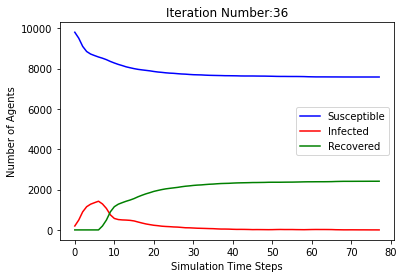

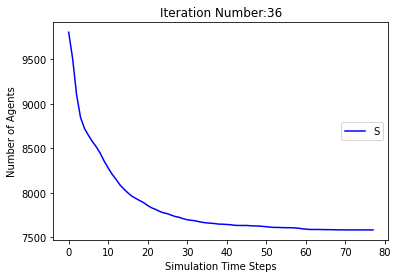

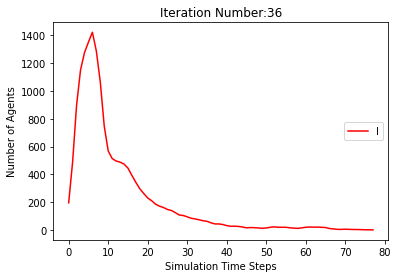

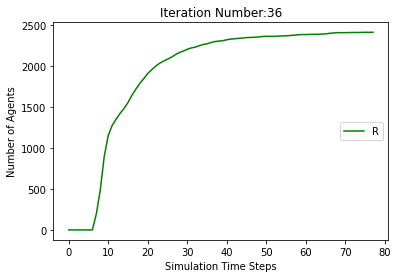

[9805, 9518, 9090, 8845, 8724, 8646, 8563, 8499, 8403, 8311, 8228, 8161, 8107, 8043, 7975, 7921, 7879, 7850, 7818, 7763, 7729, 7712, 7695, 7675, 7658, 7642, 7633, 7630, 7623, 7612, 7602, 7593, 7585, 7580, 7578, 7574, 7573, 7571, 7568, 7561, 7551, 7543, 7537, 7532, 7526, 7521, 7517, 7513, 7504, 7502, 7501, 7500, 7498, 7496, 7492, 7489, 7488, 7488, 7487, 7487, 7486, 7486, 7485, 7481, 7479, 7475, 7470, 7468, 7468, 7468, 7468, 7468, 7467, 7467, 7467, 7467, 7467, 7467, 7466, 7465, 7465, 7465, 7465, 7464, 7463, 7461, 7461, 7461, 7461, 7461, 7461, 7459, 7459, 7458, 7458, 7457, 7457, 7457, 7455, 7453, 7450, 7447, 7445, 7441, 7441, 7440, 7439, 7438, 7438, 7438, 7438, 7436, 7436, 7436, 7436, 7436, 7436, 7435, 7434, 7433, 7433, 7432, 7430, 7428, 7428, 7427, 7425, 7422, 7422, 7422, 7422, 7422, 7422, 7422, 7421, 7421, 7420, 7419, 7418, 7418, 7417, 7417, 7416, 7416, 7415, 7413, 7410, 7410, 7409, 7409, 7408, 7406, 7403, 7399, 7399, 7398, 7396, 7395, 7395, 7395, 7395, 7393, 7392, 7390, 7387, 7385, 738

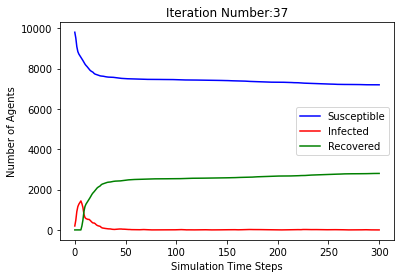

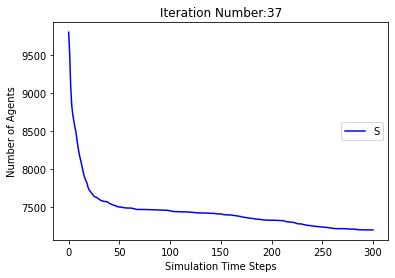

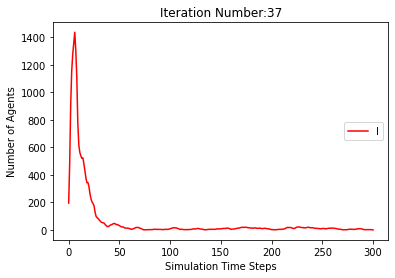

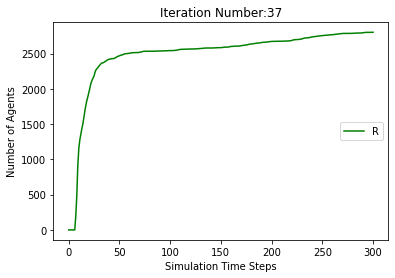

[9805, 9482, 9083, 8856, 8757, 8684, 8603, 8524, 8429, 8348, 8273, 8194, 8110, 8041, 7987, 7922, 7880, 7846, 7807, 7771, 7746, 7721, 7687, 7664, 7643, 7626, 7604, 7586, 7571, 7554, 7541, 7531, 7524, 7513, 7508, 7502, 7494, 7483, 7479, 7477, 7473, 7472, 7471, 7466, 7464, 7462, 7459, 7456, 7453, 7451, 7449, 7448, 7446, 7446, 7446, 7446, 7445, 7445, 7445, 7445, 7445, 7444, 7440, 7440, 7439, 7439, 7439, 7439, 7439, 7438, 7437, 7437, 7437, 7437, 7436, 7434, 7434, 7434, 7434, 7433, 7429, 7429, 7429, 7429, 7428, 7426, 7425, 7425, 7424, 7424, 7424, 7424, 7424, 7423, 7423, 7423, 7420, 7414, 7414, 7413, 7409, 7408, 7403, 7402, 7401, 7399, 7397, 7397, 7395, 7392, 7391, 7389, 7389, 7388, 7386, 7383, 7377, 7375, 7369, 7361, 7355, 7350, 7346, 7344, 7339, 7335, 7335, 7332, 7330, 7329, 7329, 7328, 7327, 7327, 7327, 7327, 7327, 7327, 7327, 7326, 7326, 7326, 7326, 7326, 7326, 7326, 7326]
[195, 518, 917, 1144, 1243, 1316, 1397, 1281, 1053, 735, 583, 563, 574, 562, 537, 507, 468, 427, 387, 339, 295, 266, 

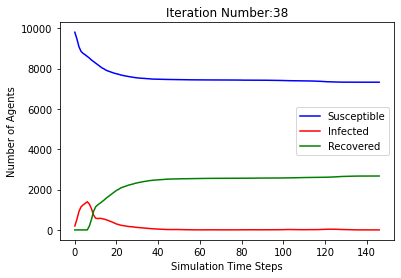

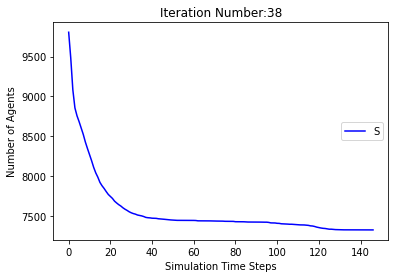

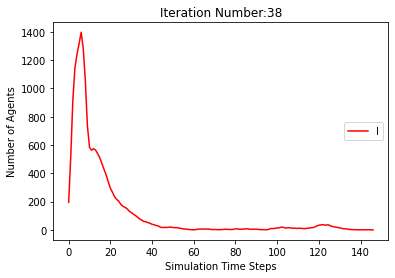

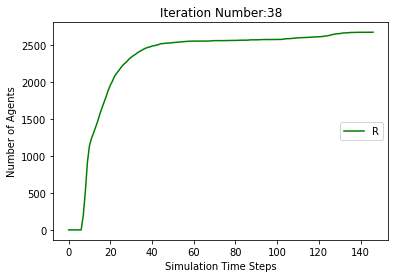

[9805, 9511, 9112, 8860, 8761, 8709, 8643, 8582, 8510, 8439, 8377, 8312, 8238, 8171, 8121, 8066, 8025, 7984, 7941, 7911, 7886, 7849, 7828, 7810, 7794, 7778, 7759, 7740, 7715, 7684, 7668, 7655, 7642, 7632, 7618, 7612, 7610, 7609, 7605, 7601, 7599, 7586, 7576, 7567, 7560, 7555, 7552, 7547, 7541, 7539, 7537, 7535, 7530, 7524, 7518, 7516, 7514, 7513, 7512, 7509, 7509, 7508, 7508, 7508, 7507, 7507, 7506, 7506, 7505, 7503, 7502, 7501, 7501, 7501, 7501, 7501, 7501, 7501, 7501]
[195, 489, 888, 1140, 1239, 1291, 1357, 1223, 1001, 673, 483, 449, 471, 472, 461, 444, 414, 393, 371, 327, 285, 272, 238, 215, 190, 163, 152, 146, 134, 144, 142, 139, 136, 127, 122, 103, 74, 59, 50, 41, 33, 32, 36, 43, 49, 50, 49, 52, 45, 37, 30, 25, 25, 28, 29, 25, 25, 24, 23, 21, 15, 10, 8, 6, 6, 5, 3, 3, 3, 5, 6, 6, 6, 5, 5, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 489, 888, 1140, 1239, 1291, 1357, 1418, 1490, 1561, 1623, 1688, 1762, 1829, 1879, 1934, 1975, 2016, 2059, 2089, 2114, 2151, 2172, 2190, 2206, 2222, 2241, 22

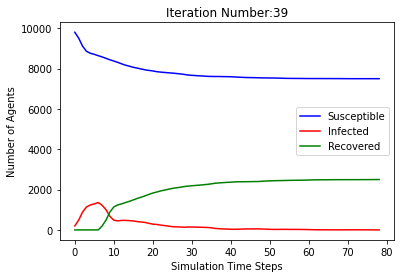

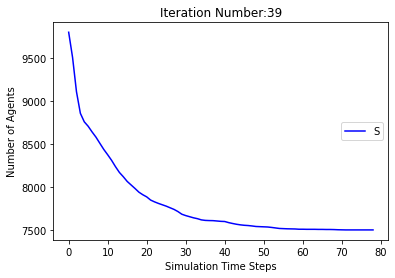

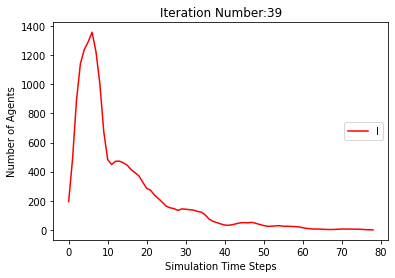

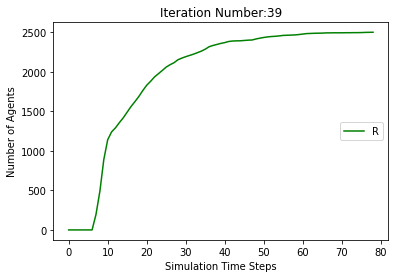

[9805, 9517, 9120, 8856, 8757, 8677, 8602, 8508, 8418, 8326, 8258, 8191, 8141, 8102, 8055, 8005, 7956, 7924, 7891, 7852, 7822, 7798, 7770, 7743, 7718, 7694, 7681, 7673, 7660, 7651, 7640, 7620, 7609, 7602, 7599, 7591, 7581, 7570, 7566, 7564, 7563, 7563, 7563, 7562, 7562, 7561, 7558, 7556, 7553, 7552, 7551, 7551, 7551, 7551, 7550, 7549, 7547, 7546, 7546, 7545, 7544, 7542, 7542, 7540, 7539, 7537, 7532, 7529, 7529, 7528, 7527, 7527, 7523, 7518, 7516, 7512, 7508, 7501, 7499, 7496, 7496, 7494, 7492, 7484, 7483, 7482, 7481, 7478, 7475, 7475, 7475, 7475, 7474, 7473, 7472, 7466, 7463, 7463, 7463, 7463, 7463, 7462, 7460, 7457, 7457, 7457, 7456, 7455, 7451, 7447, 7443, 7437, 7436, 7434, 7427, 7422, 7419, 7417, 7413, 7410, 7409, 7408, 7406, 7403, 7395, 7392, 7390, 7386, 7384, 7381, 7380, 7378, 7372, 7366, 7364, 7363, 7361, 7359, 7357, 7356, 7356, 7352, 7350, 7345, 7342, 7336, 7328, 7326, 7326, 7326, 7326, 7326, 7325, 7323, 7323, 7320, 7320, 7319, 7319, 7319, 7318, 7318, 7318, 7318, 7317, 7315, 731

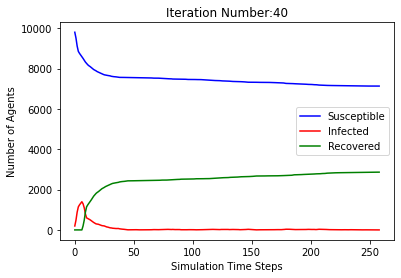

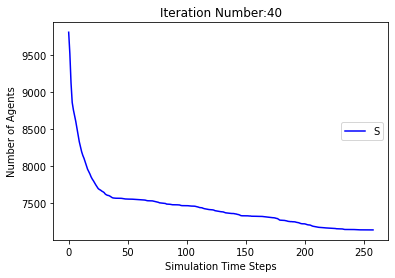

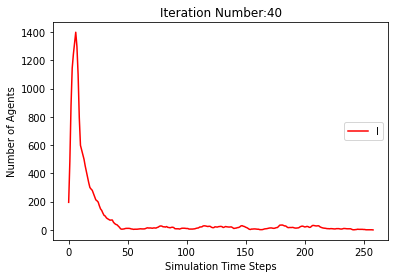

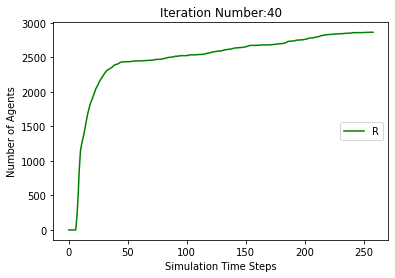

[9805, 9510, 9095, 8861, 8748, 8656, 8573, 8490, 8400, 8306, 8213, 8141, 8071, 8007, 7943, 7882, 7842, 7814, 7786, 7754, 7707, 7658, 7626, 7601, 7577, 7556, 7527, 7504, 7489, 7473, 7456, 7433, 7417, 7402, 7383, 7370, 7360, 7355, 7351, 7345, 7331, 7324, 7318, 7313, 7308, 7302, 7294, 7288, 7286, 7284, 7282, 7279, 7275, 7269, 7260, 7255, 7255, 7254, 7253, 7251, 7247, 7246, 7242, 7239, 7233, 7229, 7227, 7226, 7226, 7226, 7225, 7222, 7219, 7216, 7214, 7213, 7213, 7213, 7209, 7204, 7202, 7201, 7201, 7201, 7200, 7200, 7198, 7197, 7196, 7194, 7193, 7190, 7190, 7188, 7186, 7182, 7177, 7169, 7166, 7165, 7163, 7161, 7159, 7158, 7158, 7155, 7153, 7151, 7150, 7145, 7143, 7139, 7133, 7127, 7124, 7121, 7119, 7118, 7118, 7118, 7118, 7118, 7117, 7117, 7116, 7115, 7115, 7114, 7112, 7108, 7104, 7103, 7102, 7100, 7099, 7096, 7094, 7091, 7084, 7080, 7070, 7065, 7059, 7056, 7056, 7055, 7055, 7053, 7048, 7045, 7040, 7037, 7031, 7025, 7024, 7023, 7023, 7022, 7022, 7017, 7014, 7012, 7009, 7008, 7007, 7002, 699

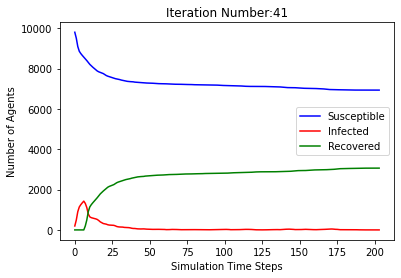

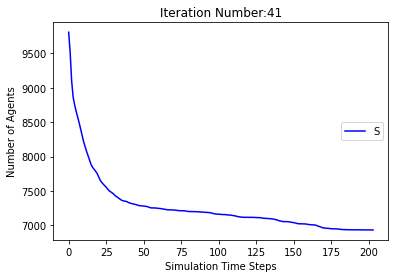

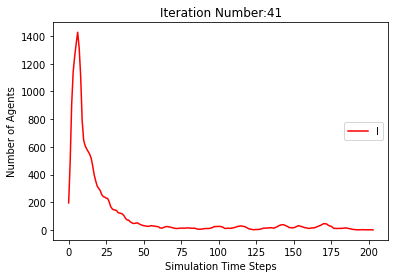

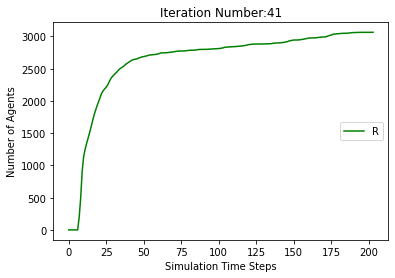

[9805, 9492, 9070, 8815, 8724, 8663, 8572, 8464, 8337, 8241, 8148, 8080, 8019, 7944, 7876, 7828, 7791, 7755, 7727, 7692, 7669, 7651, 7623, 7603, 7573, 7548, 7532, 7519, 7508, 7496, 7481, 7469, 7457, 7450, 7444, 7441, 7438, 7433, 7431, 7430, 7428, 7425, 7419, 7415, 7408, 7407, 7405, 7402, 7400, 7399, 7396, 7394, 7391, 7387, 7387, 7387, 7384, 7379, 7379, 7378, 7374, 7373, 7373, 7373, 7373, 7373, 7373, 7373, 7373]
[195, 508, 930, 1185, 1276, 1337, 1428, 1341, 1155, 829, 667, 644, 644, 628, 588, 509, 450, 393, 353, 327, 275, 225, 205, 188, 182, 179, 160, 150, 143, 127, 122, 104, 91, 82, 75, 67, 58, 48, 38, 27, 22, 19, 22, 23, 25, 24, 25, 26, 25, 20, 19, 14, 16, 18, 15, 13, 15, 17, 15, 13, 13, 14, 14, 11, 6, 6, 5, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 508, 930, 1185, 1276, 1337, 1428, 1536, 1663, 1759, 1852, 1920, 1981, 2056, 2124, 2172, 2209, 2245, 2273, 2308, 2331, 2349, 2377, 2397, 2427, 2452, 2468, 2481, 2492, 2504, 2519, 2531, 2543, 2550, 2556, 2559, 2562, 2567, 2569, 2570, 2572, 2575, 2581

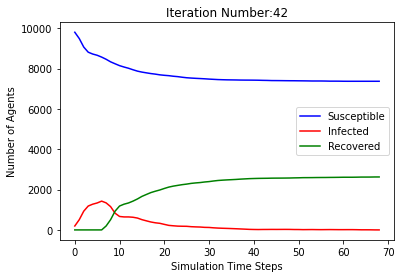

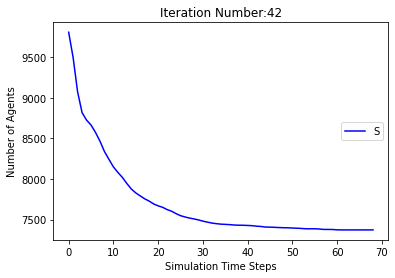

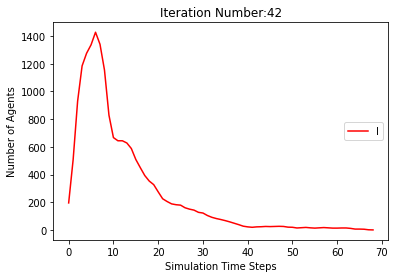

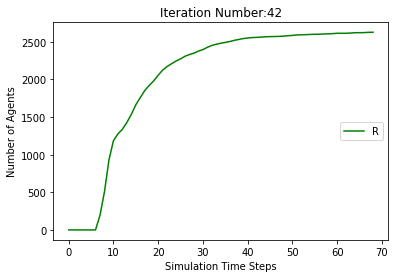

[9805, 9454, 9073, 8869, 8771, 8712, 8668, 8605, 8519, 8421, 8331, 8265, 8223, 8187, 8152, 8120, 8088, 8065, 8045, 8030, 8027, 8016, 7996, 7983, 7975, 7968, 7963, 7958, 7954, 7947, 7941, 7937, 7934, 7934, 7933, 7933, 7931, 7930, 7930, 7930, 7928, 7928, 7927, 7927, 7927, 7927, 7927, 7927, 7926, 7925, 7924, 7923, 7923, 7923, 7923, 7923, 7921, 7917, 7917, 7917, 7917, 7917, 7915, 7913, 7908, 7904, 7903, 7902, 7902, 7902, 7902, 7902, 7900, 7898, 7898, 7897, 7894, 7891, 7889, 7889, 7889, 7889, 7889, 7888, 7888, 7888, 7888, 7888, 7888, 7888, 7888]
[195, 546, 927, 1131, 1229, 1288, 1332, 1200, 935, 652, 538, 506, 489, 481, 453, 399, 333, 266, 220, 193, 160, 136, 124, 105, 90, 77, 67, 69, 62, 49, 42, 38, 34, 29, 25, 21, 16, 11, 7, 4, 6, 5, 6, 4, 3, 3, 3, 1, 2, 2, 3, 4, 4, 4, 4, 3, 4, 7, 6, 6, 6, 6, 8, 8, 9, 13, 14, 15, 15, 13, 11, 6, 4, 5, 4, 5, 8, 11, 13, 11, 9, 9, 8, 6, 3, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 546, 927, 1131, 1229, 1288, 1332, 1395, 1481, 1579, 1669, 1735, 1777, 1813, 

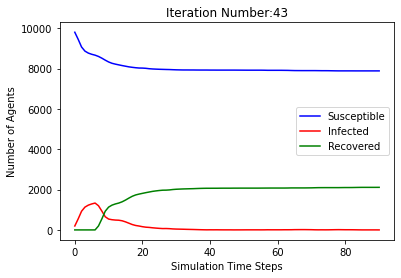

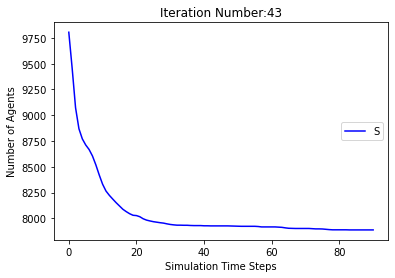

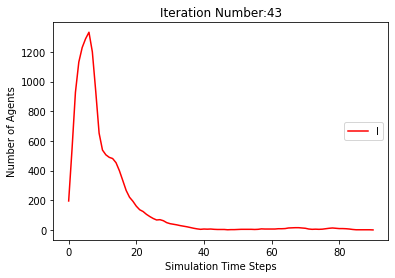

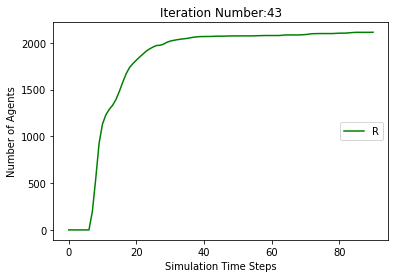

[9805, 9512, 9107, 8836, 8738, 8678, 8609, 8521, 8450, 8378, 8300, 8222, 8155, 8101, 8043, 7984, 7939, 7897, 7871, 7847, 7823, 7797, 7776, 7757, 7731, 7710, 7702, 7691, 7683, 7672, 7668, 7660, 7656, 7655, 7652, 7649, 7645, 7640, 7633, 7632, 7631, 7626, 7623, 7620, 7618, 7614, 7610, 7604, 7601, 7599, 7595, 7588, 7585, 7582, 7576, 7566, 7559, 7552, 7542, 7534, 7526, 7520, 7514, 7511, 7509, 7509, 7506, 7501, 7495, 7493, 7491, 7490, 7487, 7481, 7475, 7472, 7469, 7469, 7468, 7467, 7466, 7466, 7465, 7462, 7459, 7458, 7455, 7455, 7455, 7455, 7455, 7455, 7455, 7455]
[195, 488, 893, 1164, 1262, 1322, 1391, 1284, 1062, 729, 536, 516, 523, 508, 478, 466, 439, 403, 351, 308, 278, 246, 208, 182, 166, 161, 145, 132, 114, 104, 89, 71, 54, 47, 39, 34, 27, 28, 27, 24, 24, 26, 26, 25, 22, 19, 22, 27, 25, 24, 25, 30, 29, 28, 28, 35, 40, 43, 46, 51, 56, 56, 52, 48, 43, 33, 28, 25, 25, 21, 20, 19, 22, 25, 26, 23, 24, 22, 22, 20, 15, 9, 7, 7, 10, 10, 12, 11, 11, 10, 7, 4, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 48

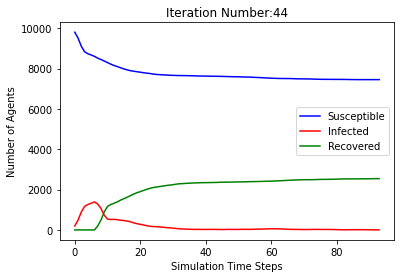

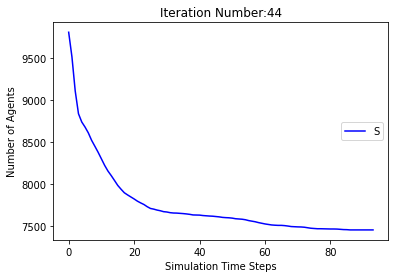

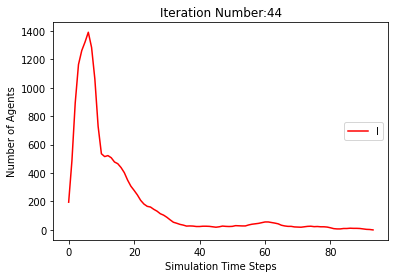

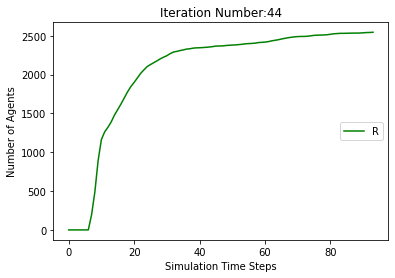

[9805, 9495, 9098, 8840, 8739, 8657, 8584, 8505, 8419, 8335, 8234, 8157, 8100, 8044, 7999, 7940, 7879, 7837, 7792, 7760, 7731, 7707, 7675, 7639, 7603, 7584, 7555, 7525, 7499, 7470, 7455, 7441, 7432, 7421, 7413, 7402, 7394, 7382, 7373, 7369, 7365, 7359, 7357, 7355, 7352, 7349, 7348, 7347, 7345, 7342, 7341, 7339, 7337, 7334, 7333, 7333, 7333, 7333, 7333, 7333, 7333, 7330, 7326, 7322, 7320, 7319, 7319, 7319, 7319, 7318, 7318, 7317, 7316, 7313, 7310, 7307, 7305, 7302, 7299, 7293, 7289, 7286, 7285, 7285, 7284, 7283, 7283, 7282, 7282, 7282, 7282, 7282, 7282, 7282, 7282]
[195, 505, 902, 1160, 1261, 1343, 1416, 1300, 1076, 763, 606, 582, 557, 540, 506, 479, 456, 397, 365, 340, 313, 292, 265, 240, 234, 208, 205, 206, 208, 205, 184, 162, 152, 134, 112, 97, 76, 73, 68, 63, 56, 54, 45, 39, 30, 24, 21, 18, 14, 15, 14, 13, 12, 14, 14, 12, 9, 8, 6, 4, 1, 3, 7, 11, 13, 14, 14, 14, 11, 8, 4, 3, 3, 6, 9, 12, 13, 16, 18, 23, 24, 24, 22, 20, 18, 16, 10, 7, 4, 3, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 5

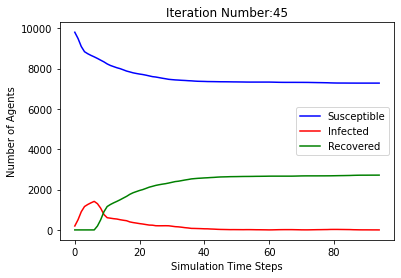

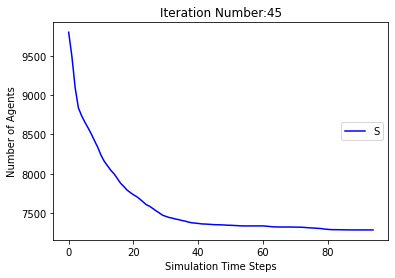

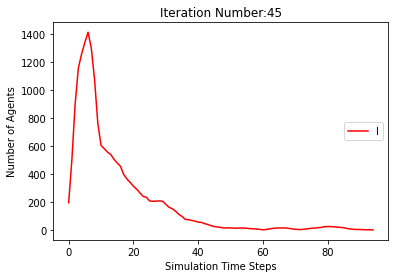

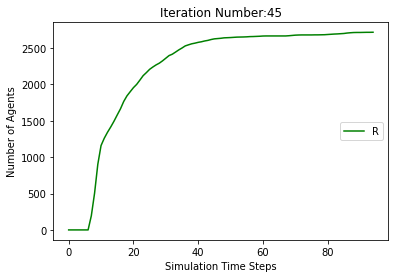

[9805, 9487, 9111, 8861, 8757, 8672, 8597, 8522, 8440, 8355, 8274, 8189, 8123, 8060, 8007, 7969, 7929, 7896, 7860, 7826, 7791, 7752, 7722, 7706, 7678, 7652, 7628, 7606, 7581, 7564, 7548, 7528, 7514, 7511, 7506, 7500, 7490, 7486, 7481, 7474, 7466, 7462, 7457, 7450, 7445, 7441, 7434, 7433, 7430, 7429, 7428, 7428, 7427, 7426, 7424, 7423, 7422, 7422, 7421, 7419, 7418, 7417, 7417, 7417, 7417, 7417, 7417, 7417, 7417]
[195, 513, 889, 1139, 1243, 1328, 1403, 1283, 1047, 756, 587, 568, 549, 537, 515, 471, 426, 378, 329, 297, 269, 255, 247, 223, 218, 208, 198, 185, 171, 158, 158, 150, 138, 117, 100, 81, 74, 62, 47, 40, 45, 44, 43, 40, 41, 40, 40, 33, 32, 28, 22, 17, 14, 8, 9, 7, 7, 6, 7, 8, 8, 7, 6, 5, 5, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 513, 889, 1139, 1243, 1328, 1403, 1478, 1560, 1645, 1726, 1811, 1877, 1940, 1993, 2031, 2071, 2104, 2140, 2174, 2209, 2248, 2278, 2294, 2322, 2348, 2372, 2394, 2419, 2436, 2452, 2472, 2486, 2489, 2494, 2500, 2510, 2514, 2519, 2526, 2534, 2538, 2543, 2550, 

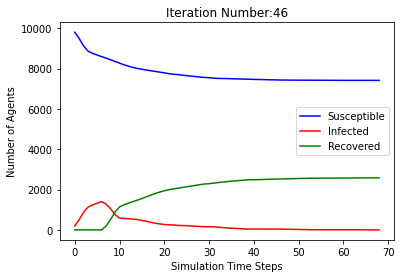

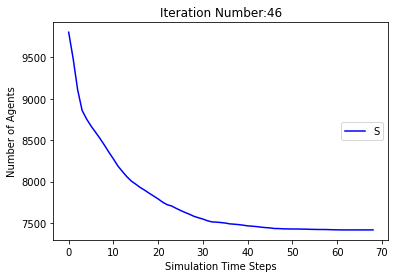

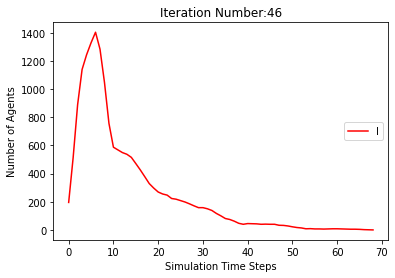

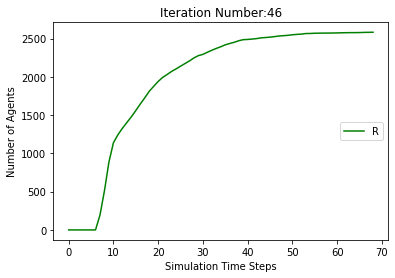

[9805, 9481, 9077, 8854, 8761, 8689, 8631, 8567, 8485, 8412, 8333, 8253, 8174, 8107, 8055, 8012, 7979, 7949, 7916, 7880, 7856, 7828, 7798, 7769, 7739, 7709, 7684, 7662, 7648, 7637, 7628, 7617, 7610, 7594, 7579, 7576, 7571, 7567, 7562, 7558, 7552, 7546, 7542, 7535, 7533, 7531, 7527, 7526, 7525, 7524, 7523, 7523, 7521, 7521, 7521, 7521, 7520, 7518, 7517, 7516, 7516, 7516, 7516, 7516, 7515, 7513, 7513, 7511, 7507, 7507, 7507, 7506, 7502, 7500, 7497, 7492, 7491, 7491, 7491, 7491, 7490, 7490, 7489, 7488, 7487, 7486, 7486, 7486, 7485, 7485, 7485, 7483, 7482, 7481, 7481, 7481, 7480, 7479, 7477, 7477, 7477, 7477, 7476, 7473, 7471, 7468, 7467, 7466, 7464, 7462, 7460, 7460, 7457, 7454, 7453, 7453, 7453, 7453, 7452, 7450, 7450, 7450, 7450, 7448, 7447, 7444, 7442, 7439, 7438, 7438, 7438, 7438, 7438, 7437, 7437, 7437, 7436, 7436, 7436, 7436, 7436, 7436, 7434, 7434, 7434, 7433, 7429, 7424, 7421, 7419, 7419, 7419, 7419, 7419, 7419, 7419, 7419]
[195, 519, 923, 1146, 1239, 1311, 1369, 1238, 996, 665, 5

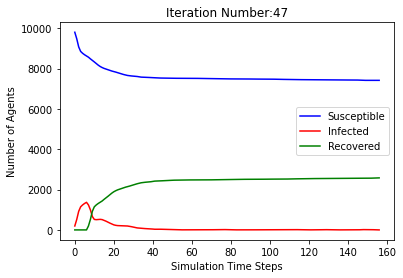

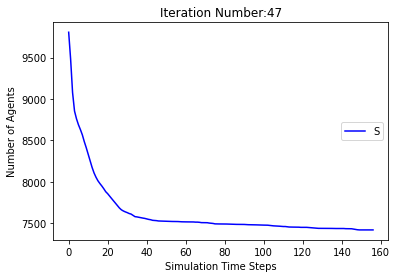

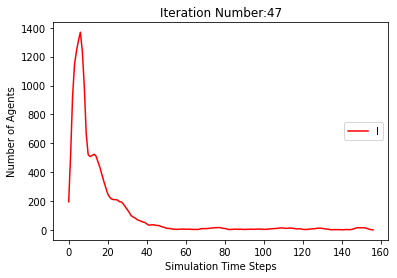

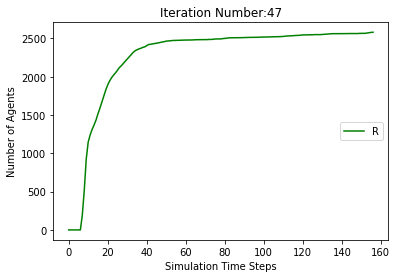

[9805, 9520, 9117, 8878, 8755, 8677, 8585, 8508, 8425, 8341, 8268, 8212, 8161, 8104, 8068, 8036, 7995, 7949, 7919, 7897, 7878, 7858, 7841, 7829, 7812, 7802, 7788, 7774, 7757, 7748, 7739, 7732, 7722, 7716, 7706, 7702, 7696, 7694, 7690, 7686, 7682, 7680, 7679, 7676, 7673, 7667, 7661, 7658, 7656, 7655, 7653, 7653, 7652, 7651, 7648, 7647, 7646, 7645, 7645, 7644, 7643, 7643, 7642, 7640, 7638, 7638, 7638, 7638, 7637, 7637, 7637, 7637, 7637, 7636, 7635, 7632, 7631, 7629, 7629, 7629, 7629, 7627, 7626, 7626, 7626, 7624, 7623, 7623, 7622, 7621, 7618, 7616, 7613, 7612, 7612, 7612, 7611, 7610, 7608, 7607, 7607, 7607, 7607, 7606, 7606, 7606, 7606, 7606, 7606, 7606, 7606]
[195, 480, 883, 1122, 1245, 1323, 1415, 1297, 1095, 776, 610, 543, 516, 481, 440, 389, 346, 319, 293, 264, 226, 210, 195, 166, 137, 117, 109, 104, 101, 93, 90, 80, 80, 72, 68, 55, 52, 45, 42, 36, 34, 26, 23, 20, 21, 23, 25, 24, 24, 24, 23, 20, 15, 10, 10, 9, 9, 8, 8, 8, 8, 5, 5, 6, 7, 7, 6, 5, 6, 5, 3, 1, 1, 2, 3, 5, 6, 8, 8, 8, 7,

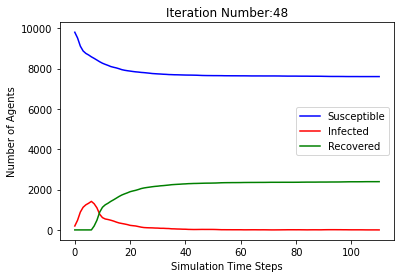

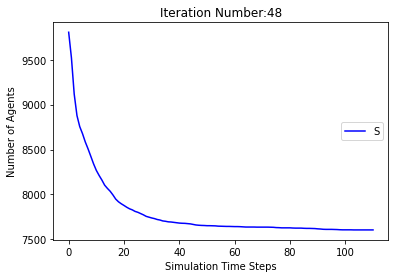

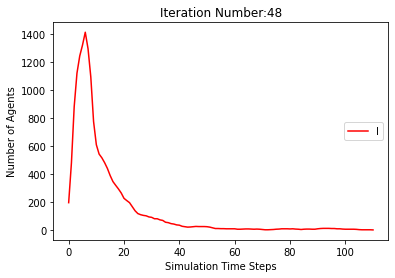

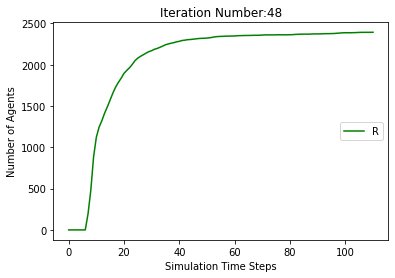

[9805, 9501, 9111, 8845, 8732, 8649, 8561, 8458, 8360, 8263, 8180, 8066, 7998, 7926, 7862, 7813, 7777, 7730, 7678, 7638, 7602, 7578, 7544, 7529, 7512, 7502, 7493, 7484, 7471, 7458, 7445, 7432, 7425, 7422, 7417, 7414, 7411, 7405, 7398, 7387, 7383, 7383, 7382, 7381, 7379, 7377, 7377, 7377, 7377, 7377, 7376, 7376, 7376, 7375, 7374, 7371, 7370, 7369, 7368, 7368, 7367, 7367, 7366, 7365, 7365, 7365, 7365, 7364, 7363, 7362, 7361, 7354, 7348, 7346, 7345, 7343, 7340, 7337, 7329, 7328, 7327, 7327, 7326, 7325, 7323, 7319, 7316, 7313, 7309, 7309, 7308, 7307, 7305, 7304, 7304, 7299, 7297, 7289, 7288, 7288, 7288, 7288, 7288, 7287, 7287, 7287, 7287, 7287, 7287, 7287, 7287]
[195, 499, 889, 1155, 1268, 1351, 1439, 1347, 1141, 848, 665, 666, 651, 635, 596, 547, 486, 450, 388, 360, 324, 284, 269, 248, 218, 176, 145, 118, 107, 86, 84, 80, 77, 71, 67, 57, 47, 40, 34, 38, 39, 34, 32, 30, 26, 21, 10, 6, 6, 5, 5, 3, 1, 2, 3, 6, 7, 7, 8, 8, 8, 7, 5, 5, 4, 3, 3, 3, 4, 4, 4, 11, 17, 19, 19, 20, 22, 24, 25, 20, 1

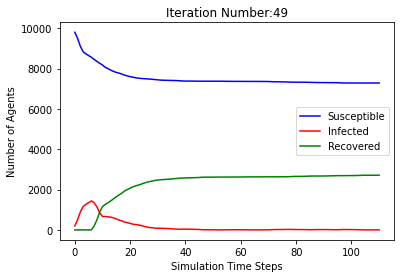

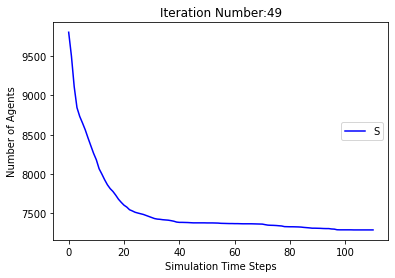

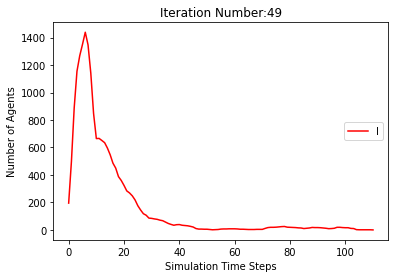

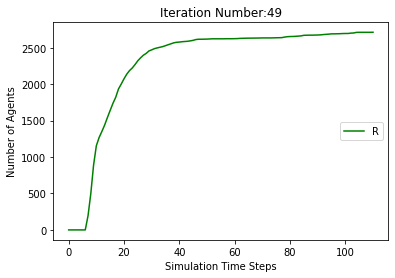

[9805, 9482, 9060, 8809, 8715, 8652, 8575, 8494, 8412, 8340, 8246, 8157, 8084, 8032, 7984, 7935, 7896, 7867, 7842, 7822, 7801, 7768, 7739, 7700, 7672, 7649, 7631, 7614, 7597, 7584, 7575, 7571, 7563, 7553, 7546, 7537, 7523, 7507, 7496, 7488, 7482, 7475, 7468, 7468, 7466, 7463, 7459, 7454, 7449, 7444, 7442, 7441, 7440, 7436, 7434, 7433, 7432, 7432, 7429, 7426, 7426, 7426, 7424, 7420, 7415, 7412, 7412, 7408, 7406, 7401, 7396, 7394, 7392, 7390, 7390, 7390, 7390, 7388, 7381, 7375, 7370, 7364, 7356, 7347, 7339, 7330, 7317, 7306, 7302, 7301, 7300, 7299, 7299, 7299, 7298, 7297, 7293, 7292, 7292, 7292, 7290, 7289, 7289, 7289, 7288, 7288, 7287, 7286, 7286, 7286, 7286, 7285, 7283, 7276, 7272, 7270, 7261, 7259, 7257, 7254, 7249, 7247, 7244, 7244, 7244, 7243, 7243, 7242, 7242, 7242, 7241, 7241, 7238, 7235, 7231, 7227, 7223, 7221, 7217, 7214, 7214, 7213, 7211, 7209, 7208, 7206, 7205, 7204, 7204, 7204, 7203, 7201, 7196, 7192, 7190, 7188, 7186, 7182, 7179, 7178, 7177, 7177, 7177, 7176, 7174, 7171, 717

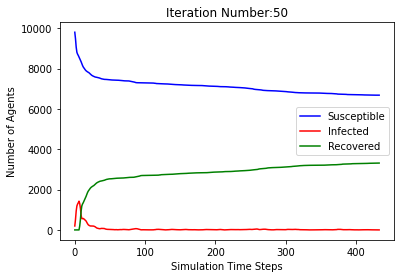

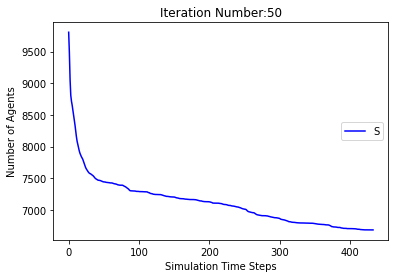

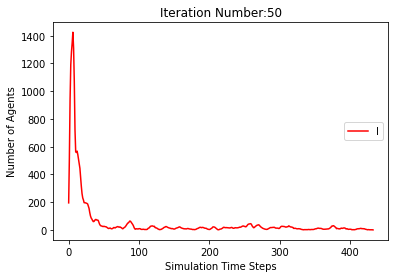

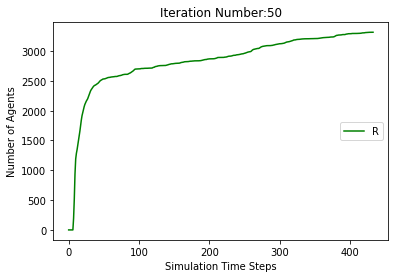

[9805, 9501, 9114, 8849, 8727, 8650, 8572, 8492, 8403, 8309, 8231, 8151, 8083, 8025, 7972, 7939, 7916, 7885, 7849, 7823, 7802, 7783, 7759, 7732, 7702, 7686, 7671, 7661, 7647, 7639, 7624, 7607, 7590, 7580, 7572, 7566, 7556, 7550, 7538, 7529, 7524, 7513, 7507, 7502, 7495, 7486, 7485, 7484, 7482, 7480, 7478, 7476, 7473, 7468, 7464, 7463, 7458, 7456, 7456, 7456, 7456, 7455, 7454, 7452, 7451, 7450, 7450, 7450, 7448, 7447, 7445, 7445, 7445, 7445, 7445, 7445, 7445, 7445]
[195, 499, 886, 1151, 1273, 1350, 1428, 1313, 1098, 805, 618, 576, 567, 547, 520, 464, 393, 346, 302, 260, 223, 189, 180, 184, 183, 163, 152, 141, 136, 120, 108, 95, 96, 91, 89, 81, 83, 74, 69, 61, 56, 59, 59, 54, 55, 52, 44, 40, 31, 27, 24, 19, 13, 17, 20, 19, 22, 22, 20, 17, 12, 9, 9, 6, 5, 6, 6, 6, 7, 7, 7, 6, 5, 5, 5, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 499, 886, 1151, 1273, 1350, 1428, 1508, 1597, 1691, 1769, 1849, 1917, 1975, 2028, 2061, 2084, 2115, 2151, 2177, 2198, 2217, 2241, 2268, 2298, 2314, 2329, 2339, 2353, 2361,

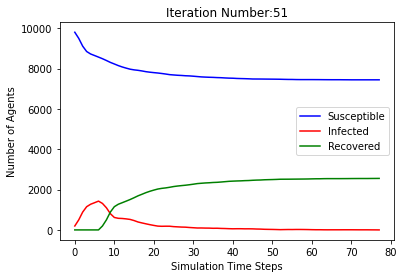

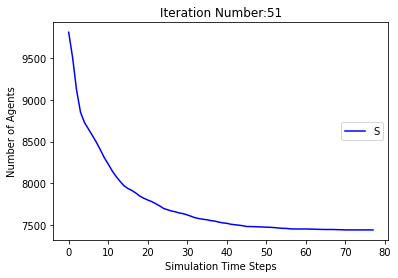

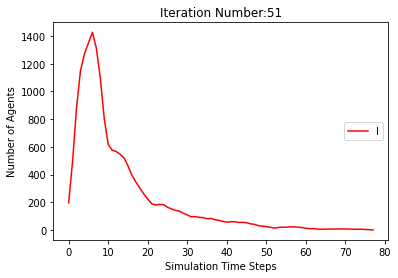

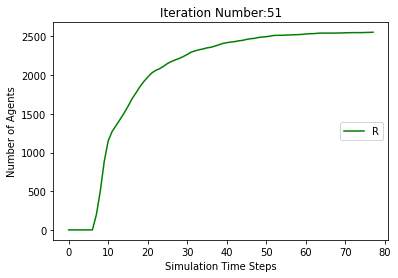

[9805, 9485, 9111, 8865, 8729, 8658, 8583, 8505, 8421, 8334, 8262, 8198, 8148, 8098, 8047, 7993, 7952, 7914, 7894, 7865, 7839, 7822, 7807, 7788, 7774, 7760, 7748, 7737, 7726, 7706, 7693, 7684, 7676, 7668, 7652, 7641, 7627, 7621, 7616, 7612, 7608, 7607, 7602, 7598, 7591, 7586, 7584, 7582, 7580, 7580, 7579, 7579, 7578, 7577, 7575, 7574, 7573, 7571, 7564, 7562, 7562, 7562, 7562, 7560, 7557, 7554, 7550, 7547, 7544, 7542, 7542, 7542, 7542, 7541, 7535, 7528, 7525, 7524, 7523, 7518, 7513, 7508, 7507, 7506, 7506, 7505, 7504, 7504, 7504, 7504, 7504, 7503, 7503, 7503, 7501, 7500, 7500, 7500, 7500, 7500, 7500, 7500, 7500]
[195, 515, 889, 1135, 1271, 1342, 1417, 1300, 1064, 777, 603, 531, 510, 485, 458, 428, 382, 348, 304, 283, 259, 225, 186, 164, 140, 134, 117, 102, 96, 101, 95, 90, 84, 80, 85, 85, 79, 72, 68, 64, 60, 45, 39, 29, 30, 30, 28, 26, 27, 22, 19, 12, 8, 7, 7, 6, 7, 8, 15, 16, 15, 13, 12, 13, 14, 10, 12, 15, 18, 20, 18, 15, 12, 9, 12, 16, 17, 18, 19, 24, 28, 27, 21, 19, 18, 18, 14, 9, 4

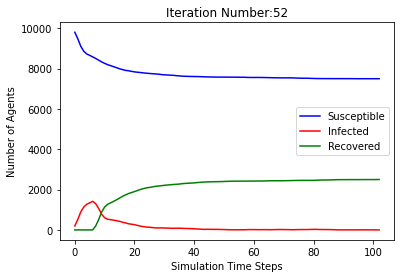

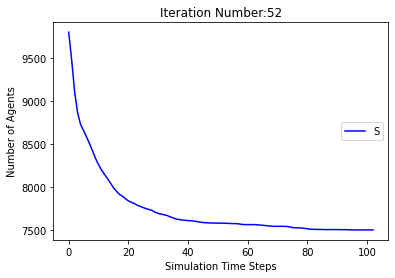

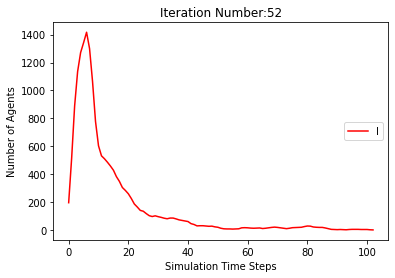

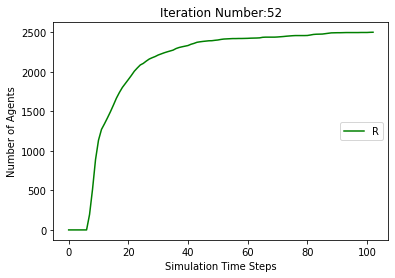

[9805, 9481, 9067, 8808, 8682, 8592, 8509, 8429, 8355, 8275, 8196, 8119, 8047, 7992, 7953, 7906, 7849, 7794, 7749, 7702, 7657, 7619, 7586, 7559, 7523, 7482, 7443, 7425, 7413, 7399, 7388, 7377, 7366, 7355, 7339, 7326, 7316, 7302, 7293, 7286, 7282, 7279, 7276, 7273, 7270, 7264, 7260, 7256, 7252, 7244, 7241, 7239, 7237, 7236, 7236, 7235, 7234, 7234, 7234, 7229, 7226, 7223, 7223, 7222, 7220, 7216, 7212, 7208, 7202, 7200, 7197, 7197, 7196, 7192, 7190, 7189, 7189, 7189, 7188, 7187, 7185, 7181, 7177, 7176, 7176, 7174, 7173, 7172, 7169, 7167, 7166, 7164, 7164, 7164, 7164, 7164, 7164, 7164, 7163, 7163, 7162, 7162, 7162, 7162, 7162, 7162, 7162, 7162]
[195, 519, 933, 1192, 1318, 1408, 1491, 1376, 1126, 792, 612, 563, 545, 517, 476, 449, 426, 402, 370, 345, 335, 334, 320, 290, 271, 267, 259, 232, 206, 187, 171, 146, 116, 88, 86, 87, 83, 86, 84, 80, 73, 60, 50, 43, 32, 29, 26, 26, 27, 32, 32, 31, 27, 24, 20, 17, 10, 7, 5, 8, 10, 13, 12, 12, 14, 18, 17, 18, 21, 23, 25, 23, 20, 20, 18, 13, 11, 8, 9, 

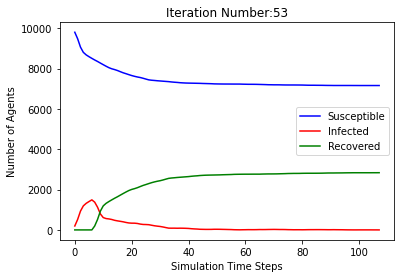

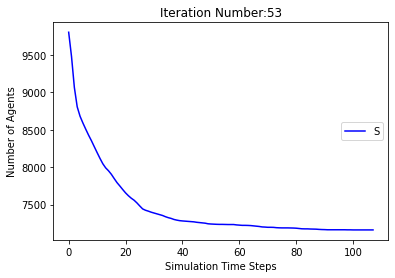

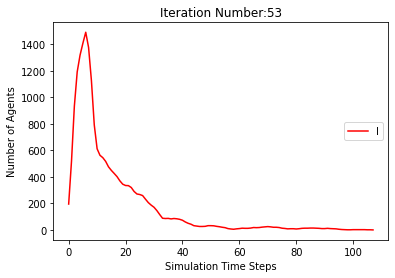

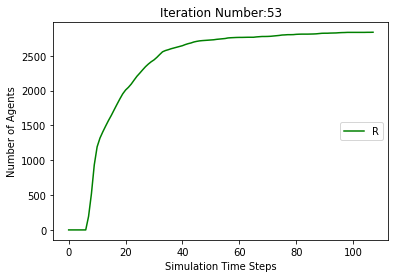

[9805, 9483, 9100, 8859, 8745, 8676, 8586, 8499, 8417, 8339, 8269, 8210, 8163, 8118, 8073, 8037, 8005, 7981, 7965, 7935, 7911, 7891, 7875, 7866, 7851, 7841, 7831, 7821, 7812, 7804, 7792, 7786, 7776, 7773, 7770, 7764, 7758, 7745, 7738, 7726, 7712, 7702, 7700, 7699, 7697, 7689, 7685, 7684, 7682, 7679, 7676, 7676, 7676, 7676, 7676, 7676, 7676, 7676]
[195, 517, 900, 1141, 1255, 1324, 1414, 1306, 1066, 761, 590, 535, 513, 468, 426, 380, 334, 288, 245, 228, 207, 182, 162, 139, 130, 124, 104, 90, 79, 71, 74, 65, 65, 58, 51, 48, 46, 47, 48, 50, 61, 68, 64, 59, 48, 49, 41, 28, 20, 21, 23, 21, 13, 9, 8, 6, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 517, 900, 1141, 1255, 1324, 1414, 1501, 1583, 1661, 1731, 1790, 1837, 1882, 1927, 1963, 1995, 2019, 2035, 2065, 2089, 2109, 2125, 2134, 2149, 2159, 2169, 2179, 2188, 2196, 2208, 2214, 2224, 2227, 2230, 2236, 2242, 2255, 2262, 2274, 2288, 2298, 2300, 2301, 2303, 2311, 2315, 2316, 2318, 2321, 2324]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351,

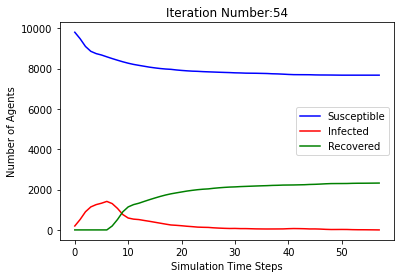

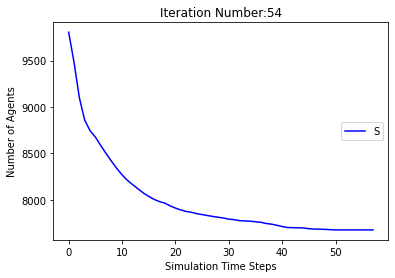

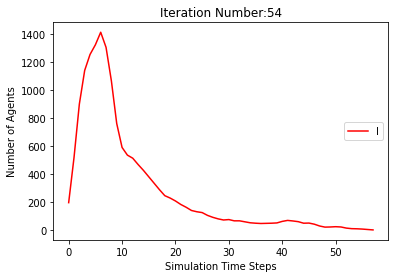

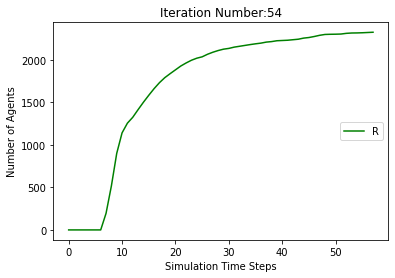

[9805, 9510, 9099, 8833, 8717, 8654, 8590, 8507, 8408, 8326, 8251, 8207, 8162, 8128, 8104, 8067, 8032, 7986, 7951, 7926, 7897, 7867, 7845, 7835, 7825, 7813, 7800, 7786, 7766, 7757, 7749, 7737, 7726, 7718, 7708, 7698, 7691, 7679, 7673, 7666, 7657, 7650, 7644, 7635, 7620, 7604, 7590, 7579, 7568, 7561, 7558, 7553, 7542, 7534, 7530, 7528, 7524, 7522, 7519, 7519, 7516, 7511, 7504, 7497, 7495, 7495, 7495, 7493, 7492, 7491, 7491, 7491, 7489, 7489, 7489, 7489, 7489, 7488, 7488, 7487, 7487, 7487, 7486, 7486, 7486, 7486, 7485, 7485, 7485, 7485, 7484, 7480, 7477, 7476, 7476, 7474, 7472, 7469, 7468, 7466, 7461, 7454, 7453, 7453, 7451, 7449, 7445, 7443, 7439, 7436, 7434, 7434, 7434, 7434, 7431, 7431, 7430, 7430, 7430, 7428, 7426, 7426, 7425, 7424, 7423, 7423, 7423, 7422, 7418, 7418, 7415, 7412, 7407, 7405, 7404, 7404, 7404, 7404, 7403, 7402, 7402, 7402, 7401, 7401, 7401, 7401, 7400, 7400, 7400, 7400, 7400, 7399, 7397, 7396, 7395, 7394, 7394, 7393, 7392, 7388, 7382, 7380, 7380, 7379, 7379, 7379, 737

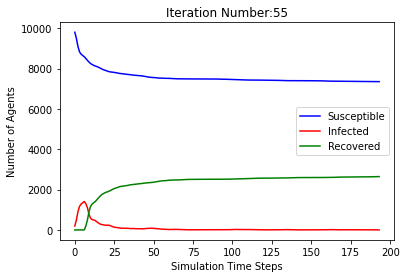

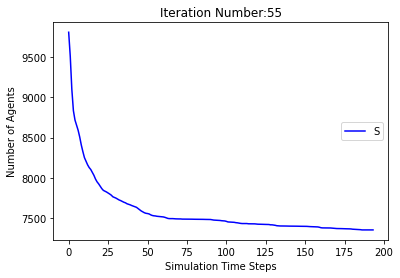

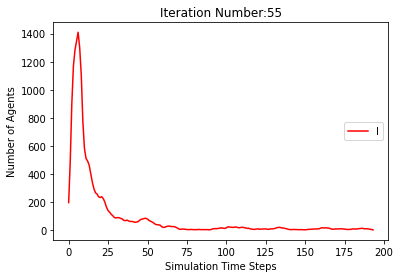

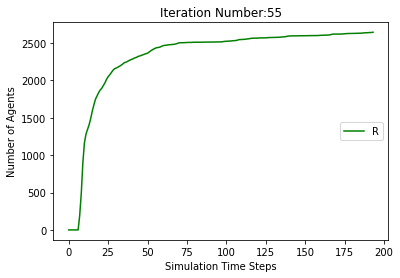

[9805, 9513, 9095, 8847, 8748, 8684, 8621, 8556, 8484, 8417, 8350, 8282, 8231, 8194, 8150, 8098, 8054, 7984, 7929, 7871, 7816, 7778, 7736, 7706, 7672, 7633, 7608, 7578, 7545, 7520, 7498, 7485, 7476, 7464, 7451, 7438, 7419, 7411, 7405, 7395, 7391, 7383, 7377, 7372, 7366, 7365, 7363, 7361, 7358, 7357, 7354, 7349, 7345, 7343, 7341, 7339, 7338, 7338, 7338, 7338, 7338, 7338, 7338, 7338]
[195, 487, 905, 1153, 1252, 1316, 1379, 1249, 1029, 678, 497, 466, 453, 427, 406, 386, 363, 366, 353, 360, 378, 372, 362, 348, 312, 296, 263, 238, 233, 216, 208, 187, 157, 144, 127, 107, 101, 87, 80, 81, 73, 68, 61, 47, 45, 40, 32, 30, 25, 20, 18, 17, 20, 20, 20, 19, 19, 16, 11, 7, 5, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 487, 905, 1153, 1252, 1316, 1379, 1444, 1516, 1583, 1650, 1718, 1769, 1806, 1850, 1902, 1946, 2016, 2071, 2129, 2184, 2222, 2264, 2294, 2328, 2367, 2392, 2422, 2455, 2480, 2502, 2515, 2524, 2536, 2549, 2562, 2581, 2589, 2595, 2605, 2609, 2617, 2623, 2628, 2634, 2635, 2637, 2639, 2642, 2643, 2

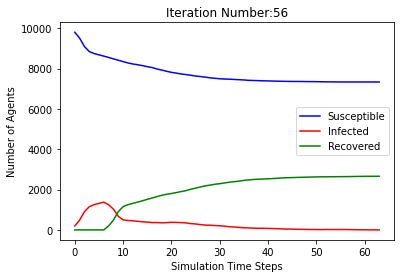

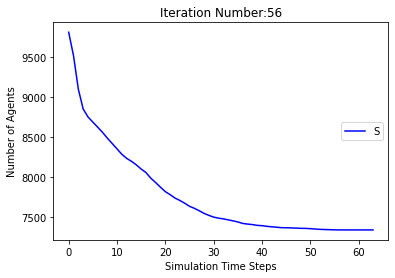

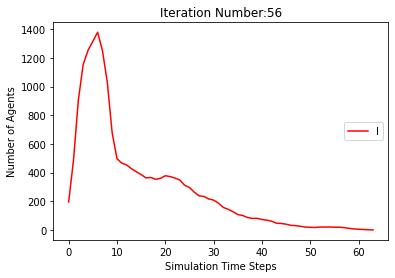

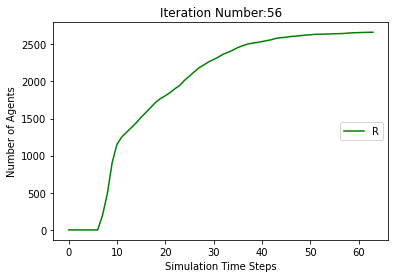

[9805, 9511, 9122, 8879, 8771, 8685, 8602, 8526, 8443, 8381, 8305, 8240, 8166, 8116, 8050, 7983, 7929, 7891, 7858, 7814, 7772, 7741, 7712, 7694, 7669, 7640, 7617, 7594, 7577, 7550, 7535, 7522, 7516, 7505, 7498, 7485, 7476, 7468, 7460, 7454, 7450, 7444, 7442, 7436, 7429, 7422, 7416, 7412, 7410, 7408, 7406, 7404, 7404, 7404, 7402, 7401, 7401, 7401, 7401, 7401, 7400, 7400, 7400, 7400, 7400, 7400, 7400, 7400]
[195, 489, 878, 1121, 1229, 1315, 1398, 1279, 1068, 741, 574, 531, 519, 486, 476, 460, 452, 414, 382, 352, 344, 309, 271, 235, 222, 218, 197, 178, 164, 162, 159, 147, 124, 112, 96, 92, 74, 67, 62, 62, 55, 54, 43, 40, 39, 38, 38, 38, 34, 34, 30, 25, 18, 12, 10, 9, 7, 5, 3, 3, 4, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 489, 878, 1121, 1229, 1315, 1398, 1474, 1557, 1619, 1695, 1760, 1834, 1884, 1950, 2017, 2071, 2109, 2142, 2186, 2228, 2259, 2288, 2306, 2331, 2360, 2383, 2406, 2423, 2450, 2465, 2478, 2484, 2495, 2502, 2515, 2524, 2532, 2540, 2546, 2550, 2556, 2558, 2564, 2571, 25

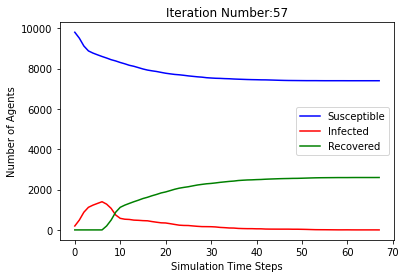

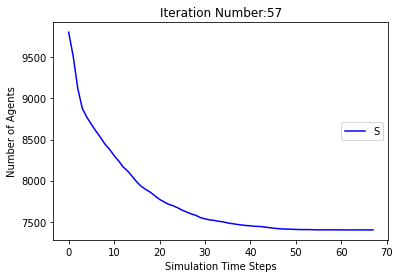

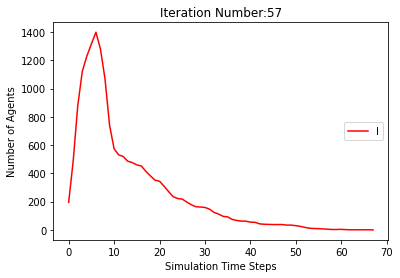

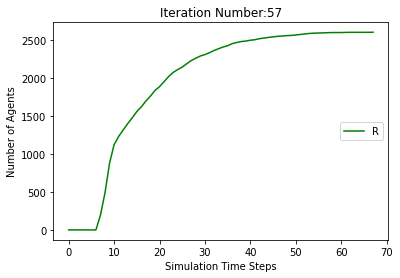

[9805, 9511, 9106, 8847, 8729, 8643, 8557, 8471, 8390, 8313, 8228, 8152, 8087, 8022, 7979, 7946, 7917, 7889, 7864, 7831, 7803, 7778, 7754, 7740, 7730, 7723, 7713, 7690, 7670, 7648, 7628, 7612, 7608, 7602, 7591, 7583, 7575, 7567, 7562, 7555, 7547, 7541, 7541, 7539, 7539, 7537, 7533, 7526, 7522, 7520, 7520, 7517, 7514, 7512, 7511, 7506, 7504, 7502, 7499, 7494, 7490, 7490, 7490, 7489, 7486, 7481, 7477, 7474, 7473, 7472, 7471, 7465, 7460, 7455, 7453, 7452, 7451, 7449, 7446, 7445, 7445, 7444, 7443, 7440, 7433, 7428, 7426, 7426, 7426, 7425, 7425, 7425, 7425, 7425, 7425, 7425, 7425]
[195, 489, 894, 1153, 1271, 1357, 1443, 1334, 1121, 793, 619, 577, 556, 535, 492, 444, 396, 339, 288, 256, 219, 201, 192, 177, 159, 141, 118, 113, 108, 106, 112, 118, 115, 111, 99, 87, 73, 61, 50, 53, 55, 50, 42, 36, 28, 25, 22, 21, 19, 21, 19, 22, 23, 21, 15, 16, 16, 18, 18, 20, 22, 21, 16, 15, 16, 18, 17, 16, 17, 18, 18, 21, 21, 22, 21, 21, 21, 22, 19, 15, 10, 9, 9, 11, 16, 18, 19, 19, 18, 18, 15, 8, 3, 1, 1, 1,

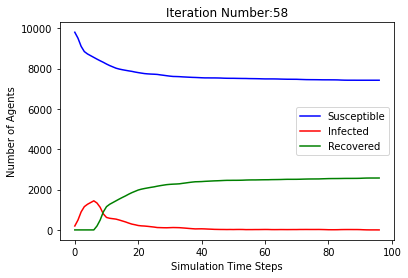

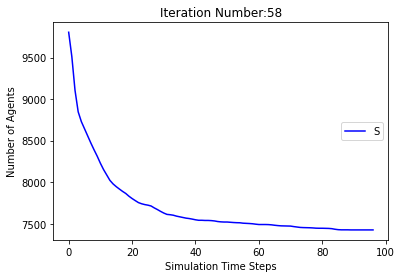

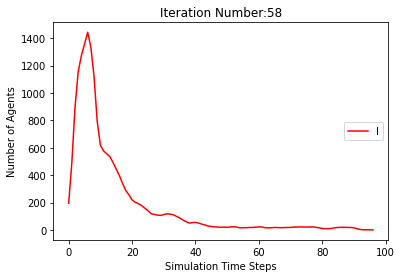

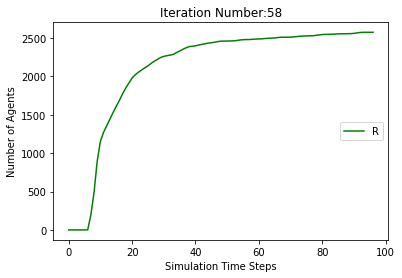

[9805, 9506, 9112, 8859, 8734, 8659, 8593, 8523, 8462, 8382, 8319, 8243, 8185, 8131, 8076, 8013, 7971, 7929, 7895, 7861, 7838, 7802, 7778, 7747, 7716, 7698, 7680, 7667, 7654, 7642, 7630, 7626, 7618, 7605, 7596, 7589, 7583, 7577, 7574, 7570, 7569, 7565, 7558, 7548, 7542, 7537, 7535, 7534, 7531, 7527, 7523, 7519, 7518, 7517, 7516, 7516, 7516, 7515, 7514, 7514, 7514, 7513, 7512, 7511, 7511, 7509, 7508, 7506, 7505, 7504, 7503, 7501, 7500, 7500, 7500, 7500, 7500, 7499, 7499, 7499, 7499, 7499, 7498, 7496, 7495, 7494, 7494, 7493, 7491, 7491, 7491, 7490, 7490, 7490, 7490, 7490, 7490, 7489, 7489, 7489, 7489, 7488, 7488, 7488, 7488, 7488, 7487, 7487, 7486, 7486, 7486, 7486, 7486, 7486, 7486, 7485, 7484, 7484, 7484, 7484, 7484, 7482, 7480, 7479, 7478, 7478, 7477, 7474, 7473, 7466, 7464, 7464, 7464, 7464, 7463, 7463, 7462, 7460, 7460, 7460, 7460, 7460, 7460, 7458, 7456, 7452, 7450, 7449, 7448, 7448, 7448, 7448, 7448, 7448, 7448, 7447, 7447, 7444, 7442, 7441, 7440, 7439, 7439, 7438, 7437, 7434, 743

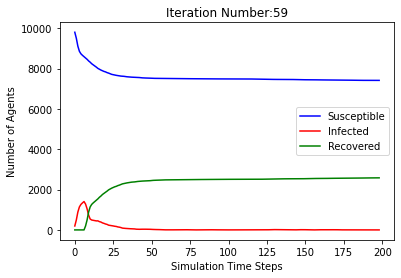

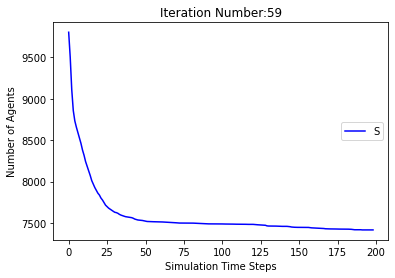

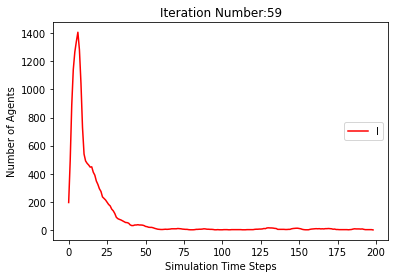

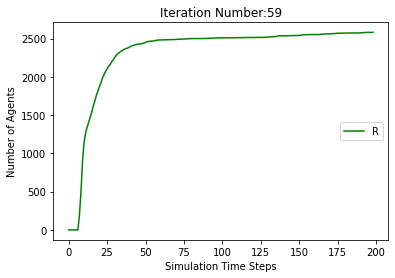

[9805, 9528, 9157, 8907, 8769, 8701, 8615, 8531, 8446, 8355, 8262, 8189, 8137, 8076, 8011, 7959, 7903, 7850, 7791, 7755, 7729, 7699, 7661, 7627, 7602, 7574, 7555, 7542, 7522, 7513, 7504, 7495, 7490, 7487, 7482, 7480, 7477, 7477, 7476, 7473, 7472, 7472, 7470, 7469, 7465, 7460, 7452, 7451, 7449, 7448, 7444, 7442, 7442, 7442, 7442, 7441, 7440, 7437, 7437, 7437, 7437, 7437, 7436, 7436, 7435, 7435, 7434, 7434, 7433, 7432, 7431, 7431, 7431, 7431, 7431, 7431, 7431, 7430, 7429, 7429, 7428, 7427, 7427, 7427, 7426, 7426, 7426, 7426, 7426, 7426, 7426, 7425, 7425, 7425, 7425, 7425, 7424, 7424, 7423, 7423, 7423, 7423, 7423, 7422, 7421, 7419, 7417, 7417, 7417, 7416, 7416, 7416, 7416, 7416, 7416, 7416, 7416]
[195, 472, 843, 1093, 1231, 1299, 1385, 1274, 1082, 802, 645, 580, 564, 539, 520, 487, 452, 412, 398, 382, 347, 312, 298, 276, 248, 217, 200, 187, 177, 148, 123, 107, 84, 68, 60, 42, 36, 27, 19, 17, 15, 10, 10, 8, 12, 16, 21, 21, 23, 22, 25, 23, 18, 10, 9, 8, 8, 7, 5, 5, 5, 5, 5, 4, 2, 2, 3, 3, 4

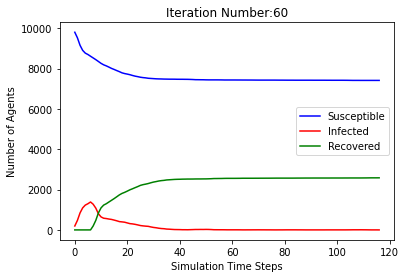

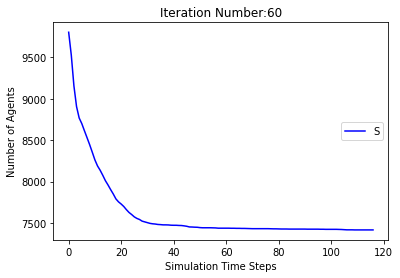

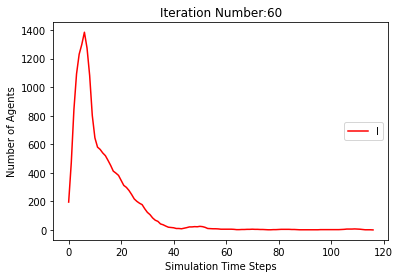

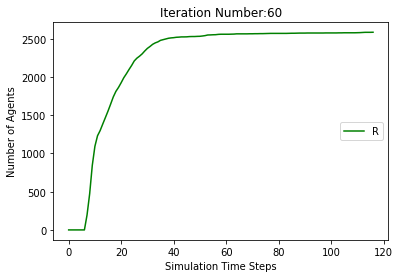

[9805, 9527, 9137, 8871, 8748, 8671, 8578, 8478, 8375, 8283, 8208, 8136, 8071, 8003, 7929, 7855, 7790, 7735, 7679, 7647, 7622, 7602, 7575, 7535, 7494, 7456, 7440, 7430, 7420, 7412, 7403, 7392, 7384, 7372, 7357, 7345, 7331, 7325, 7321, 7317, 7312, 7308, 7307, 7305, 7305, 7304, 7304, 7304, 7304, 7303, 7302, 7302, 7301, 7301, 7300, 7300, 7300, 7299, 7299, 7298, 7298, 7298, 7298, 7298, 7298, 7298, 7298]
[195, 473, 863, 1129, 1252, 1329, 1422, 1327, 1152, 854, 663, 612, 600, 575, 549, 520, 493, 473, 457, 424, 381, 327, 280, 255, 241, 223, 207, 192, 182, 163, 132, 102, 72, 68, 73, 75, 81, 78, 71, 67, 60, 49, 38, 26, 20, 17, 13, 8, 4, 4, 3, 3, 3, 3, 4, 4, 3, 3, 3, 3, 3, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 473, 863, 1129, 1252, 1329, 1422, 1522, 1625, 1717, 1792, 1864, 1929, 1997, 2071, 2145, 2210, 2265, 2321, 2353, 2378, 2398, 2425, 2465, 2506, 2544, 2560, 2570, 2580, 2588, 2597, 2608, 2616, 2628, 2643, 2655, 2669, 2675, 2679, 2683, 2688, 2692, 2693, 2695, 2695, 2696, 2696, 2696, 269

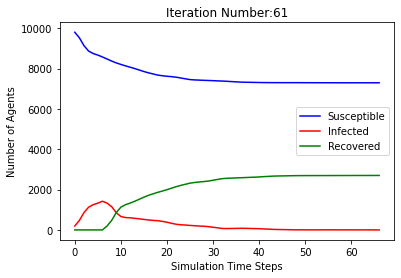

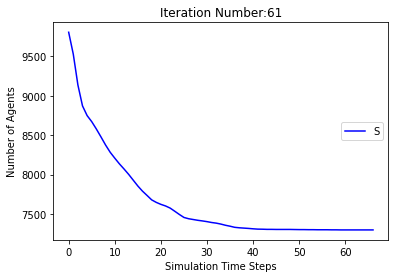

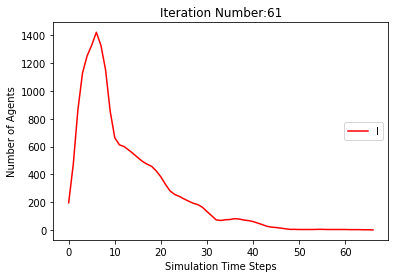

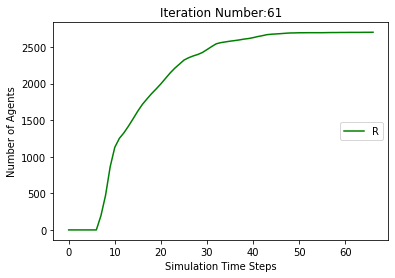

[9805, 9499, 9114, 8857, 8717, 8632, 8553, 8487, 8415, 8345, 8274, 8202, 8135, 8066, 8015, 7966, 7937, 7910, 7873, 7841, 7819, 7801, 7780, 7768, 7746, 7730, 7714, 7690, 7679, 7670, 7657, 7643, 7631, 7613, 7600, 7587, 7575, 7563, 7554, 7549, 7538, 7530, 7523, 7518, 7518, 7516, 7512, 7508, 7501, 7496, 7494, 7491, 7490, 7490, 7490, 7487, 7484, 7481, 7478, 7474, 7469, 7465, 7462, 7456, 7454, 7454, 7454, 7454, 7453, 7453, 7453, 7453, 7453, 7452, 7450, 7448, 7443, 7442, 7442, 7441, 7440, 7440, 7435, 7433, 7430, 7428, 7424, 7424, 7424, 7423, 7420, 7418, 7418, 7417, 7417, 7417, 7417, 7416, 7416, 7416, 7415, 7413, 7413, 7413, 7413, 7413, 7413, 7413, 7413]
[195, 501, 886, 1143, 1283, 1368, 1447, 1318, 1084, 769, 583, 515, 497, 487, 472, 449, 408, 364, 329, 294, 247, 214, 186, 169, 164, 143, 127, 129, 122, 110, 111, 103, 99, 101, 90, 92, 95, 94, 89, 82, 75, 70, 64, 57, 45, 38, 37, 30, 29, 27, 24, 27, 26, 22, 18, 14, 12, 13, 13, 16, 21, 25, 25, 28, 27, 24, 20, 15, 12, 9, 3, 1, 1, 2, 4, 5, 10, 11, 

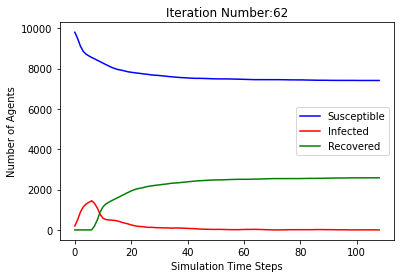

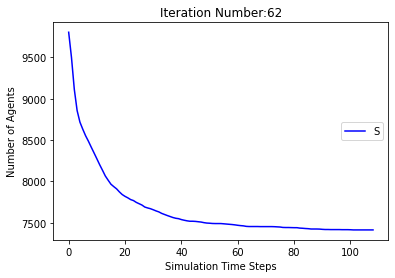

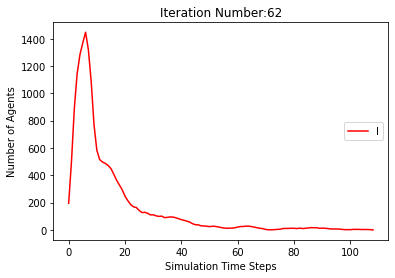

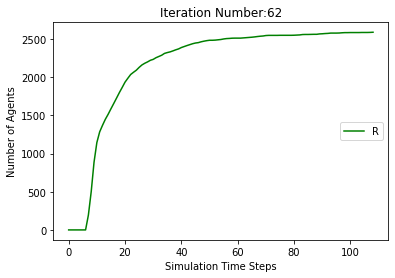

[9805, 9522, 9135, 8863, 8729, 8646, 8593, 8539, 8475, 8414, 8333, 8277, 8218, 8172, 8119, 8060, 8006, 7975, 7943, 7905, 7877, 7854, 7822, 7792, 7763, 7738, 7724, 7709, 7697, 7678, 7658, 7644, 7633, 7627, 7621, 7619, 7617, 7609, 7602, 7596, 7591, 7585, 7581, 7577, 7573, 7573, 7572, 7571, 7567, 7561, 7557, 7553, 7550, 7550, 7550, 7549, 7546, 7542, 7536, 7532, 7530, 7529, 7528, 7527, 7526, 7526, 7526, 7526, 7526, 7526, 7525, 7525, 7525, 7524, 7523, 7522, 7522, 7522, 7521, 7518, 7515, 7514, 7514, 7513, 7513, 7512, 7511, 7510, 7509, 7509, 7508, 7508, 7508, 7508, 7507, 7507, 7506, 7505, 7503, 7501, 7501, 7498, 7498, 7498, 7497, 7497, 7497, 7496, 7495, 7495, 7495, 7495, 7495, 7495, 7494, 7493, 7491, 7488, 7483, 7478, 7472, 7469, 7468, 7467, 7465, 7462, 7457, 7452, 7450, 7449, 7446, 7443, 7439, 7436, 7436, 7436, 7435, 7432, 7429, 7421, 7419, 7419, 7418, 7418, 7416, 7413, 7409, 7404, 7400, 7398, 7396, 7394, 7390, 7390, 7386, 7386, 7386, 7385, 7385, 7385, 7385, 7385, 7384, 7384, 7384, 7382, 737

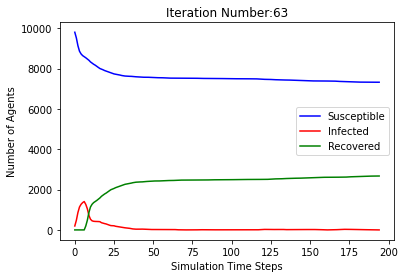

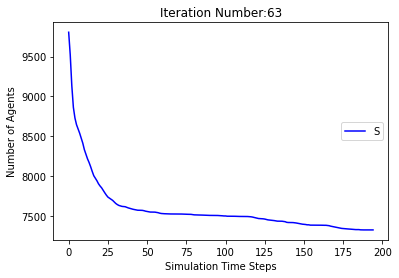

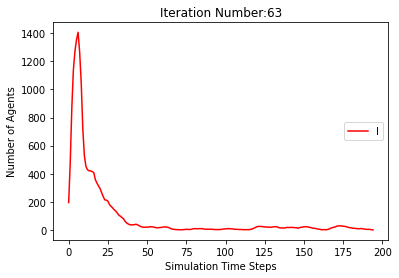

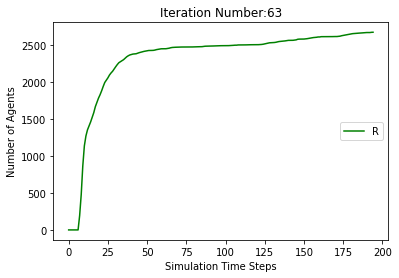

[9805, 9487, 9085, 8835, 8730, 8647, 8562, 8467, 8394, 8302, 8234, 8154, 8091, 8047, 8009, 7977, 7948, 7917, 7878, 7853, 7836, 7814, 7793, 7781, 7775, 7764, 7750, 7739, 7724, 7714, 7695, 7683, 7671, 7658, 7645, 7634, 7626, 7621, 7618, 7616, 7609, 7603, 7598, 7589, 7581, 7576, 7575, 7575, 7574, 7573, 7567, 7563, 7555, 7550, 7547, 7547, 7547, 7547, 7546, 7544, 7537, 7531, 7528, 7527, 7527, 7525, 7520, 7513, 7503, 7496, 7492, 7489, 7487, 7482, 7480, 7479, 7478, 7476, 7476, 7476, 7476, 7474, 7470, 7468, 7467, 7465, 7463, 7459, 7457, 7457, 7457, 7457, 7457, 7457, 7457, 7456, 7455, 7454, 7454, 7454, 7453, 7450, 7447, 7446, 7445, 7445, 7443, 7440, 7434, 7432, 7428, 7425, 7424, 7424, 7424, 7421, 7417, 7409, 7406, 7404, 7400, 7394, 7392, 7390, 7387, 7387, 7387, 7387, 7386, 7384, 7381, 7380, 7378, 7377, 7374, 7372, 7371, 7369, 7368, 7366, 7364, 7362, 7358, 7354, 7352, 7350, 7347, 7344, 7343, 7343, 7342, 7342, 7342, 7341, 7337, 7333, 7332, 7331, 7330, 7328, 7324, 7321, 7318, 7317, 7315, 7310, 730

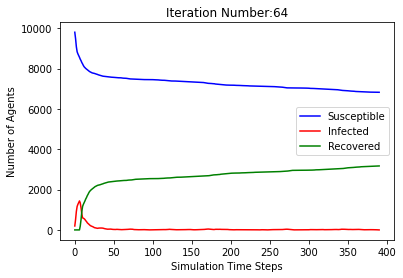

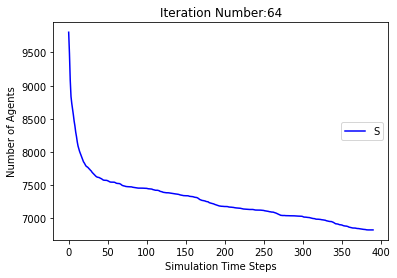

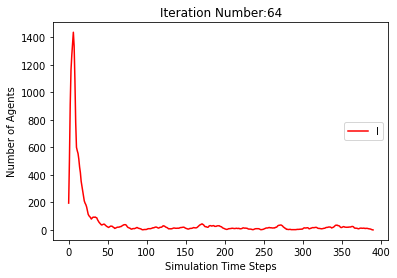

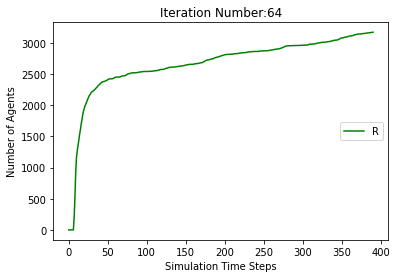

[9805, 9500, 9107, 8848, 8725, 8648, 8567, 8495, 8420, 8347, 8285, 8211, 8155, 8126, 8082, 8052, 8032, 8006, 7980, 7951, 7926, 7911, 7891, 7884, 7872, 7855, 7846, 7837, 7826, 7816, 7809, 7801, 7796, 7791, 7786, 7783, 7782, 7779, 7776, 7775, 7774, 7774, 7774, 7774, 7773, 7773, 7773, 7773, 7773, 7773, 7773, 7773]
[195, 500, 893, 1152, 1275, 1352, 1433, 1310, 1080, 760, 563, 514, 493, 441, 413, 368, 315, 279, 231, 204, 200, 171, 161, 148, 134, 125, 105, 89, 85, 75, 75, 71, 59, 55, 51, 43, 34, 30, 25, 21, 17, 12, 9, 8, 6, 3, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 500, 893, 1152, 1275, 1352, 1433, 1505, 1580, 1653, 1715, 1789, 1845, 1874, 1918, 1948, 1968, 1994, 2020, 2049, 2074, 2089, 2109, 2116, 2128, 2145, 2154, 2163, 2174, 2184, 2191, 2199, 2204, 2209, 2214, 2217, 2218, 2221, 2224, 2225, 2226, 2226, 2226, 2226, 2227]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351, 8276, 8208, 8161, 8117, 8074, 8030, 7992, 7959, 7927, 7892, 7860, 7837, 7819, 7802, 7787, 7776, 7762

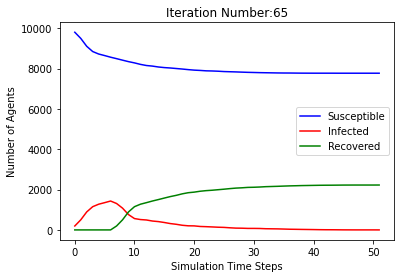

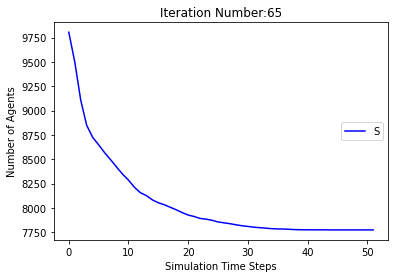

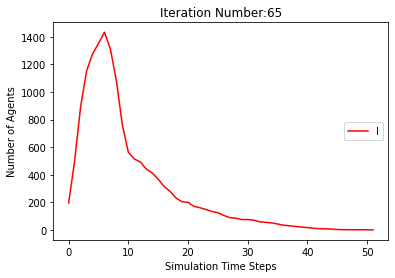

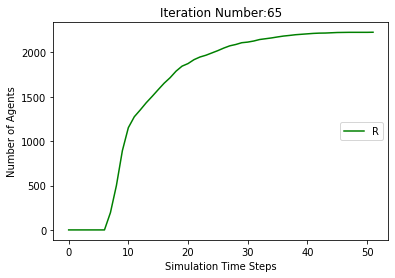

[9805, 9523, 9130, 8879, 8750, 8681, 8626, 8552, 8453, 8355, 8256, 8166, 8109, 8043, 7970, 7908, 7861, 7810, 7772, 7733, 7694, 7661, 7628, 7601, 7582, 7564, 7545, 7530, 7512, 7496, 7481, 7465, 7454, 7446, 7442, 7435, 7420, 7412, 7407, 7402, 7396, 7387, 7379, 7374, 7368, 7360, 7356, 7348, 7344, 7342, 7342, 7341, 7339, 7337, 7336, 7331, 7328, 7325, 7324, 7323, 7319, 7317, 7316, 7312, 7308, 7307, 7307, 7306, 7306, 7306, 7306, 7306, 7305, 7304, 7304, 7304, 7304, 7304, 7304, 7303, 7303, 7302, 7302, 7302, 7302, 7302, 7302, 7302, 7302]
[195, 477, 870, 1121, 1250, 1319, 1374, 1253, 1070, 775, 623, 584, 572, 583, 582, 545, 494, 446, 394, 376, 349, 309, 280, 260, 228, 208, 188, 164, 149, 132, 120, 117, 110, 99, 88, 77, 76, 69, 58, 52, 50, 55, 56, 46, 44, 47, 46, 48, 43, 37, 32, 27, 21, 19, 12, 13, 14, 17, 17, 16, 18, 19, 15, 16, 17, 17, 16, 13, 11, 10, 6, 2, 2, 3, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 477, 870, 1121, 1250, 1319, 1374, 1448, 1547, 1645, 1744, 183

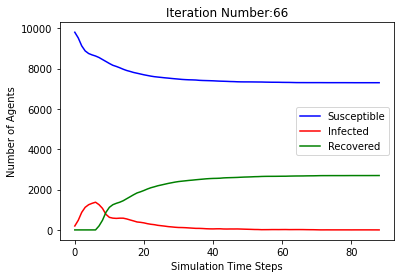

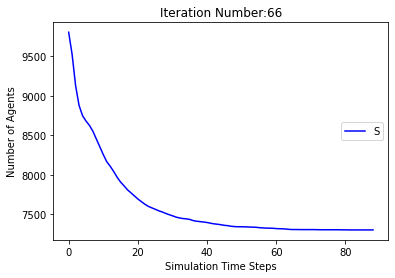

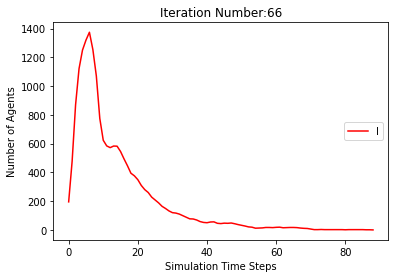

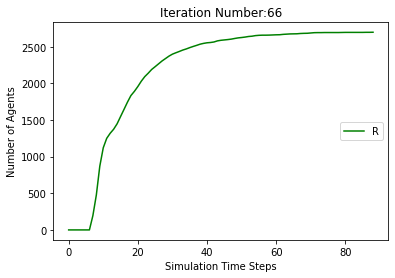

[9805, 9464, 9065, 8838, 8745, 8689, 8627, 8559, 8481, 8411, 8341, 8271, 8204, 8155, 8112, 8064, 8022, 7997, 7968, 7929, 7897, 7877, 7853, 7834, 7813, 7790, 7770, 7757, 7745, 7734, 7720, 7701, 7684, 7660, 7647, 7635, 7622, 7616, 7610, 7603, 7600, 7598, 7597, 7597, 7595, 7593, 7592, 7591, 7591, 7591, 7589, 7588, 7586, 7586, 7586, 7586, 7586, 7586, 7586, 7586]
[195, 536, 935, 1162, 1255, 1311, 1373, 1246, 983, 654, 497, 474, 485, 472, 447, 417, 389, 344, 303, 275, 258, 235, 211, 188, 184, 178, 159, 140, 132, 119, 114, 112, 106, 110, 110, 110, 112, 104, 91, 81, 60, 49, 38, 25, 21, 17, 11, 9, 7, 6, 8, 7, 7, 6, 5, 5, 5, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 536, 935, 1162, 1255, 1311, 1373, 1441, 1519, 1589, 1659, 1729, 1796, 1845, 1888, 1936, 1978, 2003, 2032, 2071, 2103, 2123, 2147, 2166, 2187, 2210, 2230, 2243, 2255, 2266, 2280, 2299, 2316, 2340, 2353, 2365, 2378, 2384, 2390, 2397, 2400, 2402, 2403, 2403, 2405, 2407, 2408, 2409, 2409, 2409, 2411, 2412, 2414]
[[], [9805, 9522, 9125, 8861, 8

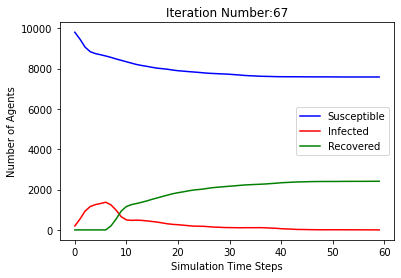

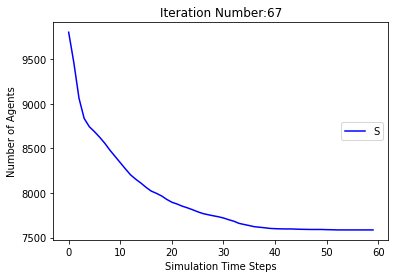

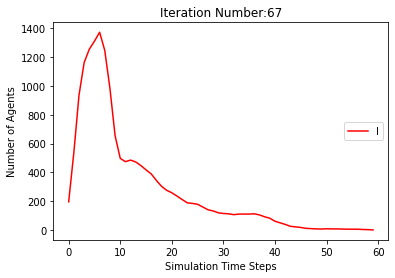

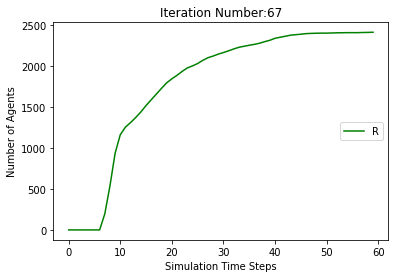

[9805, 9500, 9108, 8852, 8732, 8644, 8559, 8456, 8351, 8254, 8159, 8091, 8043, 7999, 7967, 7953, 7932, 7906, 7882, 7855, 7827, 7799, 7782, 7763, 7736, 7711, 7695, 7691, 7688, 7684, 7678, 7672, 7663, 7653, 7644, 7643, 7640, 7639, 7638, 7637, 7637, 7636, 7634, 7630, 7628, 7627, 7626, 7626, 7626, 7626, 7626, 7626, 7623, 7622, 7617, 7615, 7615, 7614, 7614, 7613, 7613, 7612, 7610, 7607, 7601, 7597, 7596, 7592, 7590, 7585, 7583, 7580, 7576, 7576, 7576, 7576, 7575, 7575, 7575, 7575, 7573, 7572, 7571, 7571, 7571, 7570, 7568, 7567, 7565, 7563, 7562, 7561, 7560, 7560, 7559, 7558, 7556, 7555, 7554, 7552, 7551, 7550, 7550, 7550, 7549, 7548, 7547, 7546, 7544, 7541, 7539, 7536, 7533, 7530, 7526, 7524, 7524, 7523, 7523, 7523, 7523, 7523, 7522, 7522, 7522, 7522, 7522, 7520, 7520, 7519, 7519, 7519, 7518, 7516, 7513, 7510, 7510, 7510, 7509, 7508, 7508, 7506, 7504, 7502, 7502, 7501, 7499, 7498, 7497, 7497, 7497, 7497, 7495, 7495, 7495, 7495, 7494, 7492, 7487, 7485, 7483, 7483, 7482, 7480, 7477, 7476, 747

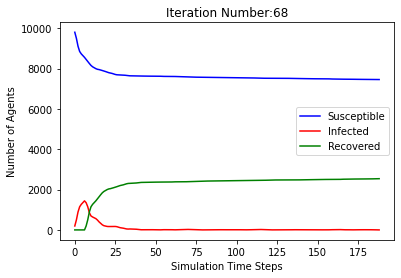

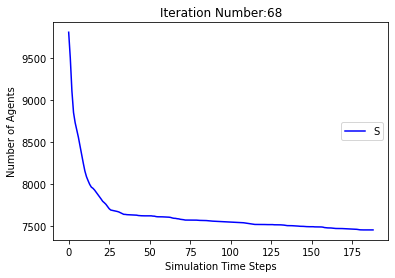

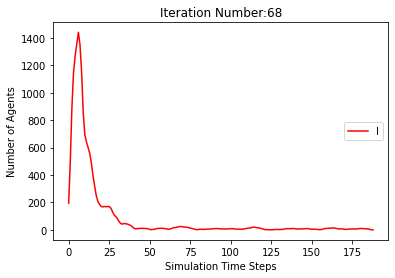

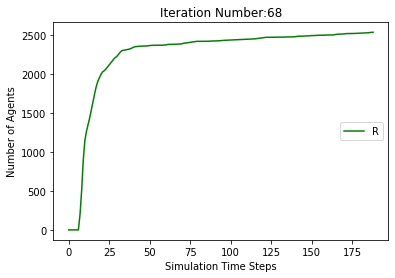

[9805, 9499, 9121, 8866, 8744, 8655, 8590, 8524, 8452, 8372, 8296, 8219, 8129, 8057, 7997, 7938, 7877, 7827, 7791, 7759, 7728, 7702, 7673, 7650, 7629, 7607, 7589, 7569, 7553, 7534, 7524, 7513, 7501, 7492, 7475, 7463, 7450, 7438, 7430, 7421, 7411, 7400, 7394, 7386, 7381, 7374, 7365, 7359, 7351, 7342, 7338, 7332, 7329, 7326, 7323, 7318, 7315, 7313, 7312, 7312, 7311, 7311, 7310, 7310, 7309, 7309, 7308, 7308, 7308, 7308, 7308, 7308, 7308, 7307, 7307, 7307, 7307, 7307, 7307, 7307, 7306, 7304, 7304, 7304, 7303, 7302, 7301, 7301, 7301, 7301, 7301, 7301, 7301, 7300, 7300, 7300, 7300, 7300, 7299, 7299, 7299, 7299, 7299, 7299, 7299, 7297, 7297, 7297, 7297, 7296, 7296, 7296, 7296, 7296, 7295, 7294, 7291, 7291, 7291, 7290, 7289, 7288, 7287, 7285, 7284, 7283, 7283, 7282, 7279, 7275, 7274, 7273, 7272, 7269, 7268, 7267, 7263, 7258, 7254, 7246, 7244, 7239, 7239, 7236, 7235, 7234, 7232, 7228, 7226, 7225, 7222, 7217, 7212, 7209, 7207, 7205, 7202, 7197, 7196, 7192, 7187, 7185, 7183, 7180, 7179, 7178, 717

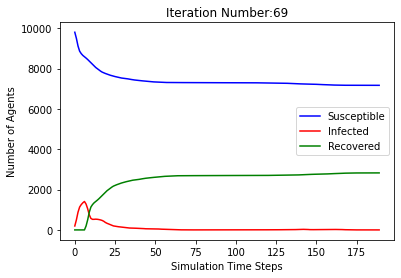

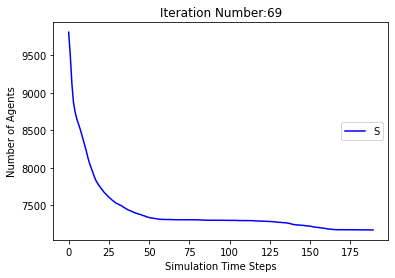

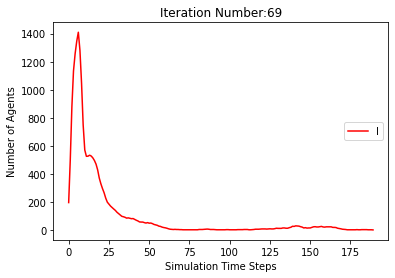

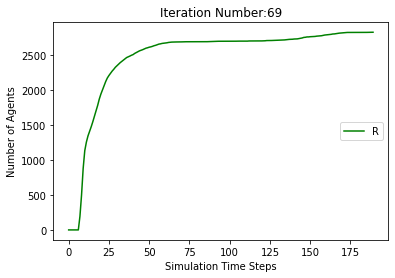

[9805, 9490, 9071, 8823, 8706, 8629, 8558, 8469, 8403, 8316, 8220, 8131, 8061, 8002, 7955, 7923, 7886, 7849, 7823, 7795, 7759, 7730, 7708, 7695, 7689, 7683, 7678, 7670, 7662, 7654, 7651, 7650, 7646, 7640, 7637, 7632, 7629, 7628, 7627, 7627, 7624, 7618, 7616, 7615, 7614, 7612, 7610, 7609, 7609, 7608, 7605, 7604, 7604, 7604, 7604, 7604, 7604, 7603, 7603, 7602, 7602, 7602, 7602, 7602, 7602, 7602, 7602]
[195, 510, 929, 1177, 1294, 1371, 1442, 1336, 1087, 755, 603, 575, 568, 556, 514, 480, 430, 371, 308, 266, 243, 225, 215, 191, 160, 140, 117, 89, 68, 54, 44, 39, 37, 38, 33, 30, 25, 23, 23, 19, 16, 19, 16, 14, 14, 15, 17, 15, 9, 8, 10, 10, 8, 6, 5, 5, 4, 2, 1, 2, 2, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 510, 929, 1177, 1294, 1371, 1442, 1531, 1597, 1684, 1780, 1869, 1939, 1998, 2045, 2077, 2114, 2151, 2177, 2205, 2241, 2270, 2292, 2305, 2311, 2317, 2322, 2330, 2338, 2346, 2349, 2350, 2354, 2360, 2363, 2368, 2371, 2372, 2373, 2373, 2376, 2382, 2384, 2385, 2386, 2388, 2390, 2391, 2391,

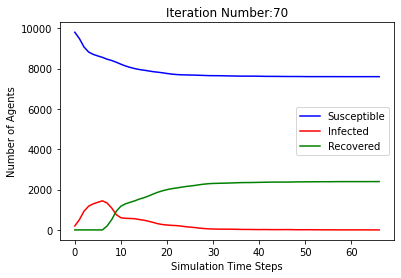

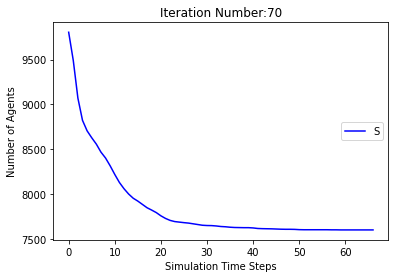

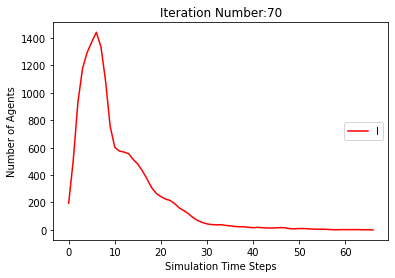

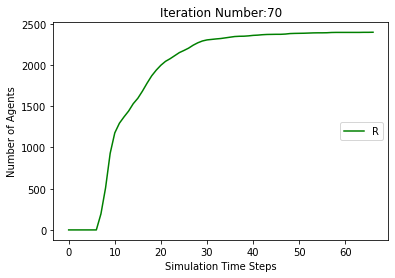

[9805, 9503, 9109, 8864, 8748, 8672, 8613, 8540, 8468, 8368, 8282, 8199, 8125, 8070, 8018, 7961, 7902, 7865, 7826, 7790, 7744, 7716, 7685, 7670, 7648, 7624, 7599, 7583, 7569, 7556, 7544, 7539, 7536, 7529, 7526, 7520, 7516, 7511, 7507, 7505, 7502, 7502, 7502, 7502, 7502, 7502, 7502, 7502]
[195, 497, 891, 1136, 1252, 1328, 1387, 1265, 1035, 741, 582, 549, 547, 543, 522, 507, 466, 417, 373, 335, 326, 302, 276, 232, 217, 202, 191, 161, 147, 129, 126, 109, 88, 70, 57, 49, 40, 33, 32, 31, 27, 24, 18, 14, 9, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 497, 891, 1136, 1252, 1328, 1387, 1460, 1532, 1632, 1718, 1801, 1875, 1930, 1982, 2039, 2098, 2135, 2174, 2210, 2256, 2284, 2315, 2330, 2352, 2376, 2401, 2417, 2431, 2444, 2456, 2461, 2464, 2471, 2474, 2480, 2484, 2489, 2493, 2495, 2498]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351, 8276, 8208, 8161, 8117, 8074, 8030, 7992, 7959, 7927, 7892, 7860, 7837, 7819, 7802, 7787, 7776, 7762, 7748, 7737, 7729, 7719, 7710, 7703, 7699, 7696, 769

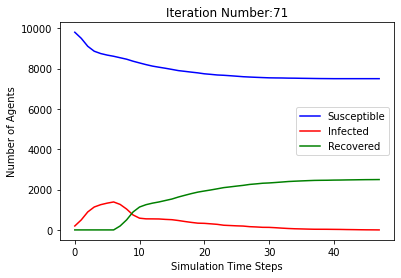

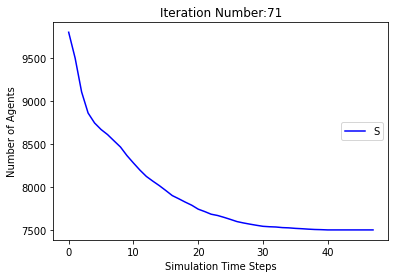

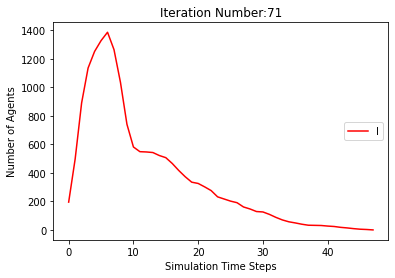

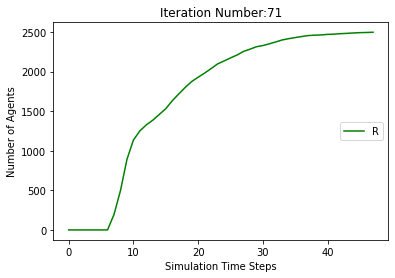

[9805, 9495, 9088, 8812, 8706, 8632, 8563, 8494, 8420, 8340, 8251, 8178, 8121, 8082, 8050, 8026, 8003, 7987, 7960, 7931, 7908, 7890, 7875, 7861, 7846, 7829, 7817, 7805, 7786, 7774, 7762, 7757, 7750, 7744, 7737, 7731, 7722, 7706, 7700, 7697, 7694, 7684, 7679, 7674, 7671, 7671, 7666, 7658, 7655, 7651, 7646, 7643, 7643, 7643, 7641, 7638, 7631, 7629, 7629, 7629, 7629, 7629, 7628, 7628, 7628, 7628, 7628, 7628, 7628, 7625, 7623, 7622, 7619, 7615, 7610, 7608, 7607, 7607, 7607, 7606, 7606, 7605, 7605, 7604, 7603, 7601, 7599, 7599, 7599, 7599, 7599, 7598, 7597, 7597, 7597, 7597, 7597, 7595, 7594, 7594, 7593, 7593, 7592, 7592, 7591, 7591, 7591, 7591, 7591, 7591, 7591, 7591]
[195, 505, 912, 1188, 1294, 1368, 1437, 1311, 1075, 748, 561, 528, 511, 481, 444, 394, 337, 264, 218, 190, 174, 160, 151, 142, 141, 131, 114, 103, 104, 101, 99, 89, 79, 73, 68, 55, 52, 56, 57, 53, 50, 53, 52, 48, 35, 29, 31, 36, 29, 28, 28, 28, 28, 23, 17, 17, 20, 17, 14, 14, 14, 12, 10, 3, 1, 1, 1, 1, 1, 3, 5, 6, 9, 13, 18, 

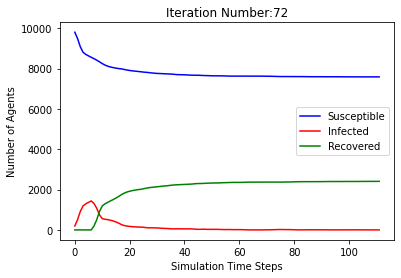

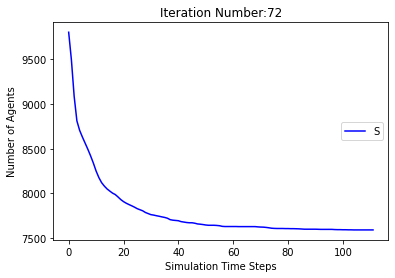

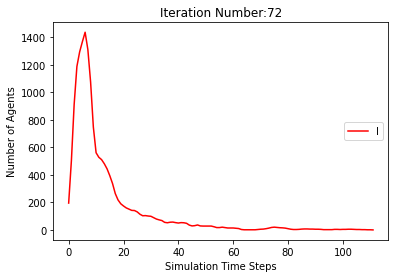

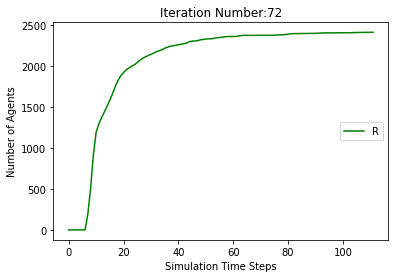

[9805, 9474, 9090, 8847, 8747, 8663, 8574, 8502, 8428, 8342, 8254, 8191, 8142, 8099, 8045, 7995, 7957, 7927, 7897, 7865, 7835, 7806, 7794, 7774, 7760, 7747, 7730, 7721, 7712, 7703, 7696, 7689, 7676, 7658, 7650, 7638, 7627, 7618, 7609, 7603, 7597, 7590, 7585, 7581, 7575, 7566, 7560, 7553, 7545, 7537, 7528, 7520, 7516, 7514, 7511, 7510, 7508, 7504, 7502, 7500, 7498, 7496, 7493, 7493, 7493, 7493, 7492, 7492, 7491, 7490, 7489, 7489, 7489, 7489, 7489, 7488, 7487, 7487, 7487, 7487, 7486, 7486, 7486, 7485, 7485, 7485, 7485, 7484, 7483, 7481, 7478, 7476, 7476, 7476, 7476, 7476, 7476, 7476, 7476]
[195, 526, 910, 1153, 1253, 1337, 1426, 1303, 1046, 748, 593, 556, 521, 475, 457, 433, 385, 327, 294, 277, 264, 239, 201, 183, 167, 150, 135, 114, 94, 91, 78, 71, 71, 72, 71, 74, 76, 78, 80, 73, 61, 60, 53, 46, 43, 43, 43, 44, 45, 48, 53, 55, 50, 46, 42, 35, 29, 24, 18, 16, 16, 15, 17, 15, 11, 9, 8, 6, 5, 3, 4, 4, 4, 3, 3, 3, 3, 2, 2, 2, 3, 3, 2, 2, 2, 2, 2, 2, 3, 5, 7, 9, 9, 9, 8, 7, 5, 2, 0]
[0, 0, 0

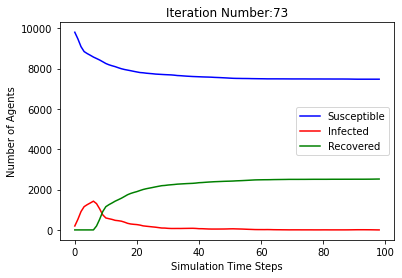

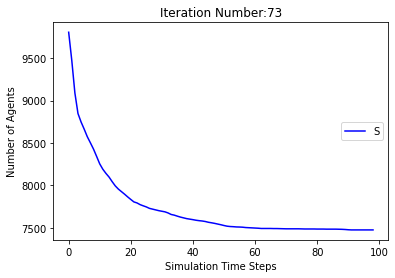

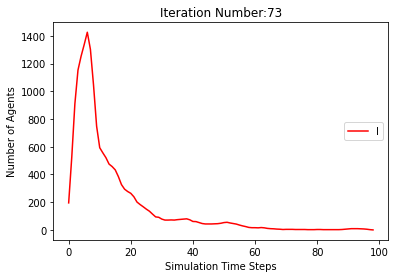

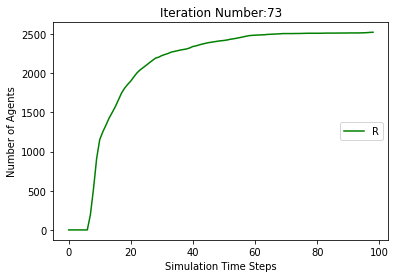

[9805, 9517, 9116, 8826, 8706, 8627, 8549, 8490, 8414, 8337, 8267, 8200, 8152, 8098, 8058, 8023, 7999, 7985, 7962, 7941, 7927, 7908, 7891, 7871, 7864, 7857, 7845, 7828, 7816, 7803, 7790, 7784, 7775, 7769, 7767, 7763, 7761, 7759, 7757, 7756, 7756, 7754, 7753, 7750, 7750, 7750, 7750, 7749, 7746, 7744, 7743, 7742, 7740, 7738, 7734, 7731, 7731, 7730, 7729, 7729, 7729, 7728, 7727, 7726, 7726, 7725, 7722, 7715, 7711, 7709, 7707, 7707, 7707, 7706, 7702, 7701, 7701, 7701, 7700, 7700, 7698, 7698, 7698, 7698, 7696, 7695, 7693, 7689, 7688, 7686, 7682, 7681, 7677, 7676, 7676, 7676, 7676, 7676, 7676, 7675, 7675, 7675, 7675, 7675, 7675, 7675, 7675]
[195, 483, 884, 1174, 1294, 1373, 1451, 1315, 1103, 779, 559, 506, 475, 451, 432, 391, 338, 282, 238, 211, 171, 150, 132, 128, 121, 105, 96, 99, 92, 88, 81, 80, 82, 76, 61, 53, 42, 31, 27, 19, 13, 13, 10, 11, 9, 7, 6, 7, 8, 9, 7, 8, 10, 12, 15, 15, 13, 13, 13, 11, 9, 6, 4, 5, 4, 4, 7, 14, 17, 18, 19, 19, 18, 16, 13, 10, 8, 6, 7, 7, 8, 4, 3, 3, 5, 5, 7, 9,

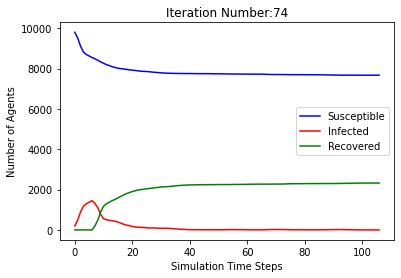

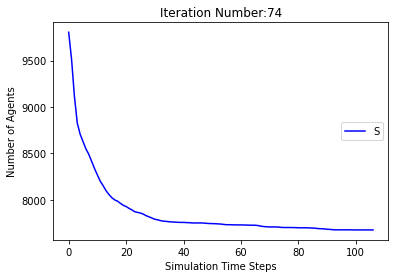

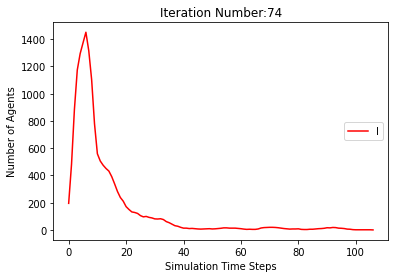

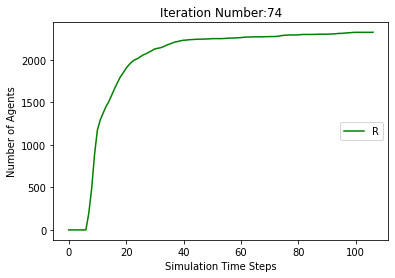

[9805, 9502, 9106, 8825, 8693, 8592, 8498, 8411, 8323, 8233, 8157, 8092, 8031, 7994, 7941, 7896, 7840, 7808, 7772, 7731, 7691, 7660, 7635, 7603, 7576, 7550, 7531, 7522, 7514, 7508, 7498, 7491, 7485, 7475, 7469, 7462, 7461, 7459, 7453, 7447, 7444, 7442, 7439, 7439, 7439, 7438, 7435, 7431, 7427, 7425, 7425, 7425, 7425, 7425, 7424, 7423, 7420, 7419, 7419, 7419, 7417, 7416, 7416, 7416, 7416, 7416, 7415, 7415, 7414, 7414, 7414, 7414, 7414, 7414, 7414, 7414]
[195, 498, 894, 1175, 1307, 1408, 1502, 1394, 1179, 873, 668, 601, 561, 504, 470, 427, 393, 349, 320, 300, 303, 281, 261, 237, 232, 222, 200, 169, 146, 127, 105, 85, 65, 56, 53, 52, 47, 39, 38, 38, 31, 27, 23, 22, 20, 15, 12, 13, 15, 14, 14, 14, 13, 10, 7, 4, 5, 6, 6, 6, 8, 8, 7, 4, 3, 3, 4, 2, 2, 2, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 498, 894, 1175, 1307, 1408, 1502, 1589, 1677, 1767, 1843, 1908, 1969, 2006, 2059, 2104, 2160, 2192, 2228, 2269, 2309, 2340, 2365, 2397, 2424, 2450, 2469, 2478, 2486, 2492, 2502, 2509, 2515, 2525, 

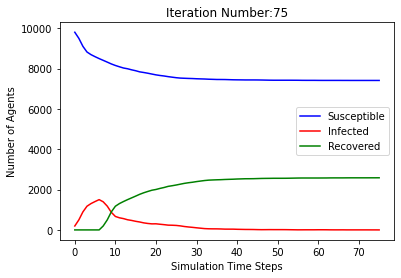

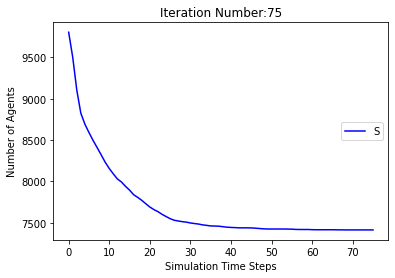

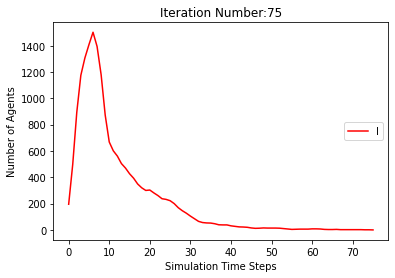

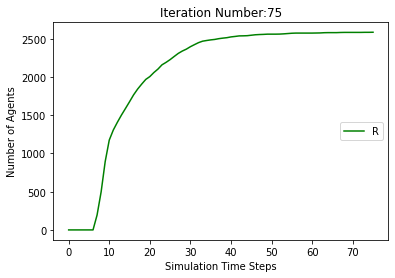

[9805, 9496, 9107, 8849, 8726, 8650, 8561, 8460, 8381, 8309, 8242, 8174, 8111, 8063, 8025, 7984, 7936, 7891, 7844, 7798, 7767, 7742, 7712, 7680, 7657, 7619, 7599, 7581, 7565, 7544, 7527, 7514, 7506, 7500, 7495, 7490, 7487, 7487, 7484, 7482, 7481, 7480, 7480, 7480, 7479, 7479, 7478, 7478, 7478, 7478, 7478, 7478, 7478, 7478]
[195, 504, 893, 1151, 1274, 1350, 1439, 1345, 1115, 798, 607, 552, 539, 498, 435, 397, 373, 351, 330, 313, 296, 283, 272, 256, 234, 225, 199, 186, 177, 168, 153, 143, 113, 99, 86, 75, 57, 40, 30, 24, 19, 15, 10, 7, 8, 5, 4, 3, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 504, 893, 1151, 1274, 1350, 1439, 1540, 1619, 1691, 1758, 1826, 1889, 1937, 1975, 2016, 2064, 2109, 2156, 2202, 2233, 2258, 2288, 2320, 2343, 2381, 2401, 2419, 2435, 2456, 2473, 2486, 2494, 2500, 2505, 2510, 2513, 2513, 2516, 2518, 2519, 2520, 2520, 2520, 2521, 2521, 2522]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351, 8276, 8208, 8161, 8117, 8074, 8030, 7992, 7959, 7927, 7892, 786

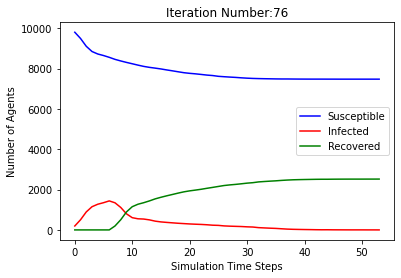

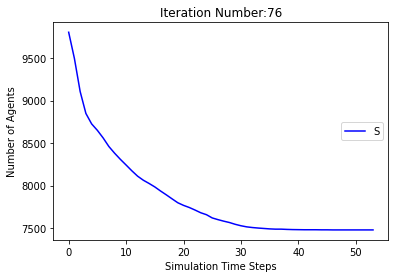

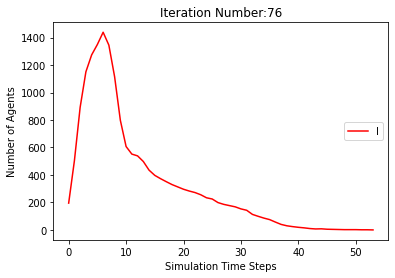

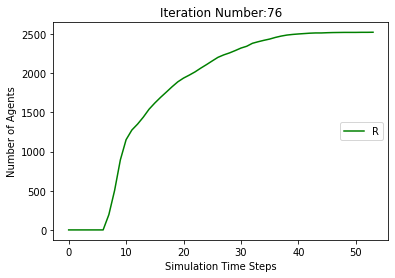

[9805, 9503, 9090, 8832, 8722, 8658, 8584, 8503, 8415, 8312, 8213, 8131, 8047, 7976, 7908, 7847, 7800, 7761, 7718, 7675, 7634, 7609, 7578, 7537, 7511, 7483, 7458, 7439, 7422, 7404, 7381, 7354, 7337, 7325, 7317, 7312, 7307, 7297, 7289, 7278, 7269, 7255, 7246, 7240, 7233, 7230, 7229, 7224, 7220, 7216, 7214, 7213, 7212, 7210, 7208, 7205, 7204, 7200, 7197, 7191, 7188, 7185, 7182, 7181, 7179, 7177, 7175, 7173, 7172, 7170, 7169, 7169, 7168, 7167, 7165, 7162, 7160, 7159, 7159, 7158, 7157, 7156, 7156, 7150, 7147, 7144, 7142, 7141, 7140, 7135, 7129, 7127, 7125, 7124, 7123, 7122, 7122, 7120, 7119, 7118, 7117, 7117, 7117, 7117, 7115, 7114, 7106, 7105, 7103, 7099, 7097, 7093, 7092, 7092, 7092, 7092, 7091, 7090, 7090, 7090, 7090, 7090, 7089, 7089, 7088, 7088, 7088, 7087, 7080, 7077, 7074, 7072, 7072, 7072, 7072, 7072, 7072, 7072, 7071, 7069, 7068, 7068, 7068, 7068, 7067, 7067, 7067, 7066, 7065, 7062, 7059, 7057, 7054, 7052, 7051, 7050, 7048, 7044, 7042, 7036, 7032, 7031, 7031, 7031, 7031, 7031, 703

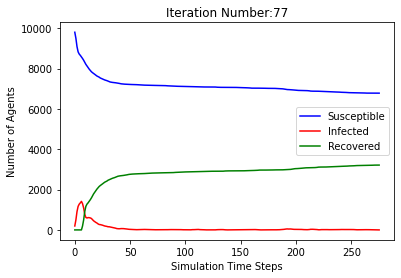

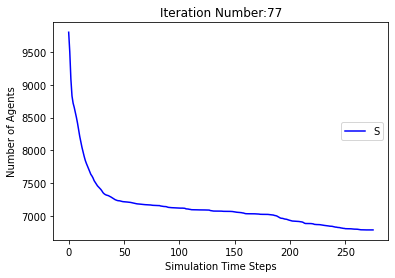

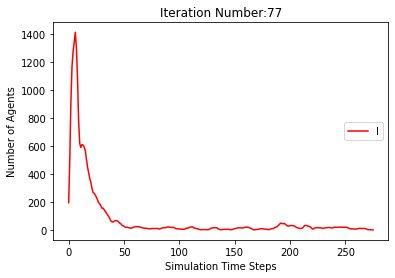

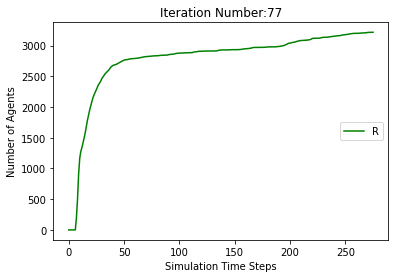

[9805, 9497, 9081, 8837, 8760, 8711, 8653, 8608, 8536, 8457, 8399, 8328, 8250, 8180, 8128, 8087, 8057, 8031, 8014, 7998, 7973, 7949, 7923, 7900, 7879, 7860, 7841, 7823, 7805, 7791, 7783, 7769, 7766, 7760, 7754, 7748, 7741, 7729, 7720, 7715, 7712, 7710, 7707, 7706, 7705, 7705, 7704, 7701, 7699, 7699, 7699, 7698, 7698, 7698, 7697, 7697, 7697, 7697, 7697, 7697, 7697, 7696, 7694, 7693, 7691, 7688, 7686, 7683, 7680, 7679, 7678, 7678, 7677, 7677, 7677, 7674, 7672, 7670, 7668, 7667, 7666, 7665, 7661, 7658, 7654, 7651, 7648, 7645, 7643, 7642, 7640, 7638, 7636, 7635, 7634, 7633, 7633, 7633, 7632, 7630, 7628, 7624, 7624, 7621, 7620, 7619, 7619, 7618, 7617, 7615, 7614, 7614, 7614, 7613, 7610, 7607, 7605, 7605, 7605, 7604, 7603, 7600, 7598, 7595, 7594, 7594, 7593, 7591, 7589, 7588, 7586, 7583, 7581, 7579, 7579, 7579, 7579, 7579, 7577, 7577, 7577, 7577, 7577, 7577, 7577, 7577]
[195, 503, 919, 1163, 1240, 1289, 1347, 1197, 961, 624, 438, 432, 461, 473, 480, 449, 400, 368, 314, 252, 207, 179, 164, 15

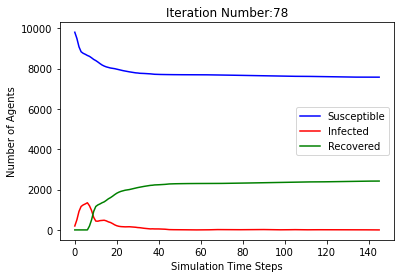

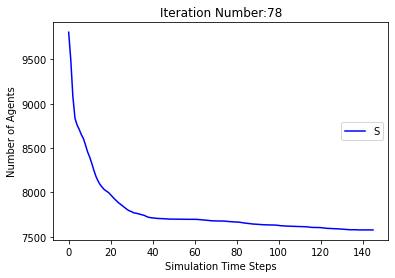

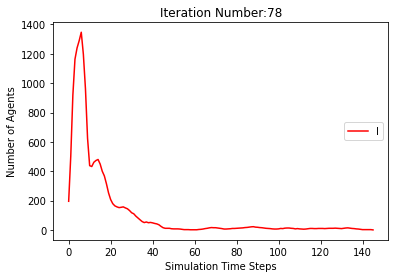

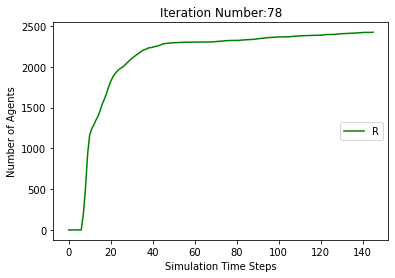

[9805, 9507, 9112, 8855, 8773, 8704, 8642, 8566, 8473, 8382, 8280, 8199, 8137, 8078, 8018, 7974, 7931, 7895, 7874, 7857, 7828, 7804, 7776, 7751, 7732, 7707, 7685, 7675, 7663, 7651, 7636, 7624, 7613, 7603, 7594, 7588, 7583, 7579, 7572, 7566, 7559, 7556, 7552, 7551, 7551, 7550, 7543, 7538, 7527, 7518, 7512, 7506, 7502, 7499, 7498, 7494, 7491, 7491, 7490, 7488, 7487, 7487, 7486, 7486, 7485, 7485, 7485, 7485, 7485, 7484, 7484, 7484, 7484, 7483, 7483, 7483, 7483, 7483, 7482, 7482, 7481, 7478, 7478, 7478, 7478, 7478, 7478, 7478, 7478]
[195, 493, 888, 1145, 1227, 1296, 1358, 1239, 1034, 730, 575, 574, 567, 564, 548, 499, 451, 385, 325, 280, 250, 214, 198, 180, 163, 167, 172, 153, 141, 125, 115, 108, 94, 82, 81, 75, 68, 57, 52, 47, 44, 38, 36, 32, 28, 22, 23, 21, 29, 34, 39, 45, 48, 44, 40, 33, 27, 21, 16, 14, 12, 11, 8, 5, 6, 5, 3, 2, 2, 2, 2, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 5, 5, 5, 5, 4, 4, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 493, 888, 1145, 1227, 1296, 1358, 1434, 1527, 1618, 1720, 1801, 1863, 

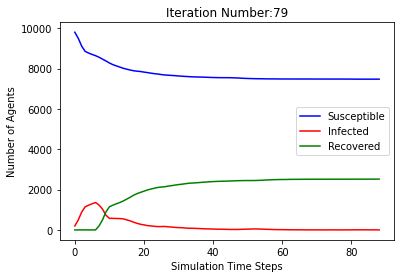

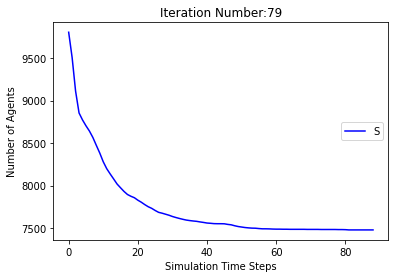

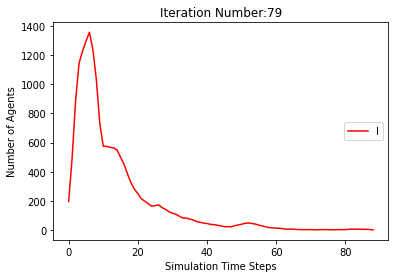

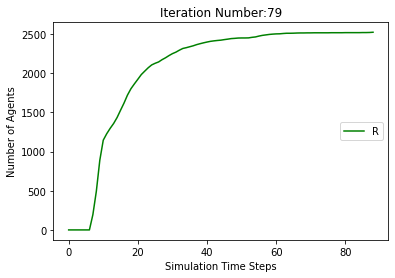

[9805, 9499, 9097, 8856, 8739, 8655, 8570, 8474, 8382, 8293, 8203, 8112, 8029, 7980, 7933, 7862, 7807, 7767, 7726, 7688, 7664, 7643, 7616, 7595, 7580, 7559, 7541, 7526, 7507, 7486, 7470, 7449, 7435, 7427, 7418, 7412, 7407, 7403, 7398, 7396, 7390, 7382, 7367, 7361, 7356, 7355, 7353, 7351, 7347, 7347, 7344, 7337, 7332, 7330, 7328, 7326, 7323, 7323, 7320, 7314, 7309, 7303, 7303, 7302, 7299, 7297, 7295, 7295, 7293, 7292, 7292, 7290, 7288, 7285, 7284, 7283, 7280, 7277, 7273, 7271, 7270, 7270, 7270, 7270, 7270, 7270, 7270, 7270]
[195, 501, 903, 1144, 1261, 1345, 1430, 1331, 1117, 804, 653, 627, 626, 590, 541, 520, 486, 436, 386, 341, 316, 290, 246, 212, 187, 167, 147, 138, 136, 130, 125, 131, 124, 114, 108, 95, 79, 67, 51, 39, 37, 36, 45, 46, 47, 43, 43, 39, 35, 20, 17, 19, 23, 23, 23, 21, 24, 21, 17, 18, 21, 25, 23, 21, 24, 23, 19, 14, 10, 11, 10, 9, 9, 10, 11, 10, 12, 15, 17, 17, 15, 14, 13, 10, 7, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 501, 903, 1144, 1261, 1345, 1430, 1526, 1618, 1707, 1797

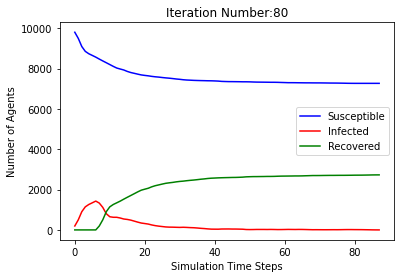

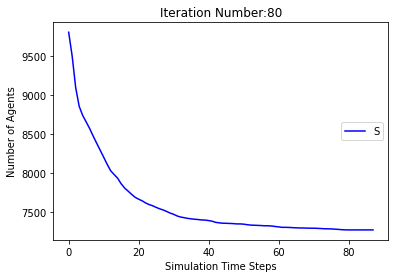

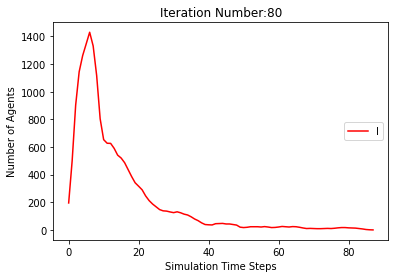

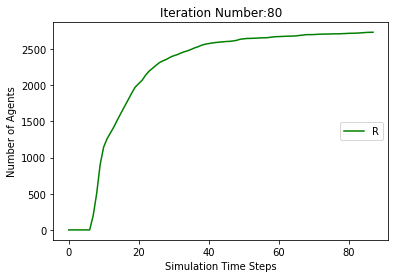

[9805, 9462, 9054, 8830, 8755, 8699, 8634, 8572, 8488, 8401, 8345, 8293, 8252, 8216, 8187, 8162, 8135, 8106, 8071, 8047, 8028, 8005, 7992, 7982, 7969, 7955, 7940, 7934, 7925, 7920, 7910, 7902, 7898, 7886, 7875, 7864, 7857, 7850, 7840, 7836, 7829, 7817, 7810, 7805, 7803, 7801, 7800, 7799, 7794, 7788, 7783, 7781, 7778, 7776, 7775, 7775, 7775, 7775, 7775, 7775, 7775, 7775]
[195, 538, 946, 1170, 1245, 1301, 1366, 1233, 974, 653, 485, 462, 447, 418, 385, 326, 266, 239, 222, 205, 188, 182, 170, 153, 137, 116, 107, 94, 80, 72, 72, 67, 57, 54, 59, 61, 63, 60, 62, 62, 57, 58, 54, 52, 47, 39, 36, 30, 23, 22, 22, 22, 23, 24, 24, 19, 13, 8, 6, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 538, 946, 1170, 1245, 1301, 1366, 1428, 1512, 1599, 1655, 1707, 1748, 1784, 1813, 1838, 1865, 1894, 1929, 1953, 1972, 1995, 2008, 2018, 2031, 2045, 2060, 2066, 2075, 2080, 2090, 2098, 2102, 2114, 2125, 2136, 2143, 2150, 2160, 2164, 2171, 2183, 2190, 2195, 2197, 2199, 2200, 2201, 2206, 2212, 2217, 2219, 2222, 2224, 2225]
[[

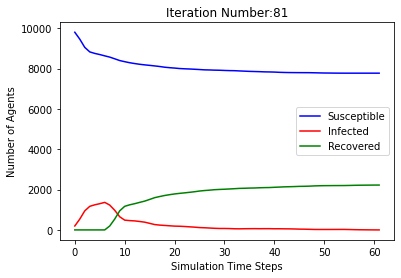

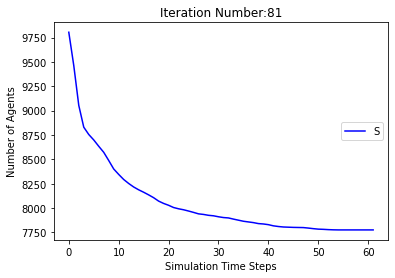

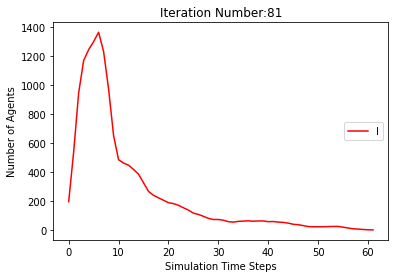

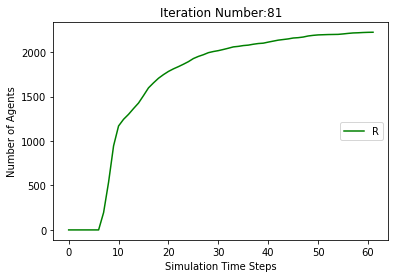

[9805, 9493, 9088, 8819, 8718, 8671, 8611, 8555, 8483, 8409, 8315, 8249, 8180, 8138, 8099, 8058, 8018, 7982, 7954, 7932, 7908, 7892, 7879, 7871, 7854, 7841, 7827, 7818, 7811, 7803, 7796, 7786, 7772, 7764, 7757, 7746, 7736, 7726, 7716, 7706, 7701, 7691, 7684, 7680, 7679, 7675, 7673, 7672, 7670, 7668, 7668, 7667, 7667, 7665, 7664, 7661, 7660, 7658, 7652, 7650, 7647, 7644, 7644, 7644, 7642, 7640, 7638, 7637, 7637, 7637, 7635, 7632, 7627, 7625, 7621, 7619, 7619, 7619, 7619, 7618, 7618, 7618, 7618, 7618, 7618, 7618, 7617, 7617, 7616, 7616, 7616, 7615, 7611, 7609, 7608, 7608, 7605, 7603, 7602, 7599, 7595, 7590, 7585, 7582, 7578, 7574, 7569, 7566, 7565, 7565, 7563, 7561, 7559, 7559, 7559, 7559, 7558, 7557, 7555, 7555, 7554, 7554, 7554, 7554, 7554, 7552, 7552, 7552, 7552, 7552, 7552, 7552, 7551, 7551, 7551, 7551, 7551, 7551, 7551, 7551]
[195, 507, 912, 1181, 1282, 1329, 1389, 1250, 1010, 679, 504, 469, 491, 473, 456, 425, 391, 333, 295, 248, 230, 207, 179, 147, 128, 113, 105, 90, 81, 76, 75, 6

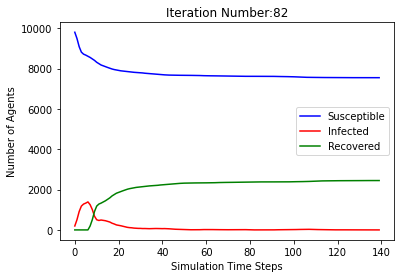

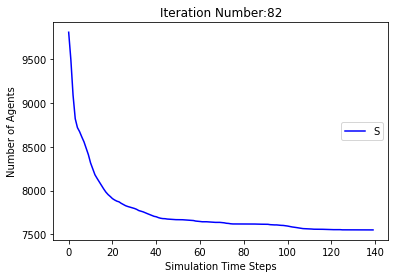

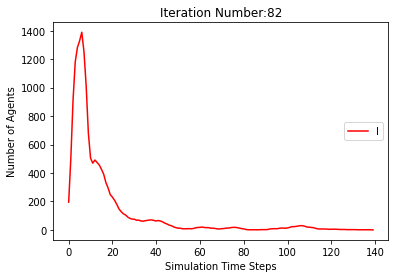

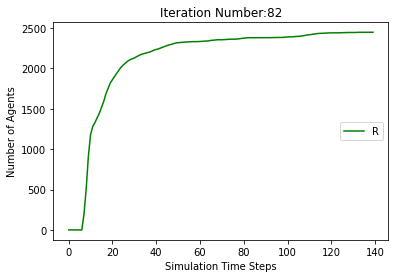

[9805, 9496, 9089, 8849, 8745, 8657, 8573, 8505, 8427, 8352, 8285, 8240, 8193, 8144, 8094, 8049, 8015, 7972, 7937, 7894, 7849, 7825, 7798, 7782, 7763, 7748, 7731, 7716, 7703, 7696, 7685, 7676, 7666, 7657, 7648, 7644, 7641, 7635, 7630, 7624, 7619, 7617, 7616, 7616, 7615, 7614, 7608, 7605, 7597, 7595, 7595, 7593, 7591, 7591, 7589, 7587, 7582, 7580, 7580, 7580, 7579, 7579, 7579, 7579, 7579, 7579, 7579, 7579]
[195, 504, 911, 1151, 1255, 1343, 1427, 1300, 1069, 737, 564, 505, 464, 429, 411, 378, 337, 313, 303, 299, 295, 269, 251, 233, 209, 189, 163, 133, 122, 102, 97, 87, 82, 74, 68, 59, 55, 50, 46, 42, 38, 31, 28, 25, 20, 16, 16, 14, 20, 21, 21, 22, 23, 17, 16, 10, 13, 15, 13, 11, 12, 10, 8, 3, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 504, 911, 1151, 1255, 1343, 1427, 1495, 1573, 1648, 1715, 1760, 1807, 1856, 1906, 1951, 1985, 2028, 2063, 2106, 2151, 2175, 2202, 2218, 2237, 2252, 2269, 2284, 2297, 2304, 2315, 2324, 2334, 2343, 2352, 2356, 2359, 2365, 2370, 2376, 2381, 2383, 2384, 2384, 2385,

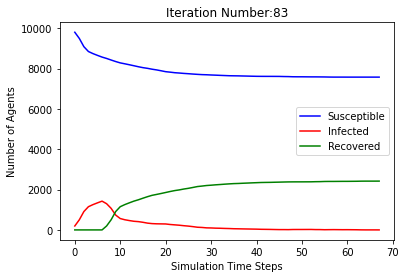

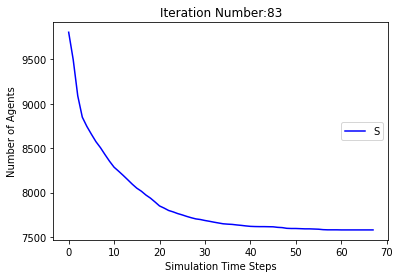

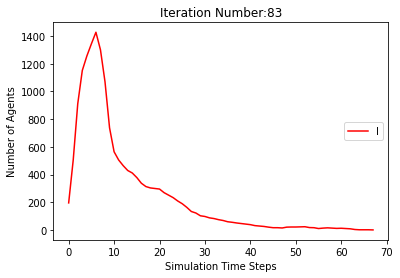

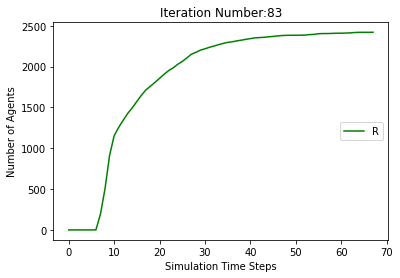

[9805, 9488, 9091, 8840, 8704, 8621, 8529, 8446, 8362, 8280, 8197, 8127, 8061, 8000, 7959, 7912, 7858, 7815, 7787, 7761, 7735, 7701, 7670, 7660, 7654, 7643, 7635, 7627, 7615, 7597, 7588, 7578, 7567, 7565, 7564, 7561, 7559, 7556, 7549, 7541, 7539, 7537, 7535, 7535, 7535, 7534, 7534, 7533, 7532, 7532, 7532, 7532, 7532, 7531, 7528, 7527, 7526, 7524, 7522, 7520, 7519, 7518, 7511, 7506, 7501, 7499, 7498, 7498, 7497, 7497, 7494, 7493, 7489, 7488, 7488, 7488, 7486, 7484, 7484, 7480, 7479, 7479, 7477, 7476, 7475, 7475, 7475, 7473, 7470, 7467, 7467, 7467, 7467, 7467, 7466, 7464, 7462, 7461, 7461, 7460, 7457, 7454, 7454, 7454, 7454, 7454, 7454, 7453, 7452, 7452, 7451, 7449, 7449, 7449, 7449, 7448, 7448, 7448, 7448, 7448, 7448, 7448, 7448]
[195, 512, 909, 1160, 1296, 1379, 1471, 1359, 1126, 811, 643, 577, 560, 529, 487, 450, 422, 382, 340, 300, 265, 258, 242, 198, 161, 144, 126, 108, 86, 73, 72, 76, 76, 70, 63, 54, 38, 32, 29, 26, 26, 27, 26, 24, 21, 15, 7, 6, 5, 3, 3, 3, 2, 3, 5, 5, 6, 8, 10, 12

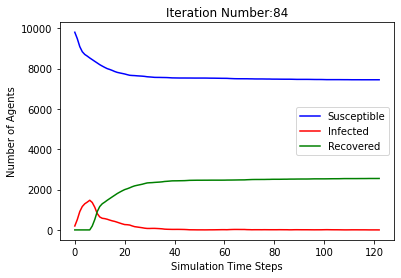

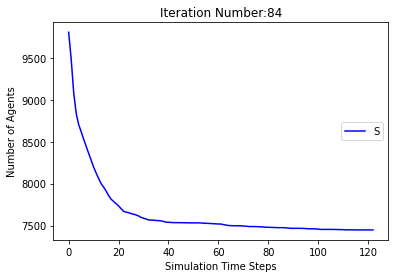

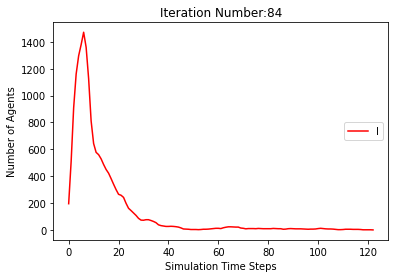

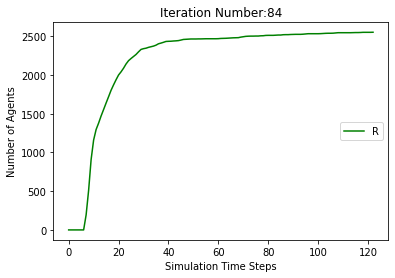

[9805, 9503, 9100, 8820, 8694, 8613, 8547, 8472, 8398, 8296, 8218, 8150, 8096, 8042, 7973, 7900, 7837, 7798, 7742, 7700, 7663, 7624, 7604, 7580, 7561, 7548, 7533, 7525, 7515, 7505, 7495, 7492, 7487, 7485, 7482, 7478, 7471, 7461, 7457, 7456, 7450, 7445, 7441, 7437, 7435, 7434, 7429, 7422, 7417, 7411, 7406, 7399, 7397, 7392, 7388, 7385, 7383, 7380, 7376, 7375, 7373, 7372, 7371, 7371, 7371, 7370, 7370, 7370, 7370, 7370, 7370, 7370, 7369, 7366, 7365, 7364, 7364, 7364, 7364, 7363, 7362, 7362, 7362, 7362, 7362, 7362, 7362, 7361, 7361, 7361, 7361, 7361, 7361, 7361, 7360, 7360, 7360, 7359, 7359, 7358, 7357, 7354, 7353, 7352, 7351, 7351, 7350, 7347, 7343, 7338, 7337, 7336, 7336, 7336, 7336, 7336, 7334, 7334, 7334, 7334, 7334, 7334, 7334, 7334]
[195, 497, 900, 1180, 1306, 1387, 1453, 1333, 1105, 804, 602, 544, 517, 505, 499, 498, 459, 420, 408, 396, 379, 349, 296, 257, 237, 194, 167, 138, 109, 99, 85, 69, 61, 48, 43, 37, 34, 34, 35, 31, 35, 37, 37, 34, 26, 23, 27, 28, 28, 30, 31, 36, 37, 37, 34,

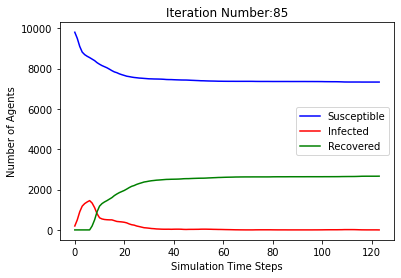

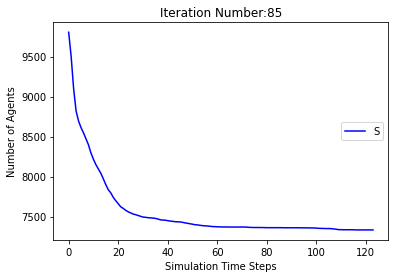

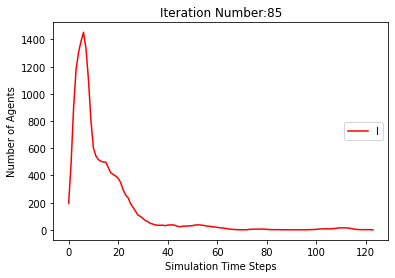

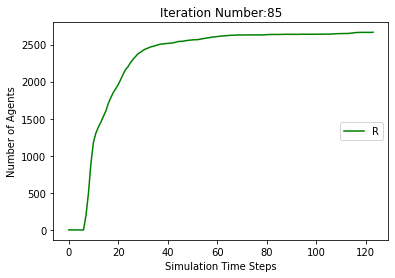

[9805, 9478, 9101, 8865, 8749, 8675, 8596, 8523, 8437, 8344, 8259, 8189, 8127, 8069, 8036, 8003, 7976, 7950, 7934, 7909, 7879, 7859, 7846, 7834, 7817, 7803, 7796, 7788, 7775, 7763, 7745, 7733, 7728, 7726, 7723, 7720, 7718, 7714, 7709, 7707, 7707, 7706, 7703, 7700, 7699, 7698, 7695, 7691, 7690, 7690, 7689, 7689, 7689, 7688, 7688, 7688, 7688, 7688, 7688, 7687, 7687, 7686, 7686, 7686, 7686, 7685, 7685, 7685, 7684, 7684, 7684, 7683, 7682, 7682, 7681, 7679, 7677, 7675, 7675, 7673, 7673, 7672, 7670, 7667, 7662, 7660, 7660, 7660, 7660, 7660, 7660, 7660, 7660]
[195, 522, 899, 1135, 1251, 1325, 1404, 1282, 1041, 757, 606, 560, 548, 527, 487, 434, 368, 309, 255, 218, 190, 177, 157, 142, 133, 131, 113, 91, 84, 83, 89, 84, 75, 70, 65, 55, 45, 31, 24, 21, 19, 17, 17, 18, 15, 11, 12, 16, 16, 13, 11, 10, 9, 7, 3, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 3, 3, 3, 4, 5, 7, 9, 8, 9, 9, 9, 9, 10, 13, 15, 13, 13, 12, 10, 7, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 522, 899, 1135, 1251, 1325, 1404, 1477, 15

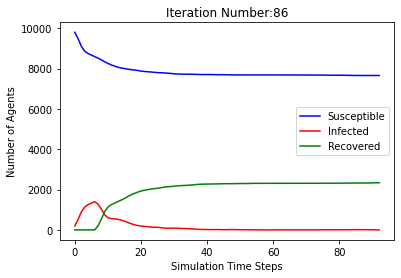

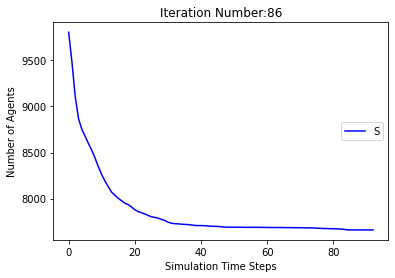

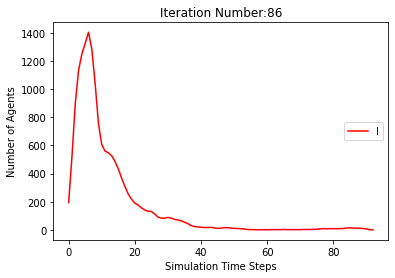

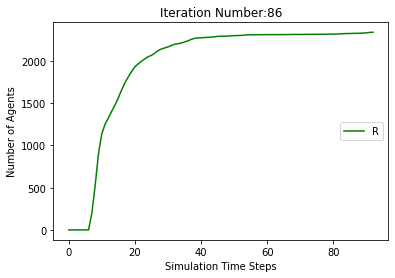

[9805, 9498, 9112, 8839, 8707, 8613, 8508, 8417, 8339, 8267, 8216, 8167, 8133, 8099, 8058, 8023, 7987, 7948, 7914, 7894, 7871, 7846, 7830, 7819, 7807, 7786, 7773, 7764, 7754, 7745, 7733, 7723, 7718, 7713, 7711, 7710, 7710, 7710, 7708, 7707, 7703, 7701, 7696, 7688, 7684, 7680, 7677, 7676, 7675, 7672, 7671, 7670, 7664, 7661, 7659, 7659, 7657, 7655, 7654, 7654, 7654, 7654, 7654, 7654, 7654, 7654]
[195, 502, 888, 1161, 1293, 1387, 1492, 1388, 1159, 845, 623, 540, 480, 409, 359, 316, 280, 268, 253, 239, 228, 212, 193, 168, 141, 128, 121, 107, 92, 85, 86, 84, 68, 60, 53, 44, 35, 23, 15, 11, 10, 10, 14, 22, 26, 28, 30, 27, 26, 24, 17, 14, 16, 16, 17, 16, 15, 16, 16, 10, 7, 5, 5, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 502, 888, 1161, 1293, 1387, 1492, 1583, 1661, 1733, 1784, 1833, 1867, 1901, 1942, 1977, 2013, 2052, 2086, 2106, 2129, 2154, 2170, 2181, 2193, 2214, 2227, 2236, 2246, 2255, 2267, 2277, 2282, 2287, 2289, 2290, 2290, 2290, 2292, 2293, 2297, 2299, 2304, 2312, 2316, 2320, 2323, 2324, 232

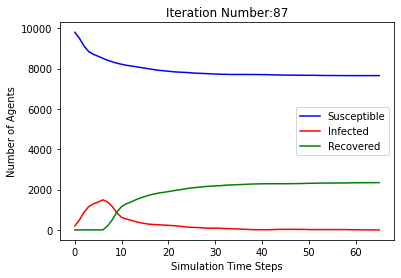

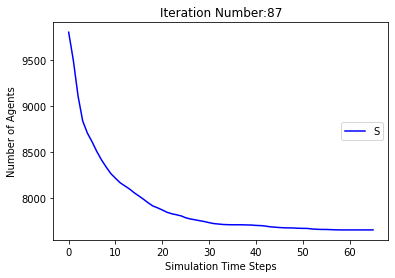

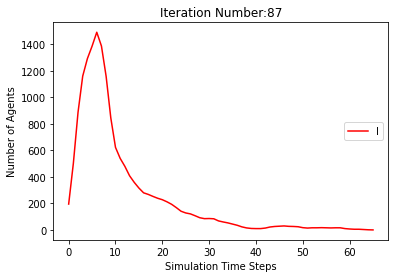

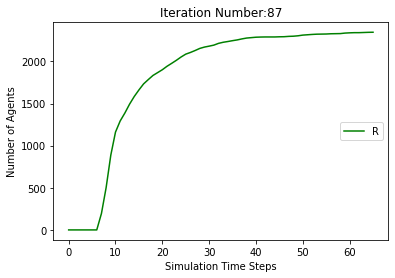

[9805, 9512, 9112, 8848, 8737, 8660, 8605, 8532, 8453, 8373, 8310, 8242, 8185, 8105, 8050, 8003, 7967, 7922, 7877, 7848, 7824, 7810, 7786, 7761, 7737, 7718, 7697, 7682, 7673, 7659, 7651, 7642, 7628, 7611, 7595, 7581, 7573, 7563, 7552, 7548, 7546, 7539, 7526, 7520, 7514, 7507, 7500, 7496, 7490, 7489, 7489, 7487, 7484, 7481, 7475, 7468, 7466, 7465, 7465, 7464, 7464, 7464, 7464, 7464, 7464, 7464, 7463, 7463, 7462, 7460, 7458, 7457, 7457, 7454, 7450, 7449, 7447, 7446, 7445, 7444, 7441, 7438, 7435, 7432, 7427, 7425, 7422, 7419, 7417, 7413, 7410, 7409, 7408, 7408, 7408, 7408, 7408, 7408, 7407, 7405, 7403, 7401, 7401, 7401, 7401, 7401, 7401, 7401, 7401]
[195, 488, 888, 1152, 1263, 1340, 1395, 1273, 1059, 739, 538, 495, 475, 500, 482, 450, 406, 388, 365, 337, 281, 240, 217, 206, 185, 159, 151, 142, 137, 127, 110, 95, 90, 86, 87, 92, 86, 88, 90, 80, 65, 56, 55, 53, 49, 45, 48, 50, 49, 37, 31, 27, 23, 19, 21, 22, 23, 24, 22, 20, 17, 11, 4, 2, 1, 1, 1, 1, 2, 4, 6, 7, 7, 9, 13, 13, 13, 12, 12, 13,

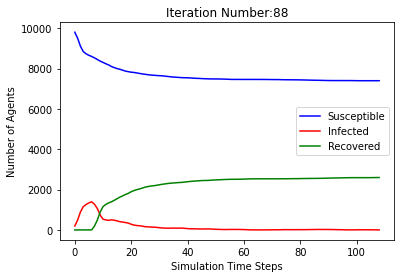

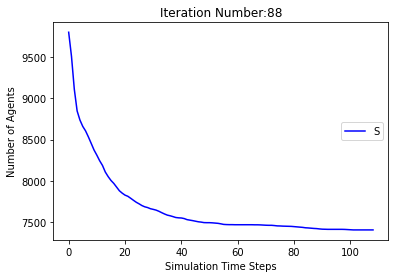

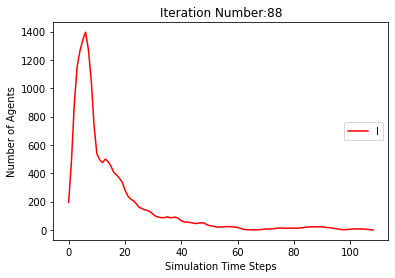

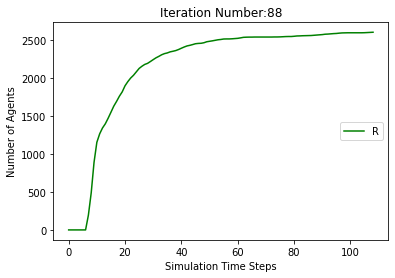

[9805, 9462, 9065, 8819, 8718, 8631, 8534, 8443, 8346, 8234, 8139, 8053, 7990, 7934, 7881, 7836, 7789, 7744, 7700, 7679, 7650, 7629, 7612, 7596, 7574, 7557, 7540, 7522, 7501, 7484, 7463, 7450, 7440, 7424, 7404, 7397, 7390, 7388, 7387, 7385, 7384, 7379, 7373, 7368, 7364, 7364, 7363, 7363, 7362, 7360, 7359, 7357, 7357, 7356, 7355, 7352, 7351, 7349, 7348, 7348, 7348, 7348, 7348, 7348, 7348, 7348]
[195, 538, 935, 1181, 1282, 1369, 1466, 1362, 1116, 831, 680, 665, 641, 600, 562, 510, 445, 395, 353, 311, 284, 252, 224, 193, 170, 143, 139, 128, 128, 128, 133, 124, 117, 116, 118, 104, 94, 75, 63, 55, 40, 25, 24, 22, 24, 23, 22, 21, 17, 13, 9, 7, 7, 7, 8, 10, 9, 10, 9, 9, 8, 7, 4, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 538, 935, 1181, 1282, 1369, 1466, 1557, 1654, 1766, 1861, 1947, 2010, 2066, 2119, 2164, 2211, 2256, 2300, 2321, 2350, 2371, 2388, 2404, 2426, 2443, 2460, 2478, 2499, 2516, 2537, 2550, 2560, 2576, 2596, 2603, 2610, 2612, 2613, 2615, 2616, 2621, 2627, 2632, 2636, 2636, 2637, 2637, 263

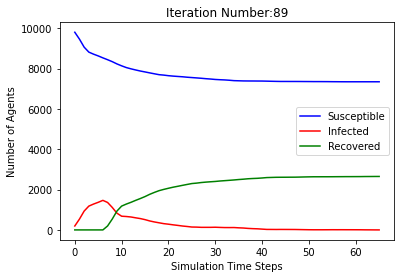

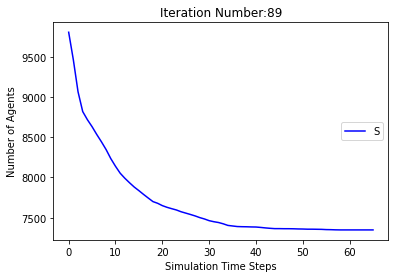

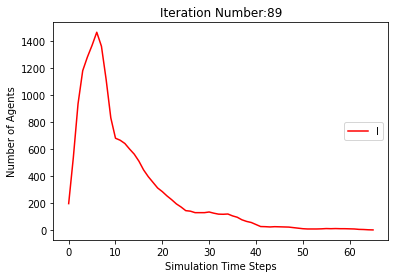

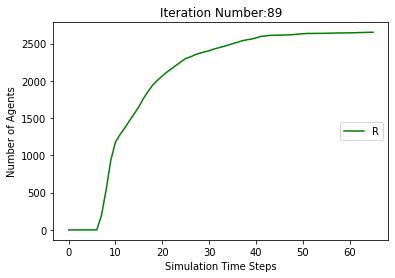

[9805, 9510, 9104, 8847, 8744, 8680, 8611, 8537, 8465, 8386, 8294, 8220, 8159, 8111, 8056, 8015, 7985, 7957, 7936, 7913, 7892, 7882, 7873, 7857, 7846, 7840, 7833, 7824, 7812, 7808, 7805, 7793, 7787, 7782, 7780, 7773, 7772, 7771, 7766, 7766, 7766, 7766, 7766, 7766, 7766, 7766]
[195, 490, 896, 1153, 1256, 1320, 1389, 1268, 1045, 718, 553, 524, 521, 500, 481, 450, 401, 337, 284, 246, 219, 174, 142, 128, 111, 96, 80, 68, 70, 65, 52, 53, 53, 51, 44, 39, 36, 34, 27, 21, 16, 14, 7, 6, 5, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 490, 896, 1153, 1256, 1320, 1389, 1463, 1535, 1614, 1706, 1780, 1841, 1889, 1944, 1985, 2015, 2043, 2064, 2087, 2108, 2118, 2127, 2143, 2154, 2160, 2167, 2176, 2188, 2192, 2195, 2207, 2213, 2218, 2220, 2227, 2228, 2229, 2234]
[[], [9805, 9522, 9125, 8861, 8724, 8659, 8597, 8527, 8440, 8351, 8276, 8208, 8161, 8117, 8074, 8030, 7992, 7959, 7927, 7892, 7860, 7837, 7819, 7802, 7787, 7776, 7762, 7748, 7737, 7729, 7719, 7710, 7703, 7699, 7696, 7694, 7693, 7693, 7690, 7689, 7688, 7684, 

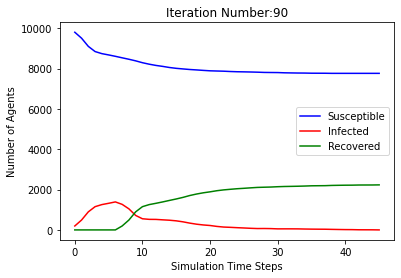

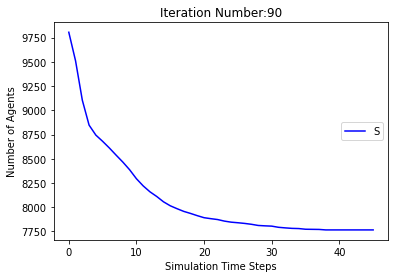

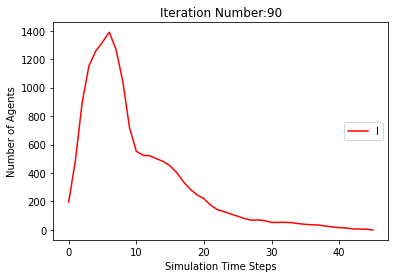

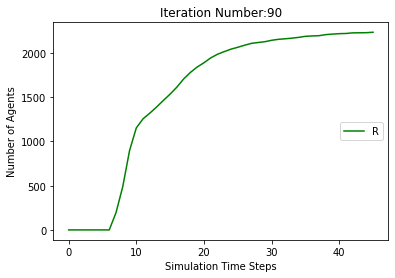

[9805, 9507, 9099, 8838, 8716, 8627, 8545, 8448, 8357, 8258, 8183, 8111, 8046, 7992, 7935, 7880, 7835, 7799, 7770, 7752, 7725, 7689, 7659, 7631, 7595, 7570, 7546, 7524, 7512, 7500, 7482, 7475, 7462, 7455, 7449, 7445, 7440, 7437, 7434, 7432, 7428, 7425, 7425, 7423, 7421, 7418, 7413, 7411, 7411, 7409, 7405, 7404, 7403, 7402, 7399, 7397, 7393, 7391, 7390, 7390, 7389, 7388, 7388, 7386, 7386, 7384, 7383, 7382, 7382, 7379, 7376, 7373, 7368, 7364, 7360, 7358, 7357, 7353, 7347, 7344, 7340, 7334, 7330, 7327, 7322, 7313, 7304, 7292, 7284, 7283, 7280, 7276, 7269, 7265, 7260, 7259, 7256, 7256, 7256, 7255, 7255, 7254, 7254, 7254, 7252, 7252, 7250, 7250, 7250, 7250, 7249, 7248, 7248, 7247, 7244, 7244, 7243, 7242, 7242, 7242, 7242, 7241, 7240, 7237, 7234, 7234, 7234, 7234, 7233, 7232, 7229, 7224, 7221, 7221, 7221, 7219, 7217, 7215, 7214, 7214, 7211, 7210, 7210, 7210, 7210, 7210, 7210, 7210, 7210]
[195, 493, 901, 1162, 1284, 1373, 1455, 1357, 1150, 841, 655, 605, 581, 553, 513, 477, 423, 384, 341, 294

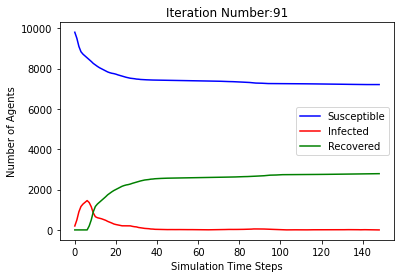

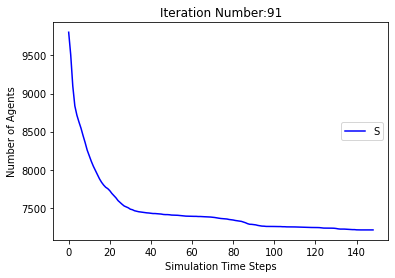

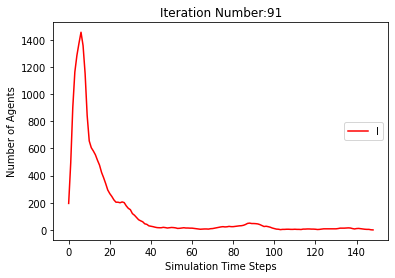

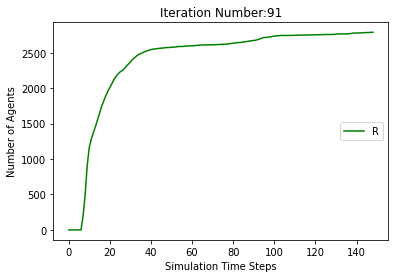

[9805, 9493, 9092, 8834, 8735, 8676, 8599, 8520, 8455, 8377, 8303, 8242, 8191, 8141, 8104, 8067, 8042, 8025, 7996, 7968, 7936, 7916, 7901, 7890, 7884, 7879, 7873, 7862, 7851, 7838, 7830, 7828, 7826, 7816, 7804, 7796, 7792, 7787, 7782, 7775, 7768, 7761, 7749, 7736, 7728, 7722, 7718, 7715, 7713, 7712, 7709, 7708, 7707, 7705, 7703, 7702, 7700, 7700, 7700, 7700, 7699, 7699, 7699, 7699, 7699, 7699, 7699, 7699]
[195, 507, 908, 1166, 1265, 1324, 1401, 1285, 1038, 715, 531, 493, 485, 458, 416, 388, 335, 278, 246, 223, 205, 188, 166, 152, 141, 117, 95, 74, 65, 63, 60, 56, 53, 57, 58, 55, 46, 43, 46, 51, 48, 43, 47, 56, 59, 60, 57, 53, 48, 37, 27, 20, 15, 13, 12, 11, 12, 9, 8, 7, 6, 4, 3, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 507, 908, 1166, 1265, 1324, 1401, 1480, 1545, 1623, 1697, 1758, 1809, 1859, 1896, 1933, 1958, 1975, 2004, 2032, 2064, 2084, 2099, 2110, 2116, 2121, 2127, 2138, 2149, 2162, 2170, 2172, 2174, 2184, 2196, 2204, 2208, 2213, 2218, 2225, 2232, 2239, 2251, 2264, 2272, 2278, 22

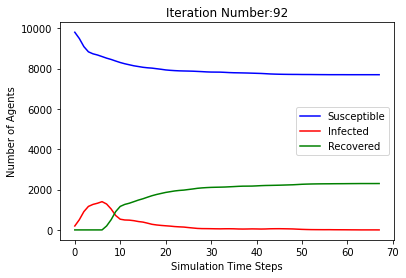

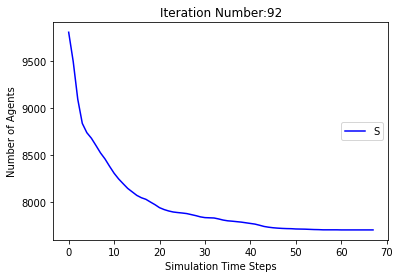

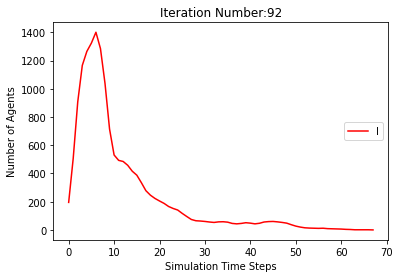

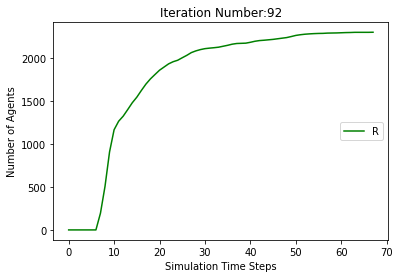

[9805, 9505, 9082, 8831, 8713, 8631, 8551, 8468, 8375, 8289, 8207, 8143, 8092, 8039, 8000, 7967, 7938, 7899, 7874, 7855, 7835, 7819, 7803, 7792, 7781, 7767, 7753, 7739, 7730, 7726, 7721, 7715, 7708, 7705, 7697, 7686, 7680, 7677, 7669, 7665, 7658, 7650, 7646, 7638, 7634, 7633, 7633, 7631, 7630, 7627, 7621, 7618, 7612, 7607, 7605, 7602, 7597, 7587, 7579, 7572, 7563, 7562, 7561, 7559, 7557, 7552, 7550, 7547, 7542, 7539, 7534, 7532, 7526, 7525, 7521, 7518, 7512, 7509, 7508, 7507, 7506, 7505, 7502, 7499, 7496, 7489, 7489, 7489, 7488, 7488, 7487, 7486, 7485, 7482, 7480, 7478, 7477, 7476, 7475, 7474, 7474, 7474, 7473, 7473, 7472, 7472, 7472, 7472, 7471, 7471, 7471, 7471, 7471, 7471, 7471, 7470, 7470, 7469, 7468, 7467, 7467, 7467, 7467, 7467, 7465, 7465, 7463, 7463, 7463, 7462, 7462, 7462, 7462, 7462, 7462, 7462, 7462]
[195, 495, 918, 1169, 1287, 1369, 1449, 1337, 1130, 793, 624, 570, 539, 512, 468, 408, 351, 308, 269, 237, 204, 181, 164, 146, 118, 107, 102, 96, 89, 77, 71, 66, 59, 48, 42, 44,

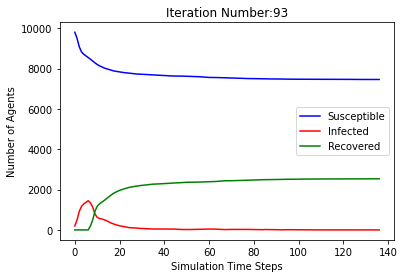

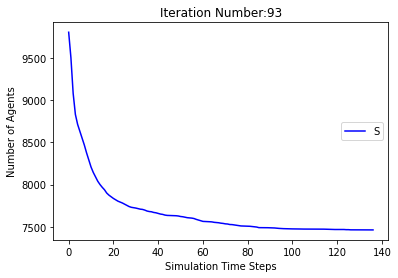

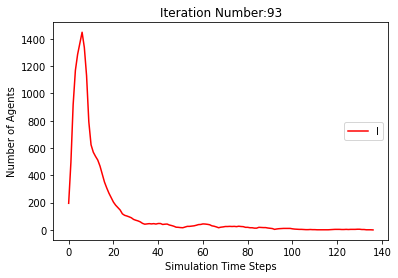

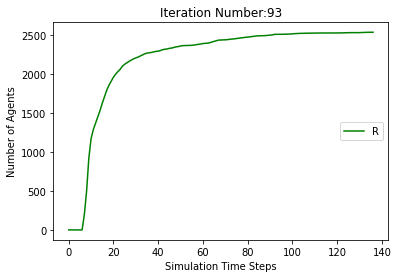

[9805, 9494, 9124, 8873, 8761, 8694, 8617, 8524, 8457, 8375, 8282, 8218, 8164, 8119, 8074, 8035, 7993, 7952, 7917, 7876, 7836, 7809, 7789, 7772, 7754, 7741, 7722, 7704, 7689, 7669, 7647, 7634, 7629, 7624, 7614, 7603, 7594, 7589, 7584, 7579, 7573, 7565, 7560, 7557, 7553, 7549, 7545, 7541, 7537, 7530, 7526, 7523, 7522, 7521, 7520, 7516, 7513, 7512, 7506, 7499, 7494, 7488, 7485, 7485, 7481, 7481, 7481, 7479, 7476, 7471, 7470, 7468, 7467, 7466, 7466, 7466, 7466, 7464, 7464, 7463, 7462, 7462, 7462, 7462, 7461, 7461, 7461, 7461, 7461, 7460, 7460, 7460, 7460, 7460, 7459, 7458, 7456, 7456, 7456, 7456, 7455, 7454, 7452, 7449, 7449, 7449, 7449, 7448, 7448, 7448, 7448, 7448, 7448, 7448, 7447, 7447, 7447, 7447, 7444, 7442, 7440, 7439, 7436, 7431, 7423, 7420, 7417, 7415, 7414, 7412, 7411, 7410, 7409, 7406, 7406, 7406, 7404, 7404, 7403, 7402, 7401, 7399, 7399, 7399, 7398, 7398, 7398, 7397, 7395, 7392, 7390, 7390, 7388, 7383, 7379, 7379, 7379, 7377, 7375, 7374, 7373, 7373, 7372, 7369, 7368, 7368, 736

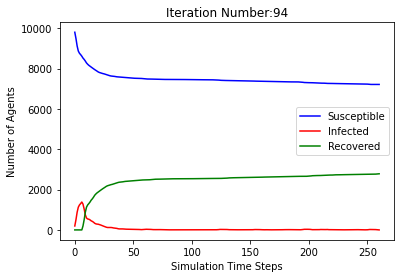

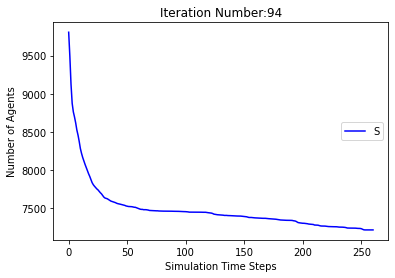

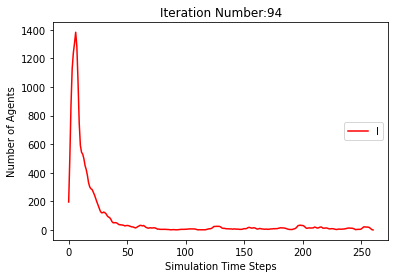

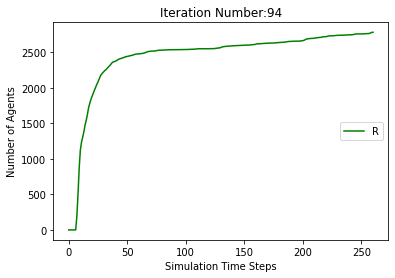

[9805, 9471, 9068, 8839, 8747, 8685, 8618, 8551, 8480, 8414, 8365, 8322, 8271, 8229, 8177, 8127, 8095, 8066, 8034, 8009, 7984, 7961, 7939, 7915, 7897, 7881, 7867, 7847, 7832, 7824, 7814, 7808, 7802, 7788, 7776, 7769, 7766, 7757, 7752, 7747, 7739, 7733, 7729, 7727, 7721, 7717, 7711, 7706, 7702, 7700, 7699, 7699, 7699, 7698, 7696, 7694, 7693, 7693, 7693, 7693, 7693, 7692, 7692, 7691, 7691, 7691, 7691, 7691, 7691, 7691, 7691]
[195, 529, 932, 1161, 1253, 1315, 1382, 1254, 991, 654, 474, 425, 414, 389, 374, 353, 319, 299, 288, 262, 245, 216, 188, 180, 169, 153, 142, 137, 129, 115, 101, 89, 79, 79, 71, 63, 58, 57, 56, 55, 49, 43, 40, 39, 36, 35, 36, 33, 31, 29, 28, 22, 18, 13, 10, 8, 7, 6, 6, 6, 5, 4, 2, 2, 2, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 529, 932, 1161, 1253, 1315, 1382, 1449, 1520, 1586, 1635, 1678, 1729, 1771, 1823, 1873, 1905, 1934, 1966, 1991, 2016, 2039, 2061, 2085, 2103, 2119, 2133, 2153, 2168, 2176, 2186, 2192, 2198, 2212, 2224, 2231, 2234, 2243, 2248, 2253, 2261, 226

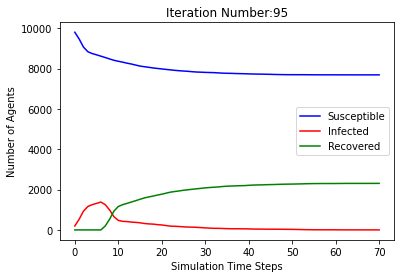

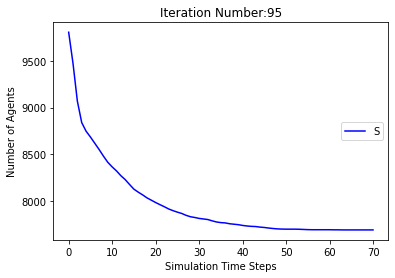

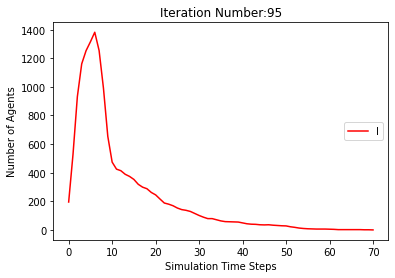

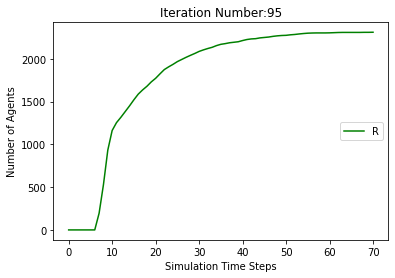

[9805, 9498, 9087, 8822, 8732, 8665, 8604, 8528, 8473, 8411, 8352, 8300, 8231, 8186, 8153, 8102, 8053, 8017, 7974, 7939, 7901, 7857, 7818, 7792, 7767, 7745, 7720, 7700, 7679, 7668, 7652, 7642, 7627, 7617, 7614, 7610, 7604, 7599, 7598, 7594, 7589, 7583, 7577, 7570, 7566, 7566, 7566, 7565, 7565, 7564, 7562, 7559, 7558, 7556, 7552, 7545, 7543, 7542, 7542, 7541, 7535, 7529, 7527, 7525, 7524, 7524, 7524, 7521, 7519, 7518, 7518, 7518, 7518, 7517, 7514, 7512, 7512, 7512, 7511, 7511, 7511, 7511, 7511, 7511, 7511, 7511]
[195, 502, 913, 1178, 1268, 1335, 1396, 1277, 1025, 676, 470, 432, 434, 418, 375, 371, 358, 335, 326, 292, 285, 296, 284, 261, 250, 229, 219, 201, 178, 150, 140, 125, 118, 103, 86, 69, 64, 53, 44, 33, 28, 31, 33, 34, 33, 32, 28, 24, 18, 13, 8, 7, 8, 10, 13, 20, 21, 20, 17, 17, 21, 23, 18, 18, 18, 18, 17, 14, 10, 9, 7, 6, 6, 7, 7, 7, 6, 6, 7, 7, 6, 3, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 195, 502, 913, 1178, 1268, 1335, 1396, 1472, 1527, 1589, 1648, 1700, 1769, 1814, 1847, 1898, 194

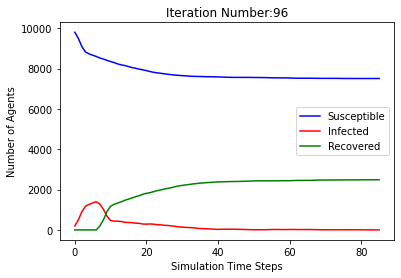

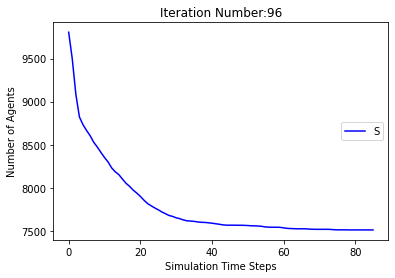

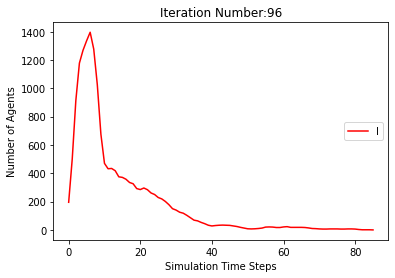

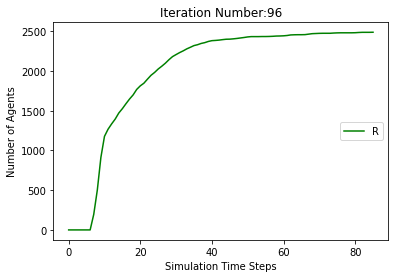

[9805, 9480, 9077, 8819, 8701, 8631, 8562, 8469, 8378, 8311, 8244, 8201, 8144, 8100, 8069, 8035, 8003, 7964, 7930, 7903, 7880, 7865, 7853, 7839, 7820, 7798, 7781, 7772, 7768, 7761, 7759, 7751, 7736, 7725, 7709, 7704, 7700, 7699, 7699, 7699, 7698, 7697, 7693, 7689, 7687, 7686, 7683, 7681, 7680, 7680, 7678, 7678, 7676, 7672, 7668, 7668, 7667, 7667, 7667, 7666, 7663, 7660, 7657, 7655, 7652, 7651, 7651, 7651, 7649, 7646, 7642, 7639, 7635, 7632, 7630, 7627, 7623, 7621, 7617, 7617, 7617, 7615, 7613, 7613, 7612, 7612, 7612, 7611, 7611, 7610, 7610, 7610, 7610, 7610, 7610, 7610, 7610]
[195, 520, 923, 1181, 1299, 1369, 1438, 1336, 1102, 766, 575, 500, 487, 462, 400, 343, 308, 280, 271, 241, 220, 204, 182, 164, 144, 132, 122, 108, 97, 92, 80, 69, 62, 56, 63, 64, 61, 60, 52, 37, 27, 12, 11, 11, 12, 13, 16, 17, 17, 13, 11, 9, 10, 11, 13, 12, 13, 11, 11, 10, 9, 8, 11, 12, 15, 16, 15, 12, 11, 11, 13, 13, 16, 19, 21, 22, 23, 21, 22, 18, 15, 15, 14, 10, 9, 5, 5, 6, 4, 3, 3, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 

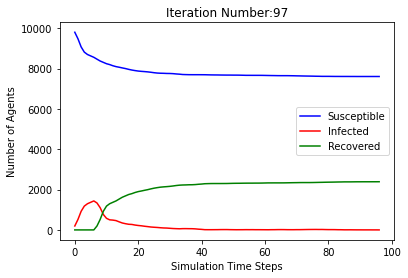

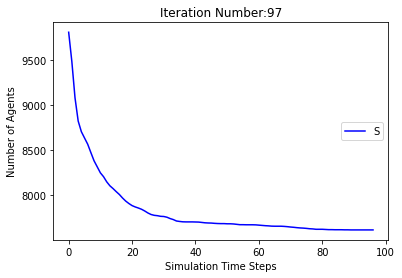

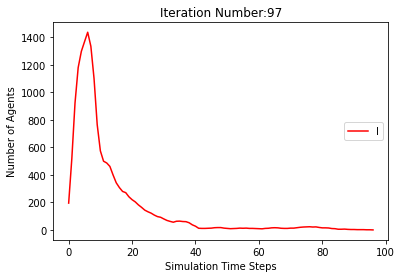

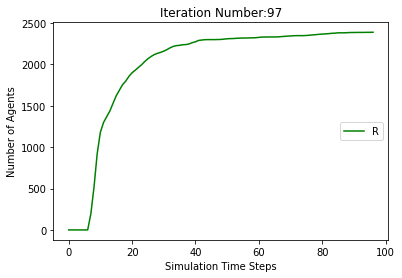

[9805, 9485, 9088, 8847, 8743, 8660, 8591, 8527, 8459, 8384, 8326, 8251, 8200, 8151, 8095, 8049, 8019, 7992, 7947, 7909, 7865, 7828, 7794, 7755, 7725, 7697, 7676, 7652, 7628, 7604, 7591, 7581, 7570, 7561, 7550, 7542, 7537, 7525, 7517, 7509, 7503, 7497, 7491, 7484, 7479, 7471, 7463, 7459, 7456, 7451, 7446, 7440, 7439, 7434, 7430, 7429, 7428, 7426, 7424, 7423, 7419, 7419, 7419, 7418, 7414, 7412, 7410, 7406, 7403, 7399, 7396, 7396, 7396, 7395, 7394, 7393, 7393, 7392, 7389, 7384, 7384, 7382, 7381, 7380, 7375, 7373, 7370, 7367, 7367, 7367, 7367, 7367, 7367, 7367, 7367]
[195, 515, 912, 1153, 1257, 1340, 1409, 1278, 1026, 704, 521, 492, 460, 440, 432, 410, 365, 334, 304, 291, 286, 267, 255, 264, 267, 250, 233, 213, 200, 190, 164, 144, 127, 115, 102, 86, 67, 66, 64, 61, 58, 53, 51, 53, 46, 46, 46, 44, 41, 40, 38, 39, 32, 29, 29, 27, 23, 20, 16, 16, 15, 11, 10, 10, 12, 12, 13, 13, 16, 20, 22, 18, 16, 15, 12, 10, 6, 4, 7, 12, 11, 12, 12, 13, 17, 16, 14, 17, 15, 14, 13, 8, 6, 3, 0]
[0, 0, 0, 0, 0

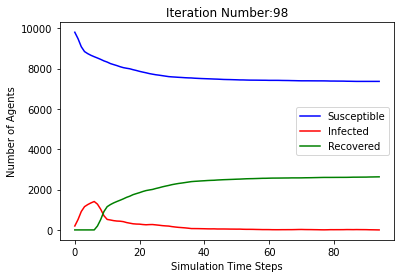

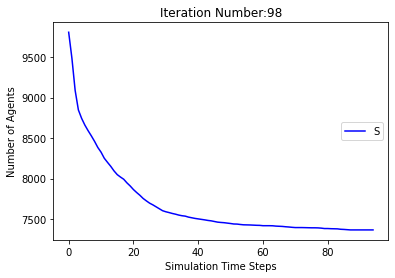

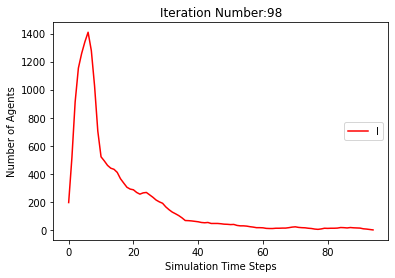

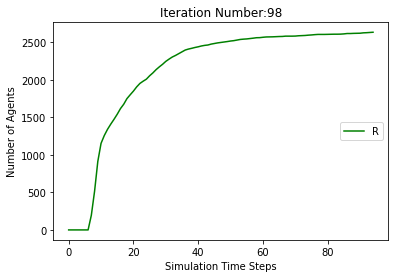

[9805, 9497, 9085, 8833, 8734, 8679, 8620, 8549, 8481, 8405, 8332, 8269, 8229, 8184, 8131, 8093, 8060, 8025, 8000, 7974, 7952, 7929, 7911, 7889, 7872, 7840, 7816, 7796, 7767, 7746, 7728, 7710, 7693, 7673, 7661, 7656, 7646, 7637, 7631, 7628, 7624, 7618, 7614, 7608, 7603, 7598, 7593, 7591, 7589, 7585, 7580, 7578, 7571, 7566, 7566, 7565, 7561, 7556, 7553, 7553, 7551, 7547, 7547, 7546, 7546, 7546, 7545, 7545, 7545, 7545, 7545, 7545, 7545, 7544, 7544, 7543, 7543, 7543, 7543, 7542, 7542, 7542, 7542, 7542, 7541, 7541, 7541, 7540, 7538, 7536, 7535, 7533, 7533, 7533, 7533, 7532, 7531, 7527, 7523, 7522, 7522, 7522, 7522, 7522, 7522, 7522, 7522]
[195, 503, 915, 1167, 1266, 1321, 1380, 1256, 1016, 680, 501, 465, 450, 436, 418, 388, 345, 307, 269, 255, 232, 202, 182, 171, 153, 160, 158, 156, 162, 165, 161, 162, 147, 143, 135, 111, 100, 91, 79, 65, 49, 43, 42, 38, 34, 33, 35, 33, 29, 29, 28, 25, 27, 27, 25, 24, 24, 24, 25, 18, 15, 19, 18, 15, 10, 7, 8, 6, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 3, 2, 2, 1,

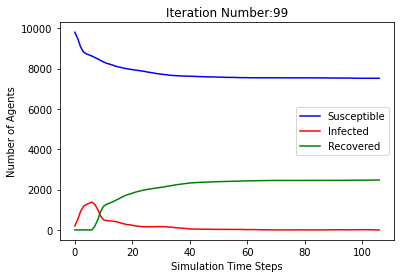

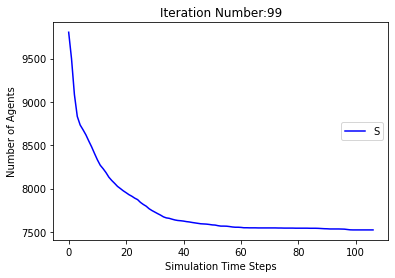

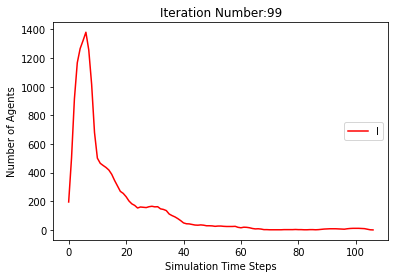

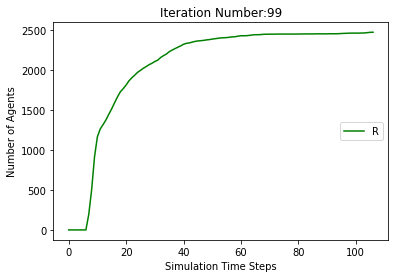

[9805, 9501, 9110, 8876, 8778, 8734, 8686, 8604, 8525, 8446, 8373, 8299, 8247, 8207, 8181, 8160, 8122, 8086, 8055, 8031, 8008, 7986, 7965, 7941, 7922, 7908, 7896, 7882, 7873, 7866, 7857, 7846, 7832, 7820, 7813, 7807, 7801, 7799, 7791, 7785, 7777, 7766, 7763, 7761, 7759, 7755, 7753, 7751, 7750, 7746, 7741, 7734, 7729, 7727, 7721, 7718, 7717, 7715, 7715, 7710, 7709, 7705, 7703, 7700, 7696, 7694, 7690, 7686, 7683, 7680, 7672, 7669, 7668, 7667, 7667, 7665, 7663, 7663, 7663, 7663, 7663, 7663, 7661, 7656, 7654, 7654, 7651, 7649, 7649, 7649, 7648, 7648, 7648, 7648, 7648, 7648, 7648, 7648]
[195, 499, 890, 1124, 1222, 1266, 1314, 1201, 976, 664, 503, 479, 487, 479, 423, 365, 324, 287, 244, 216, 199, 195, 195, 181, 164, 147, 135, 126, 113, 99, 84, 76, 76, 76, 69, 66, 65, 58, 55, 47, 43, 47, 44, 40, 40, 36, 32, 26, 16, 17, 20, 25, 26, 26, 30, 32, 29, 26, 19, 19, 18, 16, 15, 17, 19, 21, 20, 23, 22, 23, 28, 27, 26, 23, 19, 18, 17, 9, 6, 5, 4, 4, 4, 7, 9, 9, 12, 14, 14, 12, 8, 6, 6, 3, 1, 1, 1, 0]
[

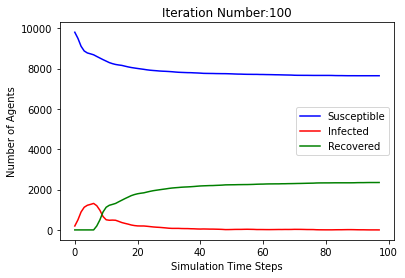

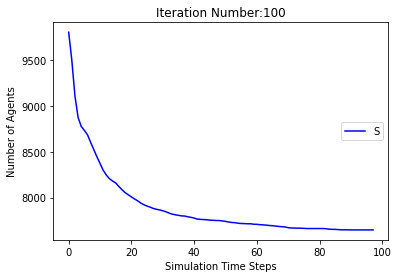

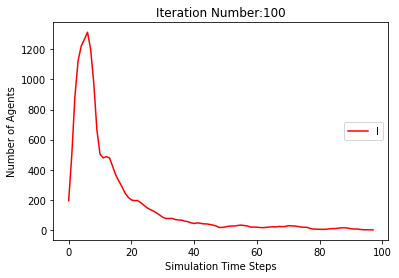

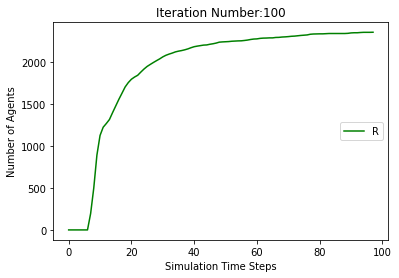

In [13]:
#from numpy import zeros, linspace
#Node_p=Node.copy()
#Node_n=Node.copy() 
#Agent_p=Agent.copy()
#Agent_n=Agent.copy()
#print(Node_p)
#print(Agent_p)
#S,I,R = Count_SIR_Node(Node_n) 
#S1,I1,R1 = Count_SIR_Agent(Agent_n)
#print([S,I,R]) 
#print([S1,I1,R1])
SS,II,RR,TT = [[]],[[]],[[]],[[]]
for i in range(100):
  j=0
  Node_p=Node.copy()
  Node_n=Node.copy() 
  Agent_p=Agent.copy()
  Agent_n=Agent.copy()
  Sj,Ij,Rj = Count_SIR_Node(Node_n) 
  #print([Sj,Ij,Rj]) 
  S,I,R,T = [],[],[],[]
  S.append(Sj)
  I.append(Ij)
  R.append(Rj)
  T.append(j)

  while Ij > 0 :
    Node_p,Node_n,Agent_p,Agent_n = random_walk(Graph,GraphN,Node_n,Agent_n,1,1)
    j+=1 
    #count=0
    #for i in range(len(Node_p)):
    #  count+=len(Node_p[i]) - 4
    #print(count)
    Sj,Ij,Rj = Count_SIR_Node(Node_n) 
    S.append(Sj)
    I.append(Ij)
    R.append(Rj)
    T.append(j)
    #S1,I1,R1 = Count_SIR_Agent(Agent_n)
    #print("Simulation No:",i+1, "Iteration No: ", j)
    #print(Node_n)
    #print(Agent_n)
    #print([Sj,Ij,Rj]) 
    # Plot the data on three separate curves for S(t), I(t) and R(t)
    #print([S1,I1,R1])
  print(S)
  print(I)
  print(R)
  SS.append(S)
  II.append(I)
  RR.append(R)
  TT.append(T)
  print(SS)
  print(II)
  print(RR)
  plt.plot(T, S, 'b', T, I, 'r', T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
  plt.show()  
  
  plt.plot(T, S, 'b')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible"),loc='center right')
  plt.show()

  plt.plot(T, I, 'r')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Infected"),loc='center right')
  plt.show()

  plt.plot(T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Recovered"),loc='center right')
  plt.show()  

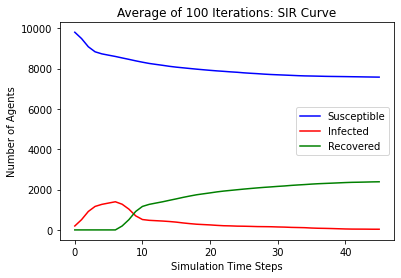

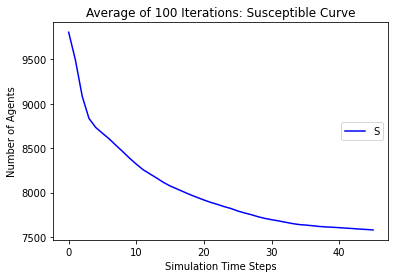

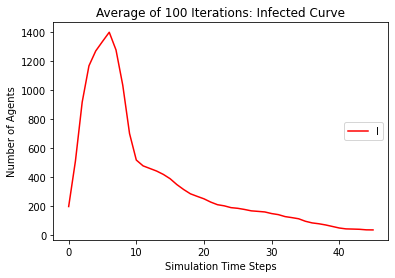

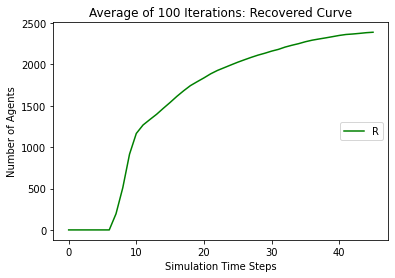

In [14]:
from statistics import mean
SC = SS[1]
IC = II[1]
RC = RR[1]
TC = TT[1]
for i in range(2,100):
  SC = [mean(i) for i in zip(SC,SS[i])] 
  IC = [mean(i) for i in zip(IC,II[i])] 
  RC = [mean(i) for i in zip(RC,RR[i])] 
  TC = [mean(i) for i in zip(TC,TT[i])] 

plt.plot(TC, SC, 'b', TC, IC, 'r', TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: SIR Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
plt.show()  
  
plt.plot(TC, SC, 'b')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Susceptible Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible"),loc='center right')
plt.show()

plt.plot(TC, IC, 'r')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Infected Curve')
plt.ylabel('Number of Agents')
plt.legend(("Infected"),loc='center right')
plt.show()

plt.plot(TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Recovered Curve')
plt.ylabel('Number of Agents')
plt.legend(("Recovered"),loc='center right')
plt.show()  


  
